The Olist dataset is an open source dataset that is available on Kaggle. Olist operates an online e-commerce site for sellers, that connects merchants and their products to main marketplaces. The company is from Brazil. The code demonstrates calling from kaggle api, performing merges on dataframes and analyses on consumer behaviour (effect of freight, estimated delivery times and review scores).

In [0]:
!pip install -U -q kaggle
!mkdir -p ~/.kaggle

In [0]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle (1).json


{'kaggle.json': b'{"username":"clarencetohjw","key":"5fea27d6f06812afc47874ca12a70297"}'}

In [0]:
!cp kaggle.json ~/.kaggle/

In [0]:
# !kaggle competitions download -c house-prices-advanced-regression-techniques
!kaggle datasets download -d olistbr/brazilian-ecommerce
!ls

brazilian-ecommerce.zip: Skipping, found more recently modified local copy (use --force to force download)
 brazilian-ecommerce.zip   data  'kaggle (1).json'   kaggle.json   sample_data


In [0]:
!mkdir data

!unzip brazilian-ecommerce.zip -d data

mkdir: cannot create directory ‘data’: File exists
Archive:  brazilian-ecommerce.zip
replace data/olist_customers_dataset.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: data/olist_customers_dataset.csv  
replace data/olist_geolocation_dataset.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: data/olist_geolocation_dataset.csv  
  inflating: data/olist_order_items_dataset.csv  
  inflating: data/olist_order_payments_dataset.csv  
  inflating: data/olist_order_reviews_dataset.csv  
  inflating: data/olist_orders_dataset.csv  
  inflating: data/olist_products_dataset.csv  
  inflating: data/olist_sellers_dataset.csv  
  inflating: data/product_category_name_translation.csv  


In [0]:
# import specific libraries
# load CSVs
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
orders = pd.read_csv('data/olist_orders_dataset.csv')
order_items = pd.read_csv('data/olist_order_items_dataset.csv')
products = pd.read_csv('data/olist_products_dataset.csv')
translate = pd.read_csv('data/product_category_name_translation.csv')
reviews = pd.read_csv('data/olist_order_reviews_dataset.csv')
payments = pd.read_csv('data/olist_order_payments_dataset.csv')

In [0]:
merged_inner = pd.merge(left=order_items, right=orders, left_on='order_id', right_on='order_id')

In [0]:
final_merge = pd.merge(left=merged_inner, right=products, left_on='product_id', right_on='product_id')

In [0]:
# type(merged_inner.order_estimated_delivery_date[0])final_merge.order_estimated_delivery_date
def get_est_days(x):
    # for i in range(len)
    esti = x.order_estimated_delivery_date#[i].split(' ')[0]
    appr = x.order_approved_at#[i].split(' ')[0]
    days = pd.to_datetime(esti, format='%Y-%m-%d %H:%M:%S', errors='ignore')-pd.to_datetime(appr, format='%Y-%m-%d %H:%M:%S', errors='ignore')
    return days.days

In [0]:
# this provides the estimated numbe of days for delivery
final_merge['estimated days']= final_merge.apply(lambda x : get_est_days(x) , axis=1)

In [0]:
final_merge_eng2 = pd.merge(left=final_merge, right=translate, left_on='product_category_name', right_on='product_category_name')
final_merge_eng1 = pd.merge(left=final_merge_eng2, right=reviews, left_on='order_id', right_on='order_id')
final_merge_eng = pd.merge(left=final_merge_eng1, right=payments, left_on='order_id', right_on='order_id')
final_merge_eng.head(10)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,estimated days,product_category_name_english,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,payment_sequential,payment_type,payment_installments,payment_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,15.0,cool_stuff,97ca439bc427b48bc1cd7177abe71365,5,NaN,"Perfeito, produto entregue antes do combinado.",2017-09-21 00:00:00,2017-09-22 10:57:03,1,credit_card,2,72.19
1,130898c0987d1801452a8ed92a670612,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-07-05 02:44:11,55.9,17.96,e6eecc5a77de221464d1c4eaff0a9b64,delivered,2017-06-28 11:52:20,2017-06-29 02:44:11,2017-07-05 12:00:33,2017-07-13 20:39:29,2017-07-26 00:00:00,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,26.0,cool_stuff,b11cba360bbe71410c291b764753d37f,5,NaN,"lannister como sempre, entregou certinho e den...",2017-07-14 00:00:00,2017-07-17 12:50:07,1,boleto,1,73.86
2,532ed5e14e24ae1f0d735b91524b98b9,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2018-05-23 10:56:25,64.9,18.33,4ef55bf80f711b372afebcb7c715344a,delivered,2018-05-18 10:25:53,2018-05-18 12:31:43,2018-05-23 14:05:00,2018-06-04 18:34:26,2018-06-07 00:00:00,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,19.0,cool_stuff,af01c4017c5ab46df6cc810e069e654a,4,super recomendo,carrinho muito bonito,2018-06-05 00:00:00,2018-06-06 21:41:12,1,credit_card,2,83.23
3,6f8c31653edb8c83e1a739408b5ff750,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-07 18:55:08,58.9,16.17,30407a72ad8b3f4df4d15369126b20c9,delivered,2017-08-01 18:38:42,2017-08-01 18:55:08,2017-08-02 19:07:36,2017-08-09 21:26:33,2017-08-25 00:00:00,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,23.0,cool_stuff,8304ff37d8b16b57086fa283fe0c44f8,5,NaN,NaN,2017-08-10 00:00:00,2017-08-13 03:35:17,1,credit_card,3,75.07
4,7d19f4ef4d04461989632411b7e588b9,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-16 22:05:11,58.9,13.29,91a792fef70ecd8cc69d3c7feb3d12da,delivered,2017-08-10 21:48:40,2017-08-10 22:05:11,2017-08-11 19:43:07,2017-08-24 20:04:21,2017-09-01 00:00:00,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,21.0,cool_stuff,426f43a82185969503fb3c86241a9535,5,NaN,NaN,2017-08-25 00:00:00,2017-08-28 00:51:18,1,credit_card,4,72.19
5,a0f9acf0b6294ed8561e32cde1a966bc,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-03 15:23:46,55.9,26.93,4851b3bca4a48b395dfad7aa57c3f72a,delivered,2017-07-27 15:11:51,2017-07-28 15:23:46,2017-08-02 18:32:34,2017-08-31 20:19:52,2017-08-24 00:00:00,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,26.0,cool_stuff,c752337ac465a5e2fbdbedf7d79c6659,5,NaN,NaN,2017-08-27 00:00:00,2017-08-27 12:30:09,1,credit_card,1,82.83
6,bbf796534aaf9c59f8da8c7982db56e0,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2018-03-26 03:28:44,64.9,38.50,c32c207d9ebf75958011557ac1624e2f,delivered,2018-03-18 21:00:44,2018-03-20 03:28:44,2018-03-20 18:08:45,2018-03-28 21:57:44,2018-04-12 00:00:00,cool_stuff,58.0,598.0,4.0,650.0,28.0,9.0,14.0,22.0,cool_stuff,b41646a4365a1411101396c097413907,5,NaN,"Muito bom chegou bem antes do prazo, produto d...",2018-03-29 00:00:00,2018-03-30 12:41:53,1,boleto,1,103.40
7,c9ef97d2854afe64a3b4488bc2836af6,2,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,201

In [0]:
print('Percentage of unique orders against total orders')
print(str(round(final_merge_eng.order_id.nunique()/len(final_merge_eng),2)) + '%')

Percentage of unique orders against total orders
0.83%


In [0]:
print('Number of unique products')
final_merge_eng.product_id.nunique()

Number of unique products


32328

In [0]:
list_cat=final_merge_eng.product_category_name_english.unique().tolist()

In [0]:
print('Top 20 most popular products')
list_top_20 = final_merge_eng.product_id.value_counts().sort_values()[::-1][:20].index.tolist()
final_merge_eng.product_id.value_counts().sort_values()[::-1][:20]

Top 20 most popular products


aca2eb7d00ea1a7b8ebd4e68314663af    536
99a4788cb24856965c36a24e339b6058    528
422879e10f46682990de24d770e7f83d    508
389d119b48cf3043d311335e499d9c6b    406
368c6c730842d78016ad823897a372db    398
53759a2ecddad2bb87a079a1f1519f73    391
d1c427060a0f73f6b889a5c7c61f2ac4    357
53b36df67ebb7c41585e8d54d6772e08    327
154e7e31ebfa092203795c972e5804a6    295
3dd2a17168ec895c781a9191c1e95ad7    278
2b4609f8948be18874494203496bc318    275
7c1bd920dbdf22470b68bde975dd3ccf    242
a62e25e09e05e6faf31d90c6ec1aa3d1    228
bb50f2e236e5eea0100680137654686c    210
e0d64dcfaa3b6db5c54ca298ae101d05    202
e53e557d5a159f5aa2c5e995dfdf244b    192
35afc973633aaeb6b877ff57b2793310    189
42a2c92a0979a949ca4ea89ec5c7b934    185
b532349fe46b38fbc7bb3914c1bdae07    181
f1c7f353075ce59d8a6f3cf58f419c9c    164
Name: product_id, dtype: int64

In [0]:
import seaborn as sns
font = {'family' : 'DejaVu Sans',
        'weight' : 'bold',
        'size'   : 22}

plt.rc('font', **font)
def most_pop(cat):
    df = final_merge_eng[final_merge_eng['product_category_name_english']==cat]
    print('Top 20 most popular products in '+ cat)
    product = df.product_id.value_counts().sort_values()[::-1][:20].index.tolist()
    count = df.product_id.value_counts().sort_values()[::-1][:20].tolist()
    esti=[];rev=[]
    for y in product:
        esti.append(df[df['product_id']==y]['estimated days'].mean())
        rev.append(df[df['product_id']==y]['review_score'].mean())
    output = pd.DataFrame(list(zip(product, count,esti,rev)), columns =['Product Id', 'Number of Orders','Estimated Delivery (Mean in days)','Review Score (Mean / 5.0)'])
    output.index=list(range(1,len(output)+1))
    return output
def plot_est(cat):
    df = final_merge_eng[final_merge_eng['product_category_name_english']==cat]
    print('Top 20 most popular products in '+ cat)
    product = df.product_id.value_counts().sort_values()[::-1][:20].index.tolist()
    count = df.product_id.value_counts().sort_values()[::-1][:20].tolist()
    esti=[];rev=[]
    for y in product:
        esti.append(df[df['product_id']==y]['estimated days'].mean())
        rev.append(df[df['product_id']==y]['review_score'].mean())
    output = pd.DataFrame(list(zip(product, count,esti,rev)), columns =['Product Id', 'Number of Orders','Estimated Delivery (Mean in days)','Review Score (Mean / 5.0)'])
    output.index=list(range(1,len(output)+1))
    plt.figure(figsize=(16,10))
    output['Estimated Delivery (Mean in days)'].plot()
    plt.title('Plot of estimated delivery for top '+str(len(output))+' most bought products in ' + cat)
    plt.ylabel('Days')
    plt.xlabel('Products (Top 1 to '+ str(len(output))+ ')')
    plt.axhline(y=df['estimated days'].mean(), color='r', linestyle='-')
    plt.legend()
    sns.regplot(x=output.index,y='Estimated Delivery (Mean in days)',data=output, fit_reg=True) 
    plt.show()
def plot_rev(cat):
    df = final_merge_eng[final_merge_eng['product_category_name_english']==cat]
    print('Top 20 most popular products in '+ cat)
    product = df.product_id.value_counts().sort_values()[::-1][:20].index.tolist()
    count = df.product_id.value_counts().sort_values()[::-1][:20].tolist()
    esti=[];rev=[]
    for y in product:
        esti.append(df[df['product_id']==y]['estimated days'].mean())
        rev.append(df[df['product_id']==y]['review_score'].mean())
    output = pd.DataFrame(list(zip(product, count,esti,rev)), columns =['Product Id', 'Number of Orders','Estimated Delivery (Mean in days)','Review Score (Mean / 5.0)'])
    output.index=list(range(1,len(output)+1))
    plt.figure(figsize=(16,10))
    output['Review Score (Mean / 5.0)'].plot(label='individual review score')
    plt.title('Plot of review score for top '+str(len(output))+' most bought products in ' + cat)
    plt.ylabel('Score (/ 5.0)')
    plt.xlabel('Products (Top 1 to '+ str(len(output))+ ')')
    # df['review_score'].mean().plot(label='mean review score for '+cat) 
    plt.axhline(y=df['review_score'].mean(), color='r', linestyle='-')
    plt.legend()
    sns.regplot(x=output.index,y='Review Score (Mean / 5.0)',data=output, fit_reg=True) 
    plt.show()

Top 20 most popular products in cool_stuff
                          Product Id  Number of Orders  \
1   601a360bd2a916ecef0e88de72a6531a               137   
2   c6dd917a0be2a704582055949915ab32               122   
3   165f86fe8b799a708a20ee4ba125c289               120   
4   54d9ac713e253fa1fae9c8003b011c2a               116   
5   29427de7f8a9ee983d9dbc51cec569b4                97   
6   ee406bf28024d97771c4b1e8b7e8e219                92   
7   3354a4e684f5e7199f9407db70ccd92b                73   
8   5f504b3a1c75b73d6151be81eb05bdc9                63   
9   e59dd207c69d86e890febadc796d1078                63   
10  ddceb6eef6af67e9fbbd4c148dbe5fd9                52   
11  4413a608a42bd21bbf9d5abbd58c249a                52   
12  cc971e0365873137b8bef2ebad633e6f                50   
13  11fd9d7ba552e1d28872e008acf1e050                50   
14  f264c1d9b20b5e4a340254d0405e613b                50   
15  8317b177579dd27ff068b83205e2169b                49   
16  fe6a9515d655fa7936b8a7c84

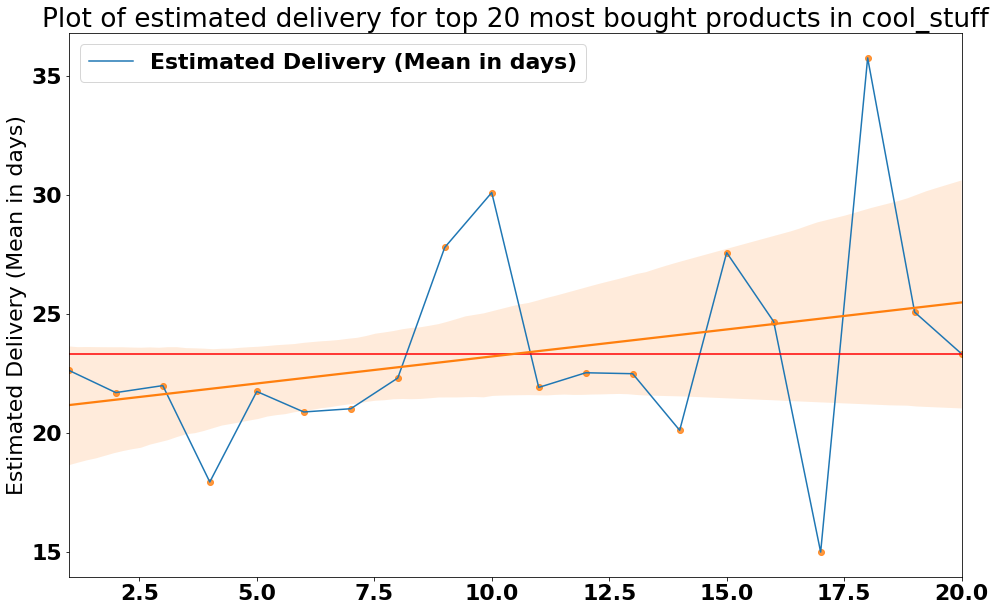

None
Top 20 most popular products in cool_stuff


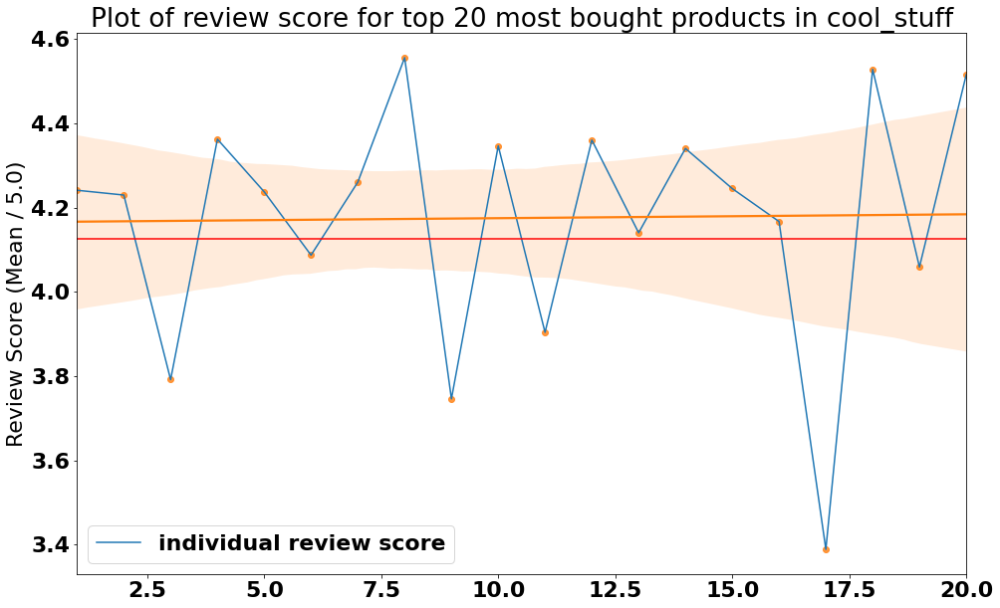

None


Top 20 most popular products in baby
                          Product Id  Number of Orders  \
1   cac9e5692471a0700418aa3400b9b2b1               100   
2   ea44caac707f7f1325182a538007f838                64   
3   8aa6223e400af9c97b07c75993142721                48   
4   57e089e3103f5cda6a4ce23b77399bdb                47   
5   25c38557cf793876c5abdd5931f922db                44   
6   a298a105818dce6878b787e4af6cff7d                40   
7   83b00325c13c44245b2c3a2befa62a0e                39   
8   af2d506fb01b724e03591349ad36b67e                39   
9   7f4e034245e45549110139d1de248f83                35   
10  0cf41187284d7f099adc8415a743ebbd                35   
11  990d135e28e075648cb7d83198fdccf4                27   
12  e85d91619b497e98754390b6198a9818                26   
13  c8cfa622661e047ea2499f8bce4731a5                26   
14  dd4c3b4ab7e001aaf385ea2e68952030                25   
15  bb7181410b4e02f93f3697f765db53c7                24   
16  14dffa241a078aeaebaef48a

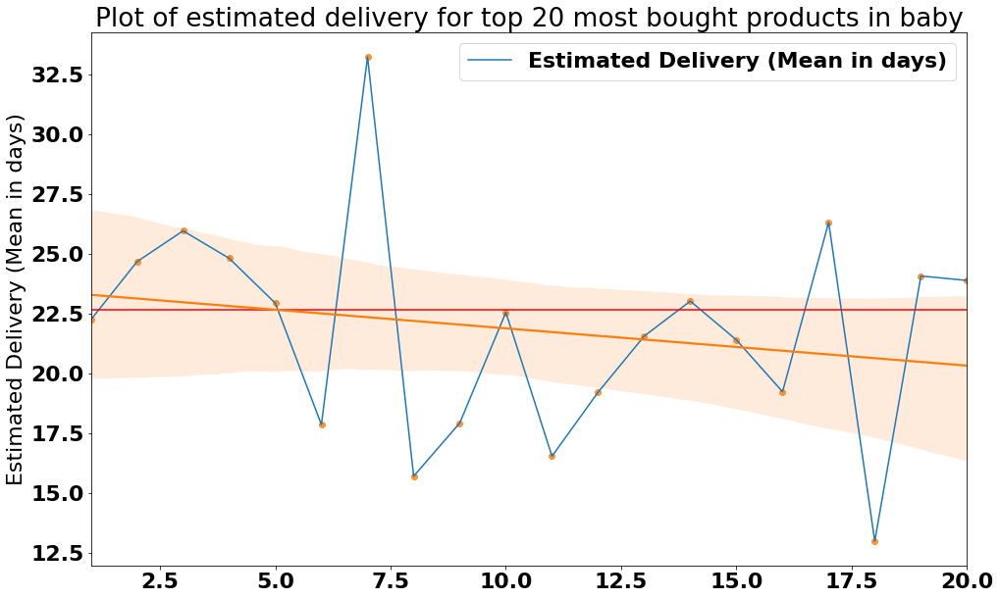

None
Top 20 most popular products in baby


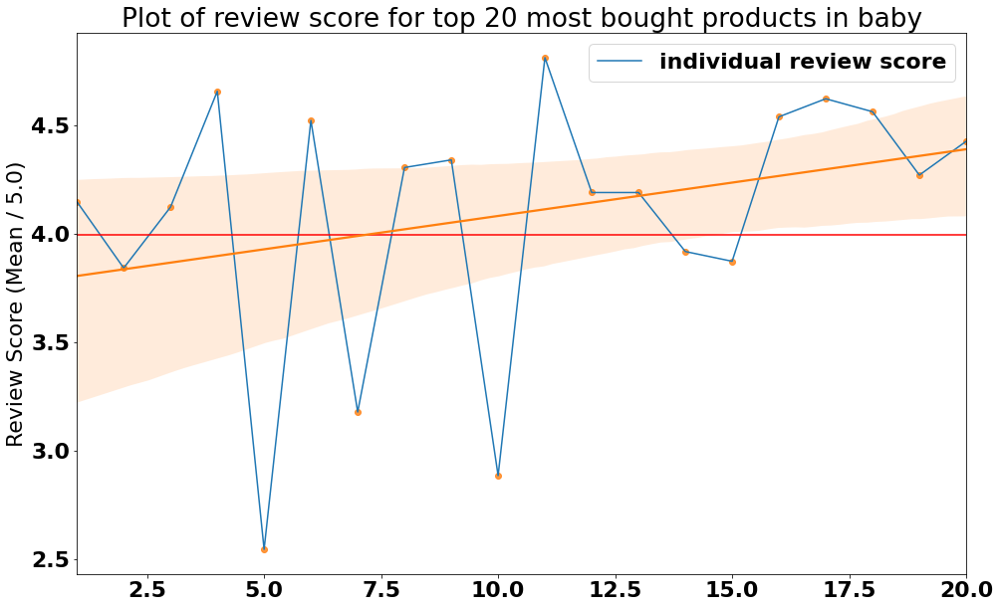

None


Top 20 most popular products in bed_bath_table
                          Product Id  Number of Orders  \
1   99a4788cb24856965c36a24e339b6058               528   
2   f1c7f353075ce59d8a6f3cf58f419c9c               164   
3   06edb72f1e0c64b14c5b79353f7abea3               151   
4   ec2d43cc59763ec91694573b31f1c29a               132   
5   777d2e438a1b645f3aec9bd57e92672c               118   
6   84f456958365164420cfc80fbe4c7fab               115   
7   363218ba55c610b750224f90bdd34be1                88   
8   64fb265487de2238627ce43fe8a67efc                75   
9   0152f69b6cf919bcdaf117aa8c43e5a2                73   
10  2a2d22ae30e026f1893083c8405ca522                72   
11  bd6e6fce9ada76ea2db0f1912e8e478f                70   
12  25f86162fee18735fffdb762dcb10d7c                67   
13  fbce4c4cb307679d89a3bf3d3bb353b9                63   
14  386486367c1f9d4f587a8864ccb6902b                60   
15  fc1d8637c0268af3db482c14b7ef8e75                59   
16  704ef63ad0ac34

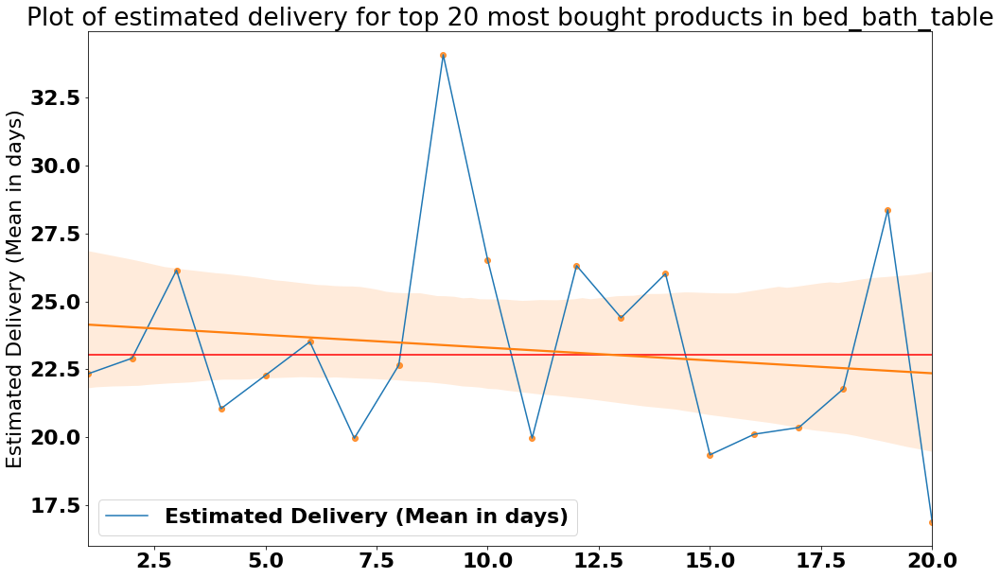

None
Top 20 most popular products in bed_bath_table


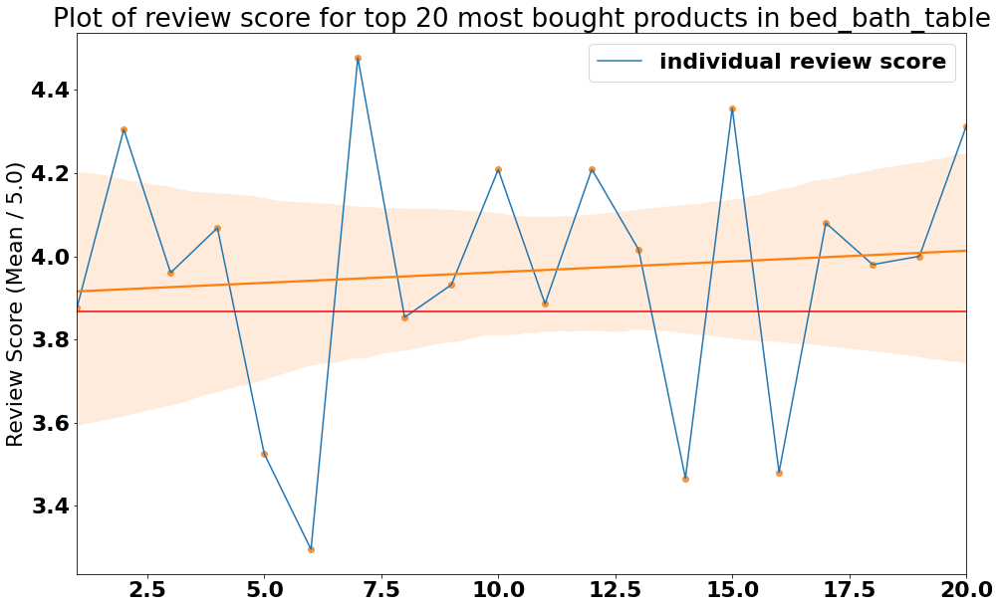

None


Top 20 most popular products in computers_accessories
                          Product Id  Number of Orders  \
1   d1c427060a0f73f6b889a5c7c61f2ac4               357   
2   3dd2a17168ec895c781a9191c1e95ad7               278   
3   e53e557d5a159f5aa2c5e995dfdf244b               192   
4   656e0eca68dcecf6a31b8ececfabe3e8               142   
5   36f60d45225e60c7da4558b070ce4b60               139   
6   d5991653e037ccb7af6ed7d94246b249               107   
7   3f14d740544f37ece8a9e7bc8349797e                99   
8   4298b7e67dc399c200662b569563a2b2                94   
9   dbb67791e405873b259e4656bf971246                91   
10  d04857e7b4b708ee8b8b9921163edba3                85   
11  18b0e642cbae7251e60a64aa07dd9eb9                82   
12  bee2e070c39f3dd2f6883a17a5f0da45                80   
13  0d85c435fd60b277ffb9e9b0f88f927a                73   
14  89b121bee266dcd25688a1ba72eefb61                69   
15  06c6e01186af8b98ee1fc9e01f9471e9                62   
16  f71f42e

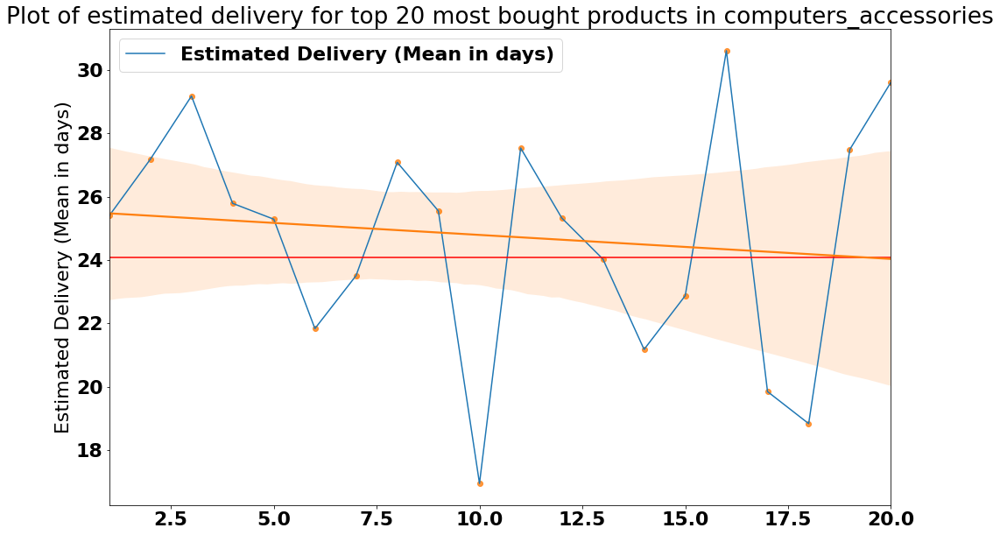

None
Top 20 most popular products in computers_accessories


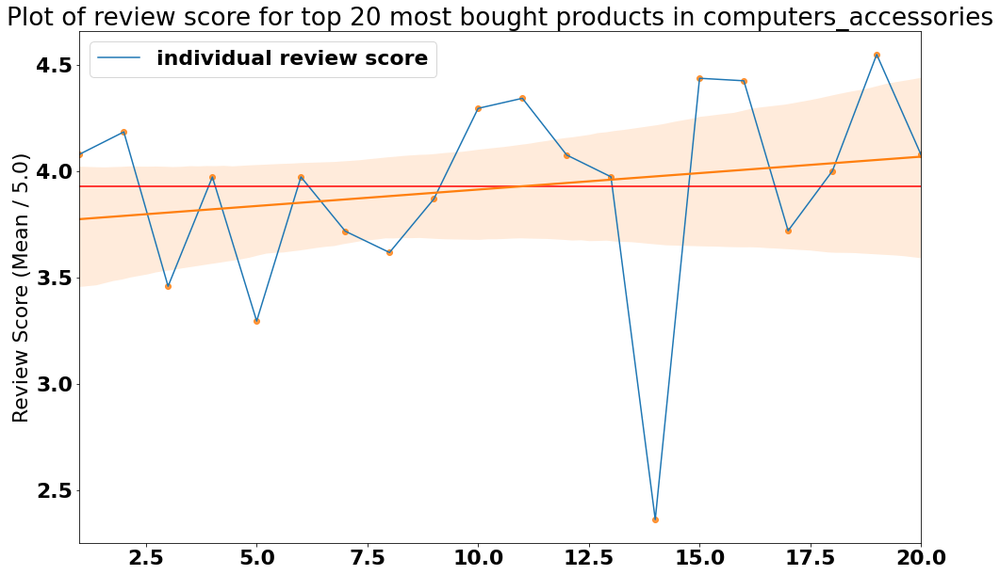

None


Top 20 most popular products in watches_gifts
                          Product Id  Number of Orders  \
1   53b36df67ebb7c41585e8d54d6772e08               327   
2   a62e25e09e05e6faf31d90c6ec1aa3d1               228   
3   e0d64dcfaa3b6db5c54ca298ae101d05               202   
4   a92930c327948861c015c919a0bcb4a8               164   
5   461f43be3bdf8844e65b62d9ac2c7a5a               148   
6   7a10781637204d8d10485c71a6108a2e               146   
7   d285360f29ac7fd97640bf0baef03de0               126   
8   6f3b5b605d91b7439c5e3f5a8dffeea7               121   
9   0a57f7d2c983bcf8188589a5fea4a8da               106   
10  2136c70bbe723d338fab53da3c03e6dc                97   
11  43423cdffde7fda63d0414ed38c11a73                96   
12  41c24b8ce92d1a2cac62db5edfd088b2                64   
13  c3ba4e8d3cb30049213b682e751e9d00                58   
14  f819f0c84a64f02d3a5606ca95edd272                56   
15  2ffdf10e724b958c0f7ea69e97d32f64                53   
16  69455f41626a745

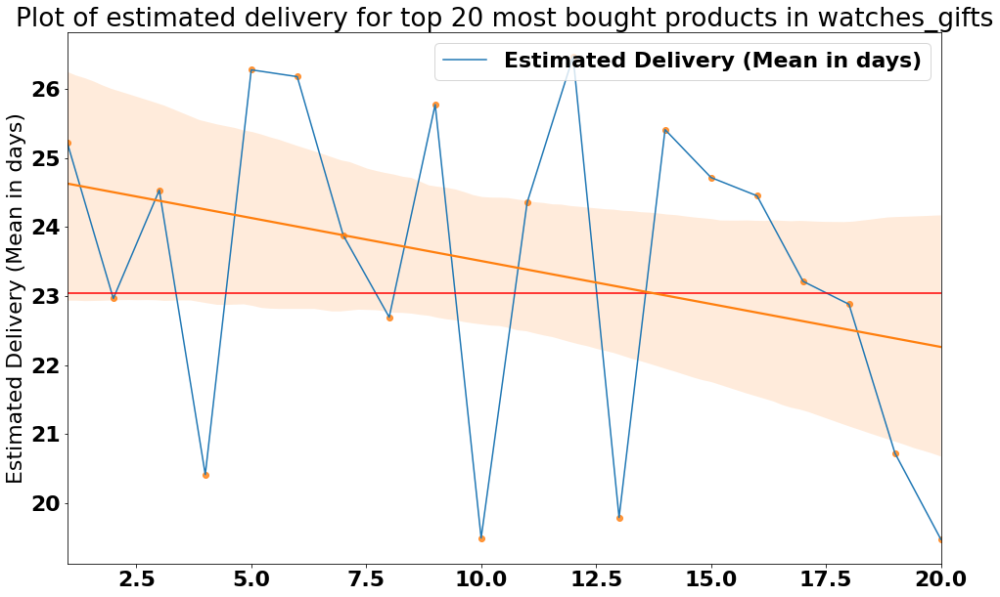

None
Top 20 most popular products in watches_gifts


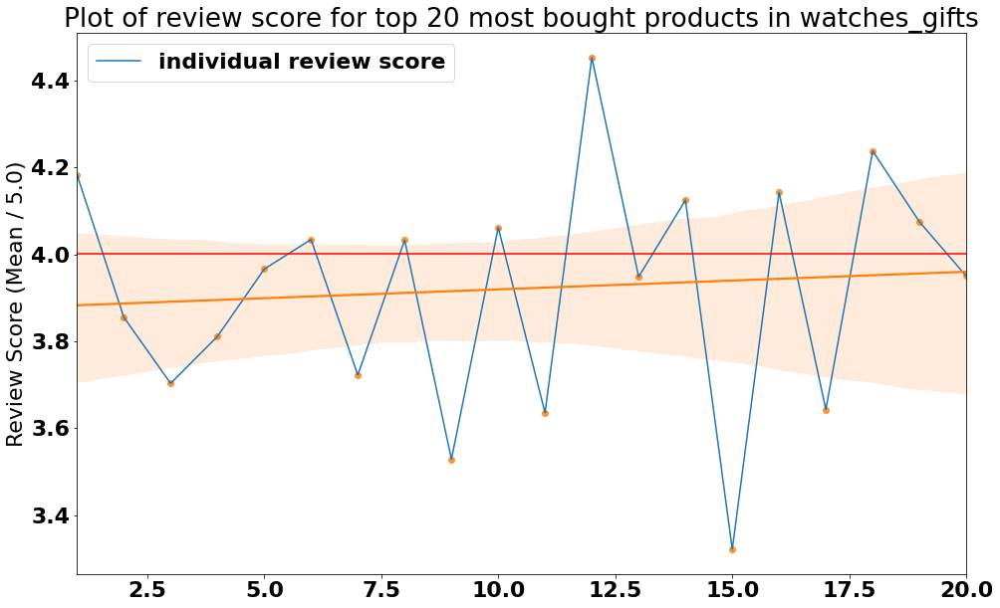

None


Top 20 most popular products in toys
                          Product Id  Number of Orders  \
1   880be32f4db1d9f6e2bec38fb6ac23ab               106   
2   b5e13c9a353102f79c6206ff5cb61a50                94   
3   b623b7cb05ee3248fbe4a6ecbeed79a4                74   
4   aa280035c50ba62c746480a59045eec4                48   
5   7fab1a1472fdd934397068931f63f3ca                48   
6   7f72a8900b3d2fc8fa2635b7836d6e6e                46   
7   d5b703c271f43f9c588a6f512a00f77e                45   
8   e9def91e99c8ecb7c5cef5e31506a056                45   
9   31a2f42a87890f87d77daebdfabc182e                43   
10  dc404a1496a08f9f5540c8b5d4b92925                39   
11  dd6a505f83dd3c6326aa9856519e0978                37   
12  fb7a100ec8c7b34f60cec22b1a9a10e0                36   
13  5b3b5f9ae84ca9ead3138b199420cc94                34   
14  25e2023ed83352bde98dc1490d14c3d8                33   
15  72d3bf1d3a790f8874096fcf860e3eff                33   
16  23bcd6822a33df5534f9b290

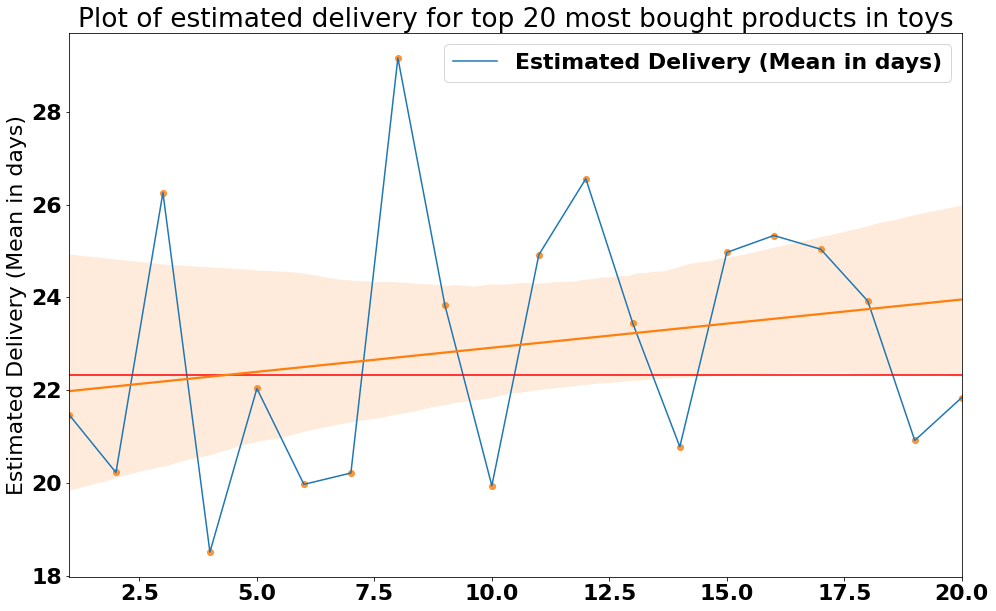

None
Top 20 most popular products in toys


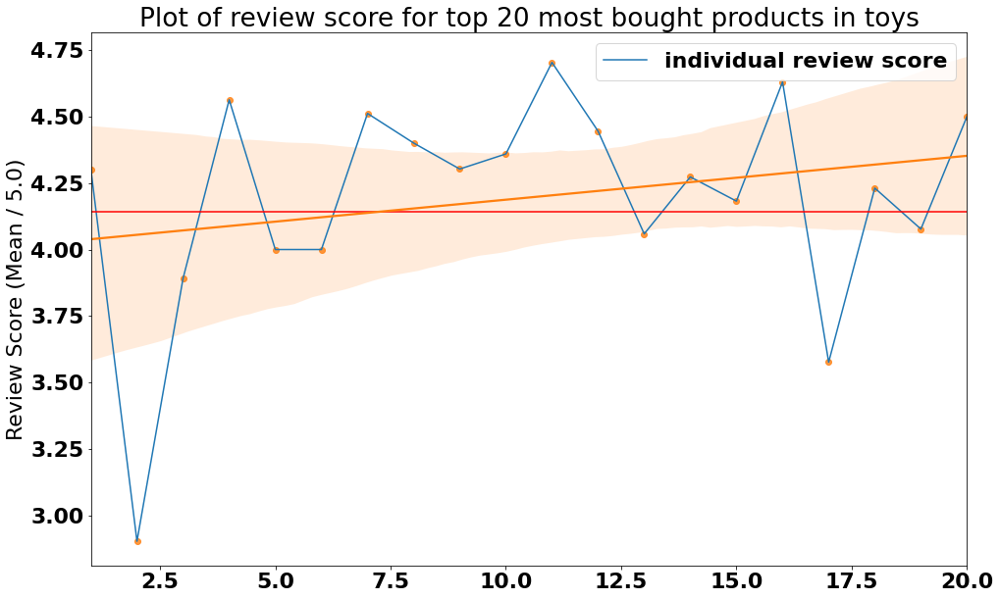

None


Top 20 most popular products in consoles_games
                          Product Id  Number of Orders  \
1   0aabfb375647d9738ad0f7b4ea3653b1               146   
2   6c3effec7c8ddba466d4f03f982c7aa3                99   
3   2bd9b51a9ab079e095aca987845d3266                29   
4   4deb009c36a910076a023947a7929201                26   
5   fb01a5fc09b9b9563c2ee41a22f07d54                25   
6   f39a8b27ce90ac582103bf36f09690dd                24   
7   f03859e4cc21018569f5ae7a03897ff4                16   
8   f102842fbe436027eeeb7fc76d3063aa                15   
9   757e8df3e7c5c52482db573f5f368e1d                13   
10  72a137b85d5a1d82cde242493f118f43                13   
11  f9a508234fed38c95437c5a16b847774                13   
12  04dc26a02c448f6f2b914f01c2902ebd                12   
13  391a014a66920fa0ce468319264e0232                12   
14  bf16de726d9f702aee68610fe171d70e                11   
15  db7f3f42ccab32fa6328b3063b278bcc                11   
16  94a6c010ef78e6

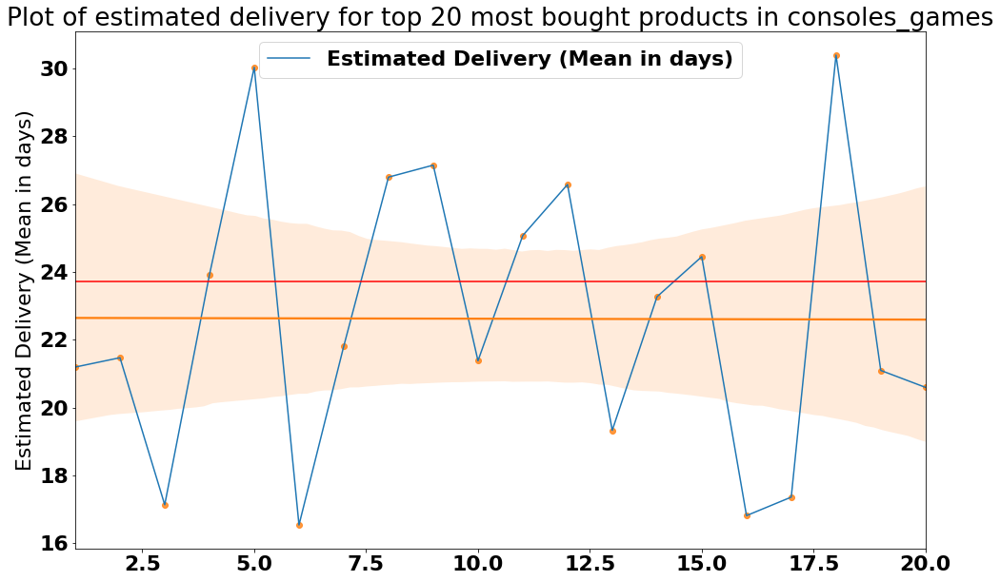

None
Top 20 most popular products in consoles_games


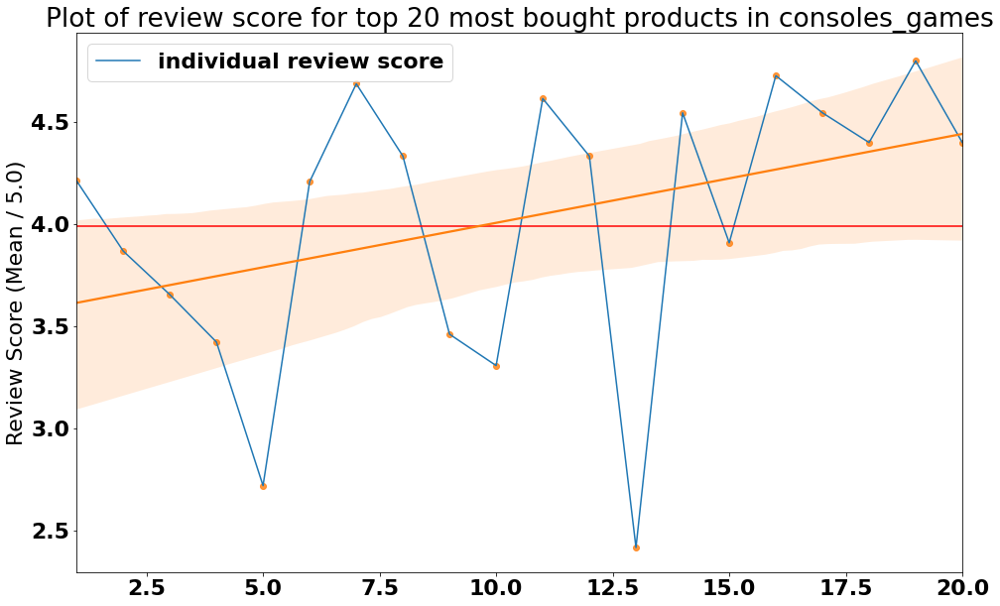

None


Top 20 most popular products in furniture_decor
                          Product Id  Number of Orders  \
1   aca2eb7d00ea1a7b8ebd4e68314663af               536   
2   b532349fe46b38fbc7bb3914c1bdae07               181   
3   78efe838c04bbc568be034082200ac20               110   
4   9ecadb84c81da840dbf3564378b586e9               106   
5   eb8c629f70275fd1c4f809116cce1efc                95   
6   a19b6951c75da43aad691622dd2f6abe                63   
7   7814c273ab16783d73a9863ebfa8b141                63   
8   764292b2b0f73f77a0272be03fdd45f3                59   
9   c857b96593773e940454e76efa8eabb3                58   
10  c7fd13b5e515bffdab855d0812842edb                52   
11  569ffd16f8032478cbeb9800f2e94ba0                49   
12  5d6bea33648f018dbb563f3a2fab09f3                48   
13  962a6951154f98f2c8e9a5b8b2bcf4a9                46   
14  a5341e3f8155dbb3e62323d3ea289729                42   
15  a6ad77b15e566298a4e8ee2011ab1255                41   
16  c2ece64199af7

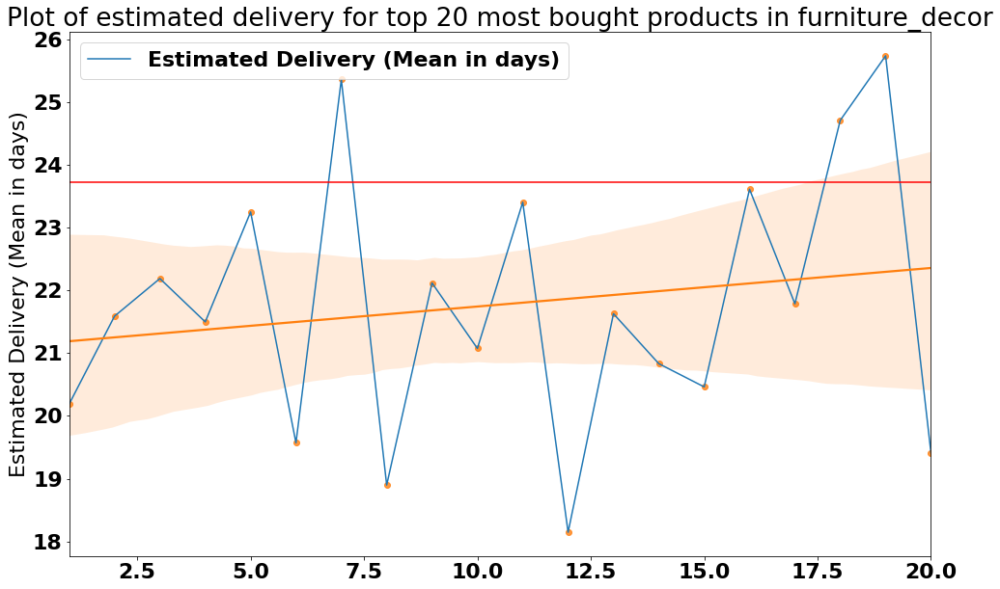

None
Top 20 most popular products in furniture_decor


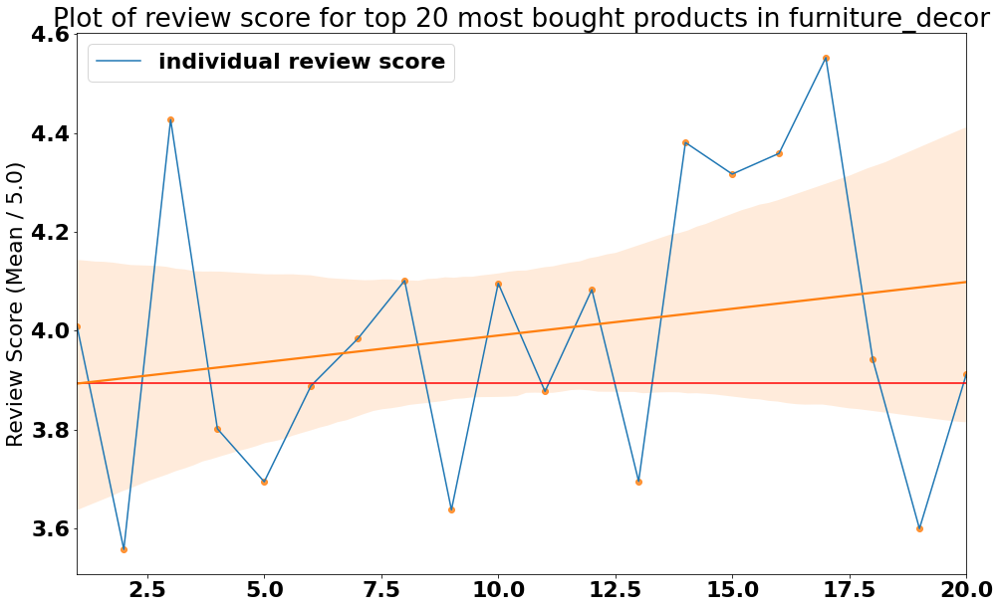

None


Top 20 most popular products in sports_leisure
                          Product Id  Number of Orders  \
1   c6336fa91fbd87c359e44f5dca5a90ed                94   
2   e44f675b60b3a3a2453ec36421e06f0f                84   
3   cec09725da5ed01471d9a505e7389d37                76   
4   362b773250263786dd58670d2df42c3b                74   
5   d3c044bd42d84a79e3b0c42662806a48                72   
6   11875b30b49585209e608f40e8082e65                68   
7   44a34214a57dc373dcd80f54c919d006                63   
8   19421075ae0b585f2dc13ff149e2119d                60   
9   781afe929e3016a667f5f439afd55fce                59   
10  054515fd15bc1a2029f10de97ffa9120                56   
11  72172e982e8b92155069e4201c92c0bb                51   
12  583f158587cdecda3e8bdea694021e39                47   
13  727a46f0b58a9ef165af9f7ebcfebfa9                42   
14  7d50930301709838d8e90dcac5cfaa84                42   
15  ecbe1ef7e2903ff8b1d704ba78fa264d                41   
16  9d8a0e115e802d

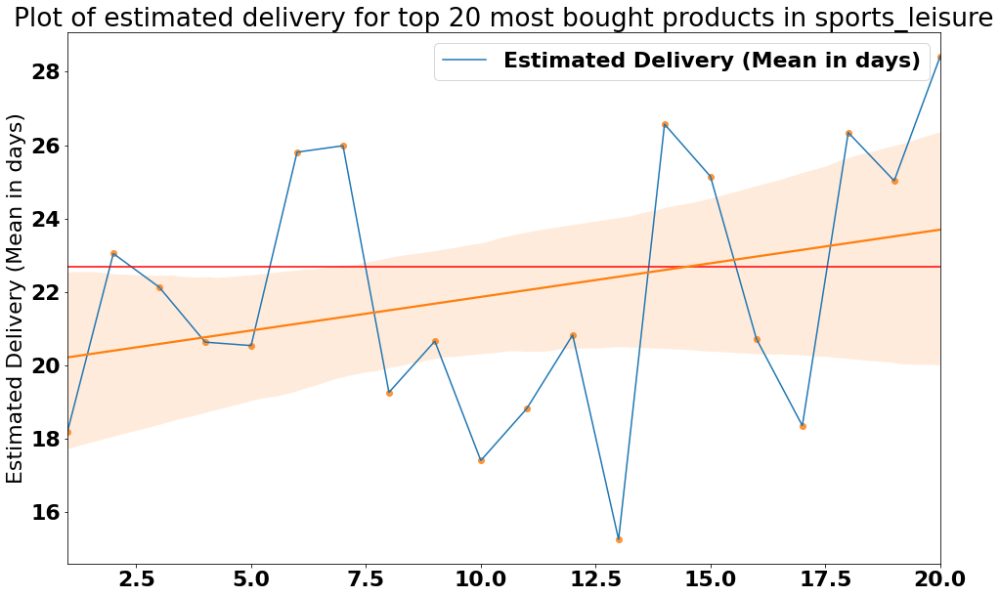

None
Top 20 most popular products in sports_leisure


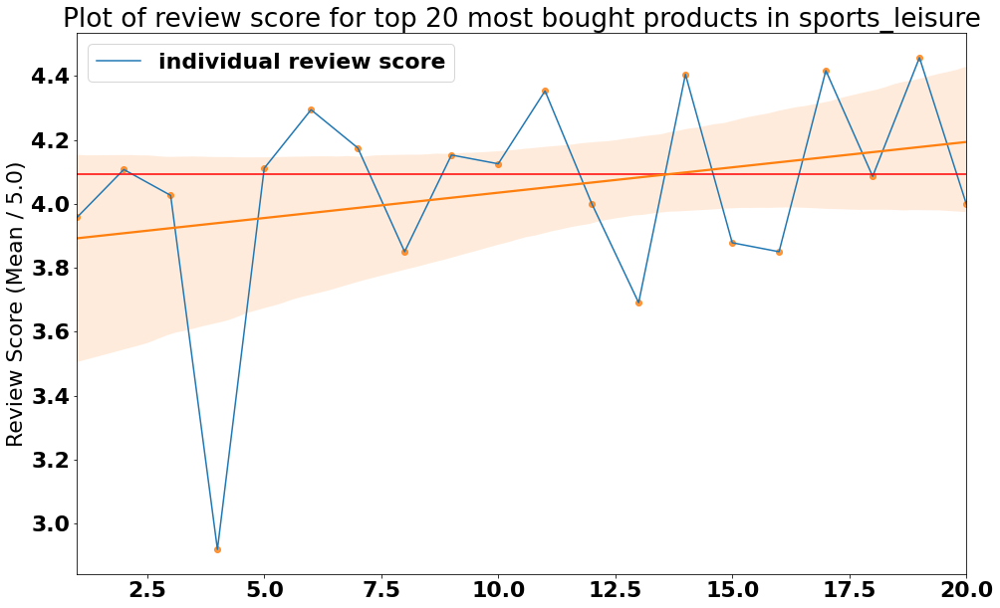

None


Top 20 most popular products in books_general_interest
                          Product Id  Number of Orders  \
1   f35927953ed82e19d06ad3aac2f06353                59   
2   9d0bb30eed80184666c8acad23921283                19   
3   1cc61b32763a4d816212b3507b6b6c59                12   
4   095cb863f2b04911455ad33f5177062e                11   
5   179363fe9f0eee05ad34df83c160dbcf                10   
6   310b40ec41fbfc061e5309006482e68a                 9   
7   e5f3a09149ee7db697907f61e7366267                 9   
8   480be8d20c4b6a7df1eae0f2c17f2db2                 9   
9   d0b9d3d449a97f582b325f11b512bfd2                 8   
10  916bcfd7e756e0b65372da1378d1c125                 8   
11  b9ca577f48894c59a9677f895f9a44bc                 7   
12  d48a0a53664a92739f3ff40cdae9078e                 7   
13  10f2ada0cff82206dc9afa52ebac690b                 7   
14  1c33c71830d320620439a3236a1c4ae1                 7   
15  b5f7245e14a8a3d52f0a6e468971e6d9                 7   
16  e2cac6

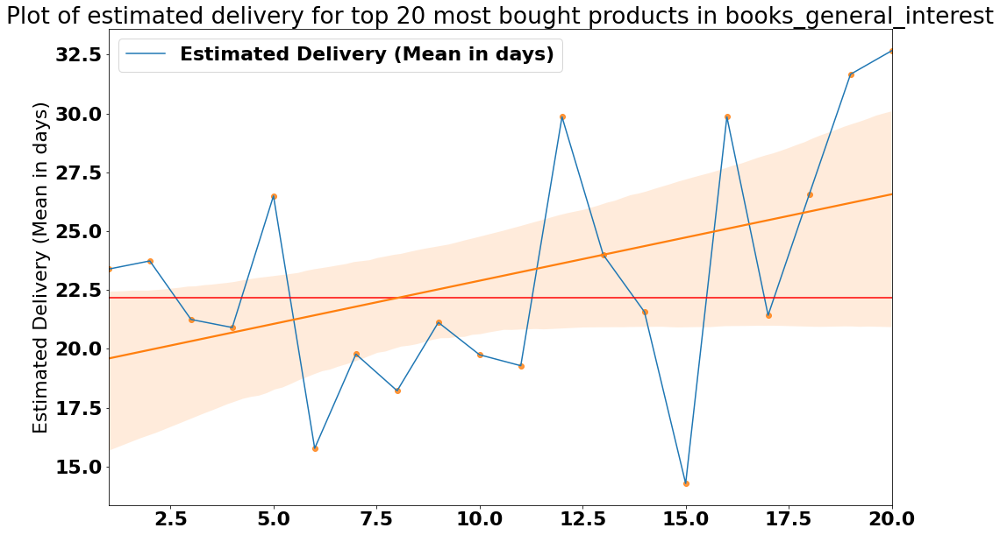

None
Top 20 most popular products in books_general_interest


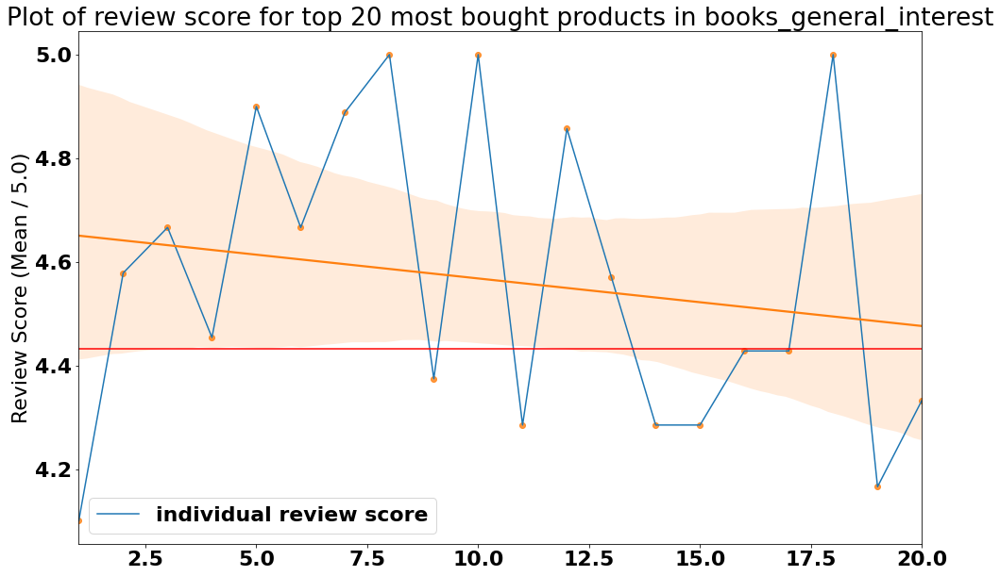

None


Top 20 most popular products in construction_tools_safety
                          Product Id  Number of Orders  \
1   82c51c3938503a4ddc096fbed86428d6                25   
2   56c221c4c1a4a98293895c4563cdc6bf                12   
3   3b473a6b1c280e0345e876648a61a032                 7   
4   88ffcf27478318ba55b1f9d22d65ce97                 7   
5   3b91132e7eebaa17b615edbcdb5baa8e                 6   
6   6f4f2bb136fd2d8e8229355d8fec6b67                 5   
7   7d490fb7ec6eac63302590beef157c10                 5   
8   24daadd871657fb36dacde66b92cf0ff                 5   
9   67217c43d81dea5a93bea48c23f4e156                 5   
10  ee54bc9ad38ada9c4692f91362601c9e                 4   
11  4fe43f61e04cd41cadc3bebf606fe77b                 4   
12  9e47ae55f9327141d2dc2cbca3317e49                 4   
13  64976272fa76578e7bb56f6d6d942ef6                 4   
14  8e6dfb07d2c8f0e078107d9e8d3559af                 3   
15  42fd6f72ca3e6f53b25d7a19b0536630                 3   
16  b4b

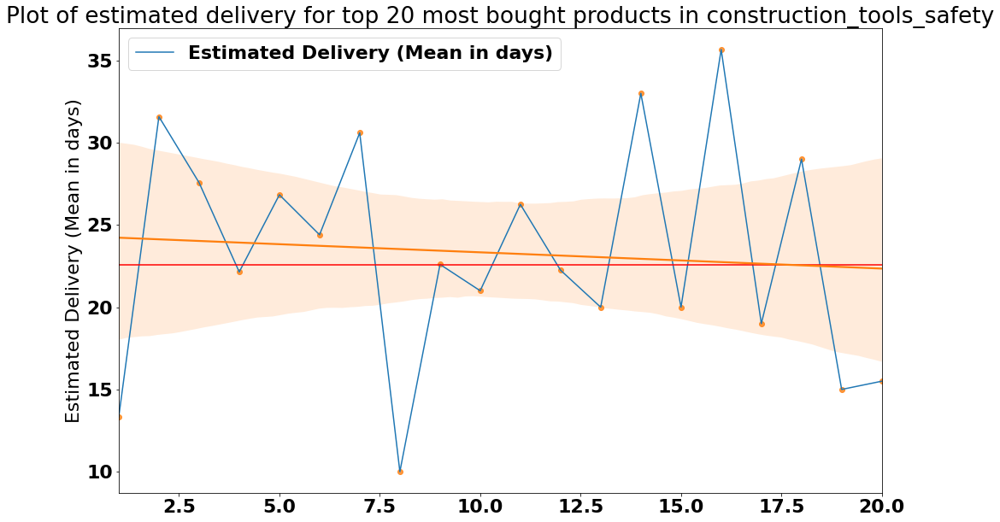

None
Top 20 most popular products in construction_tools_safety


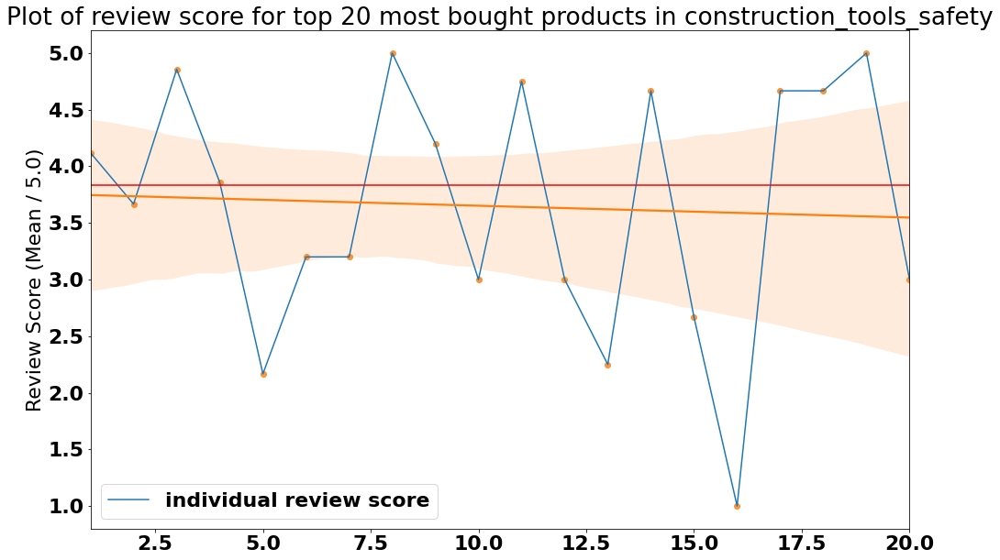

None


Top 20 most popular products in telephony
                          Product Id  Number of Orders  \
1   e7cc48a9daff5436f63d3aad9426f28b               100   
2   c9c6fde711572c1ad99ca12728c6af00                79   
3   97017430754804328eb9597b7f85da03                69   
4   dab2413ead0edda9967edbc9bda2a64e                68   
5   8c5876b1c7768217964f353bc7e64393                60   
6   afeeea6271148ee1bb15173b8187c431                53   
7   431d674f9a4fbd0957ecf6ba3fcb6899                53   
8   4ae634441e444ca4bc85903cafe98d73                52   
9   036734b5a58d5d4f46b0616ddc047ced                49   
10  c1f5307decb89342351bec53668cffd9                48   
11  3b0f7951038b105522c2d566b54421f7                46   
12  41db6d8062fcd38410c699743ccc0265                37   
13  e282624d8c82e04983f125e167eb4521                35   
14  23365beed316535b4105bd800c46670e                33   
15  044f05bc9de36e8a693a83e4bc79dd0d                32   
16  57d79905de06d889787

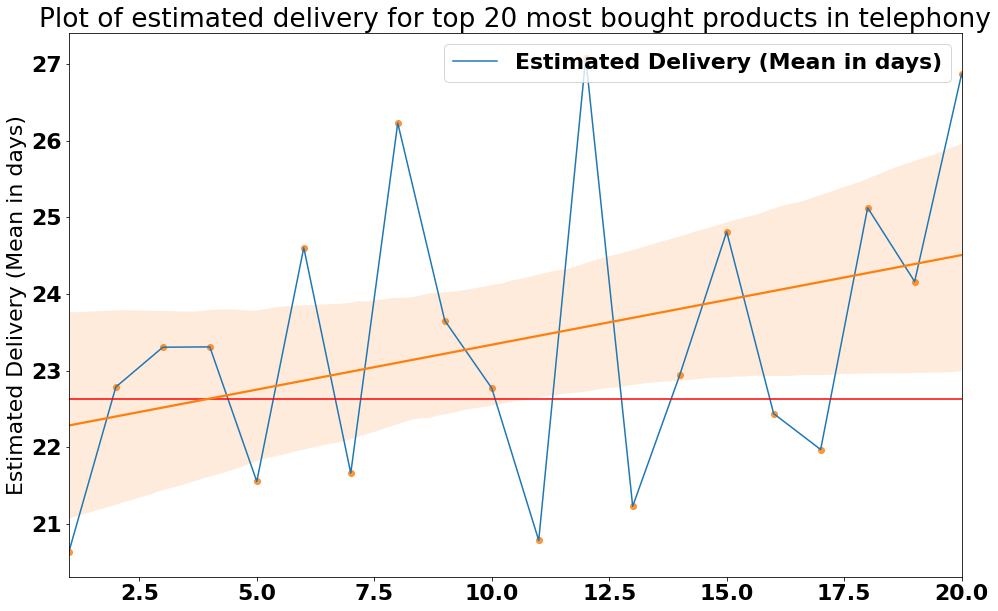

None
Top 20 most popular products in telephony


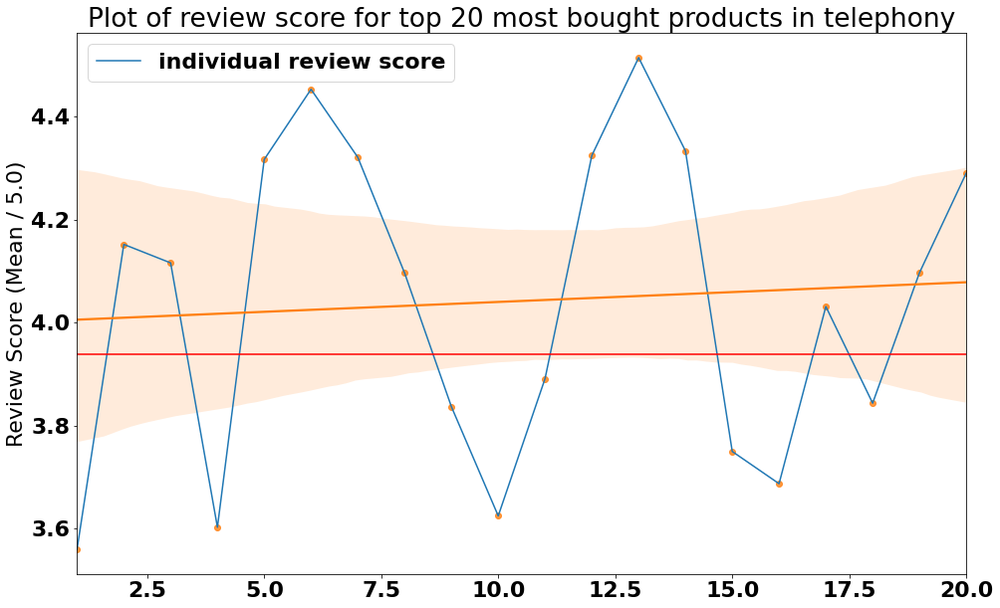

None


Top 20 most popular products in housewares
                          Product Id  Number of Orders  \
1   42a2c92a0979a949ca4ea89ec5c7b934               185   
2   5a6e53c3b4e8684b13388d6aa4afdf12                74   
3   f7a17d2c51d9df89a4f1711c4ac17f33                70   
4   928e52a9ad53a294fdcc91bcf59d1751                62   
5   d696750e550fd0f733979dd7e5dff921                59   
6   e9a69340883a438c3f91739d14d3a56d                58   
7   30ac6df06dc59ad72cf2f158fc2d904c                55   
8   4b96786612ebe7463132fce2c4dca136                49   
9   4aa6014eceb682077f9dc4bffebc05b0                48   
10  dbb4ce89c8ed5fb6fd901e2e51093179                47   
11  f8b624d4e475bb8d1bddf1b65c6a64f6                43   
12  f7f59e6186e10983a061ac7bdb3494d6                41   
13  c20a3f598c16d77249da67e81caa8317                41   
14  bdb4be6ce2f7f2b5be0a16088028c7fc                40   
15  11dcc970f7a5581e1bf777b6da3f7096                35   
16  8b50a72d52d7a91fb1

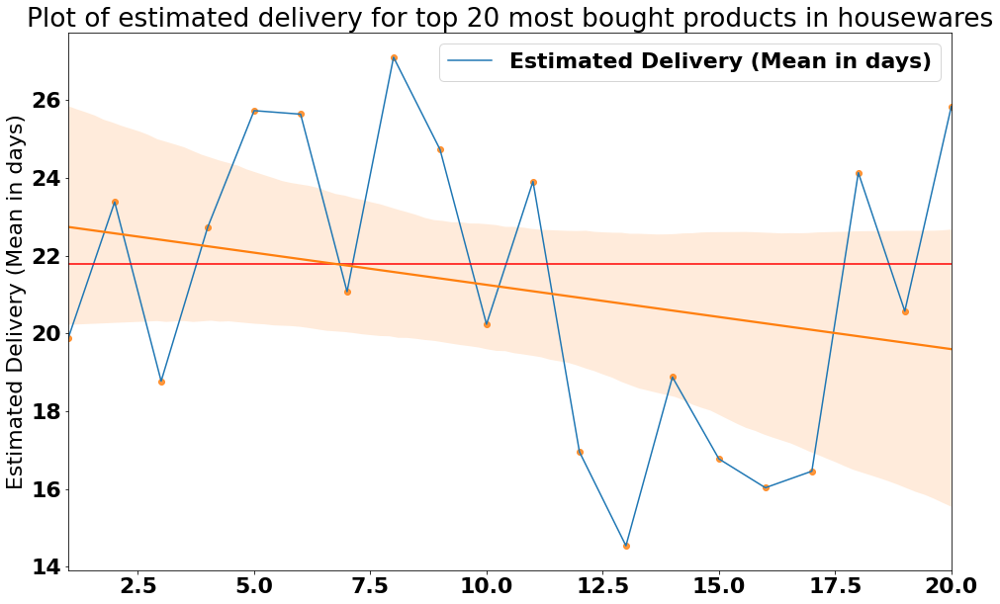

None
Top 20 most popular products in housewares


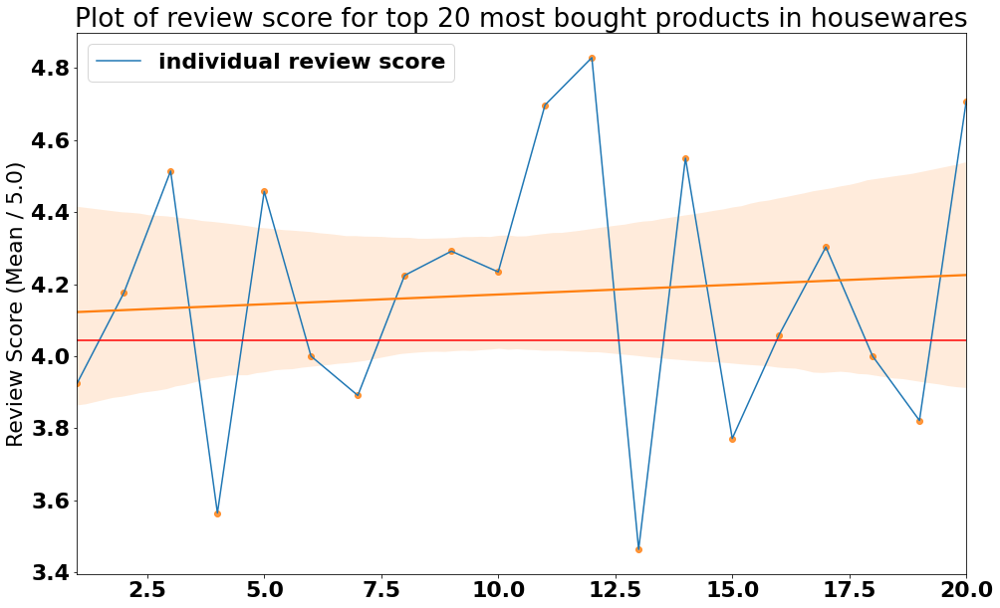

None


Top 20 most popular products in home_construction
                          Product Id  Number of Orders  \
1   a39cc58c1b5926b6f9f378daa89f1315                36   
2   679a3e5e1d2bb68982be5734c6e55e63                31   
3   10070e29929f7c7d609ee3201f236b8e                22   
4   71540d636652fc682032d3b3c0a180c1                21   
5   3cce0d166c3fb2507956c630c1d0f87c                18   
6   f8077831f3c3f393fb67b93c5acd8daf                16   
7   656bf6da1eeb7dd128b9b567eea3ca3e                15   
8   5926c58c462b5d1f932ef3f0a9e37d41                 9   
9   5ef700515181623872771a16d1371cd4                 9   
10  ed464125465d8ab04c3615963d27395c                 9   
11  6f0169f259bb0ff432bfff7d829b9946                 9   
12  fdbfd4cec6db6e89f22d9aa2c4839eed                 9   
13  787049a00ace087394d4183387405ee1                 8   
14  ebf1c13032246ea801765e8cb5417365                 8   
15  ee15827f0aa0a837f8edc88de60b7850                 7   
16  d6dc2dcbb3e

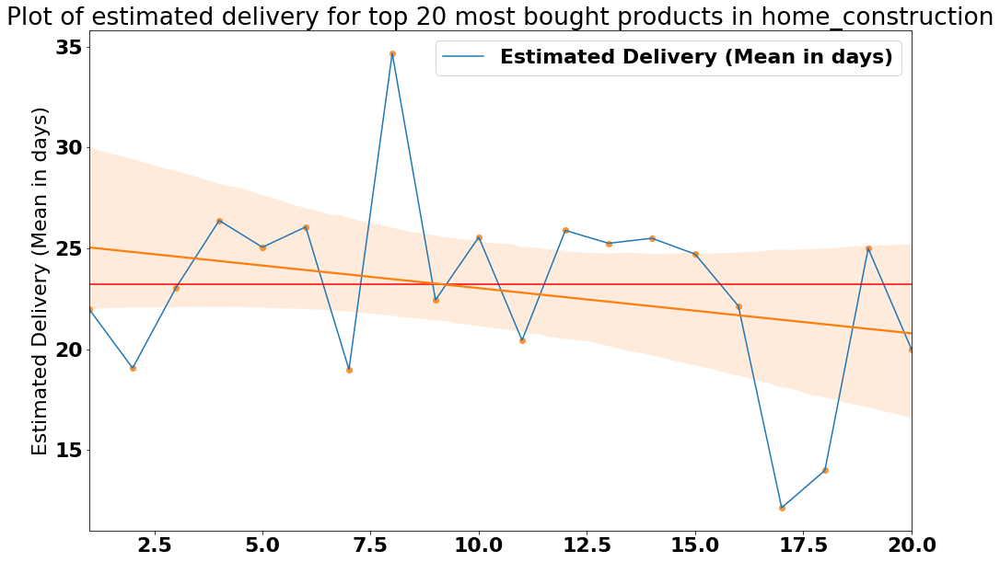

None
Top 20 most popular products in home_construction


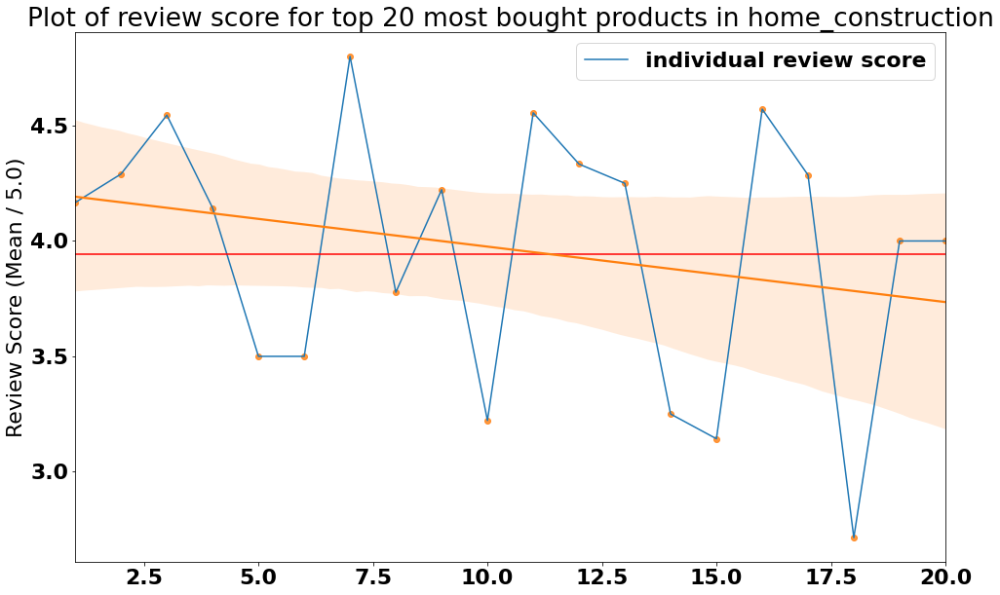

None


Top 20 most popular products in health_beauty
                          Product Id  Number of Orders  \
1   154e7e31ebfa092203795c972e5804a6               295   
2   2b4609f8948be18874494203496bc318               275   
3   7c1bd920dbdf22470b68bde975dd3ccf               242   
4   bb50f2e236e5eea0100680137654686c               210   
5   6cdd53843498f92890544667809f1595               159   
6   19c91ef95d509ea33eda93495c4d3481               157   
7   437c05a395e9e47f9762e677a7068ce7               156   
8   3fbc0ef745950c7932d5f2a446189725               151   
9   e0cf79767c5b016251fe139915c59a26               140   
10  4c2394abfbac7ff59ec7a420918562fa               126   
11  7fb04722aba7a2b632bac8f9819796f3                95   
12  8c292ca193d326152e335d77176746f0                92   
13  634256dbcd184b3757ffd7632c9fe52a                72   
14  2948658cb6abc82847412be7201bfc4c                71   
15  24c66f106f642621e524291a895c9032                68   
16  d63c1011f49d98b

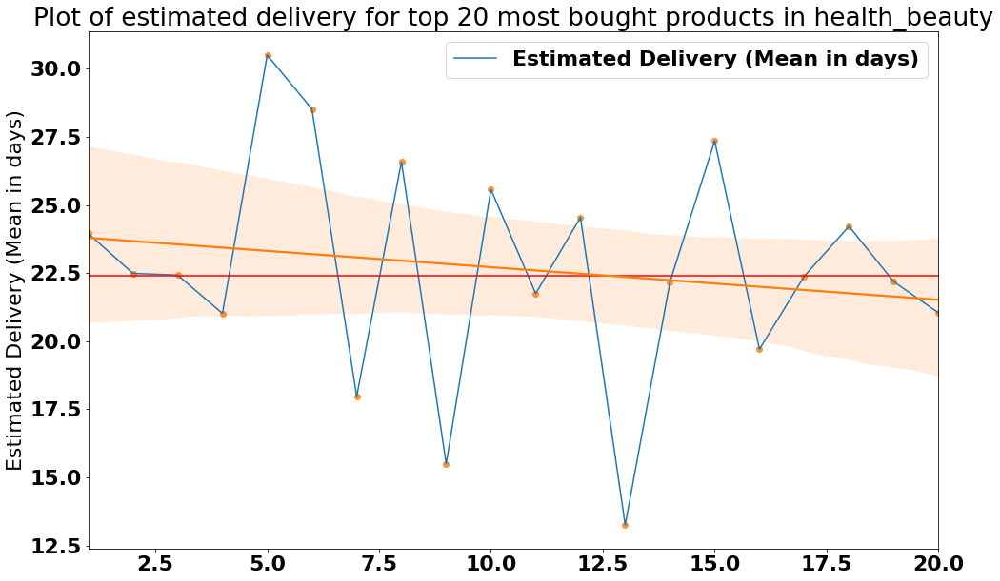

None
Top 20 most popular products in health_beauty


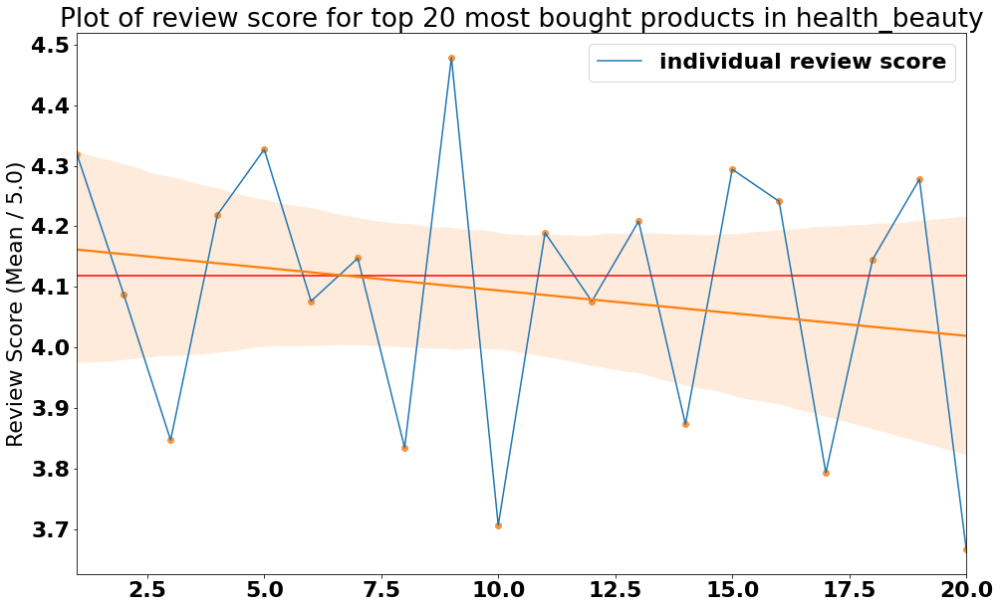

None


Top 20 most popular products in tablets_printing_image
                         Product Id  Number of Orders  \
1  6bbe55cf8f85c87b6eebb775a53402f4                35   
2  34dabb8af33b3756cf72df05fb327011                20   
3  2eb9b2ef7c1da3c7b99702452ea4729f                18   
4  ab0a97f604550b5b5b99180a6dc04461                 4   
5  301b4cdcb73666033d7c96fcb1fc758d                 3   
6  3c46d3f68a377931cdadfd72c6158643                 3   
7  96dbad46bf454d233b0d2adf108294a1                 2   
8  fa9d34c32a70b4e50a4c2c8c2c42051f                 1   
9  b29c1749f99da888ea322a01420d5220                 1   

   Estimated Delivery (Mean in days)  Review Score (Mean / 5.0)  
1                          22.742857                   4.114286  
2                          21.850000                   4.150000  
3                          27.944444                   4.222222  
4                          36.250000                   3.750000  
5                          31.666667 

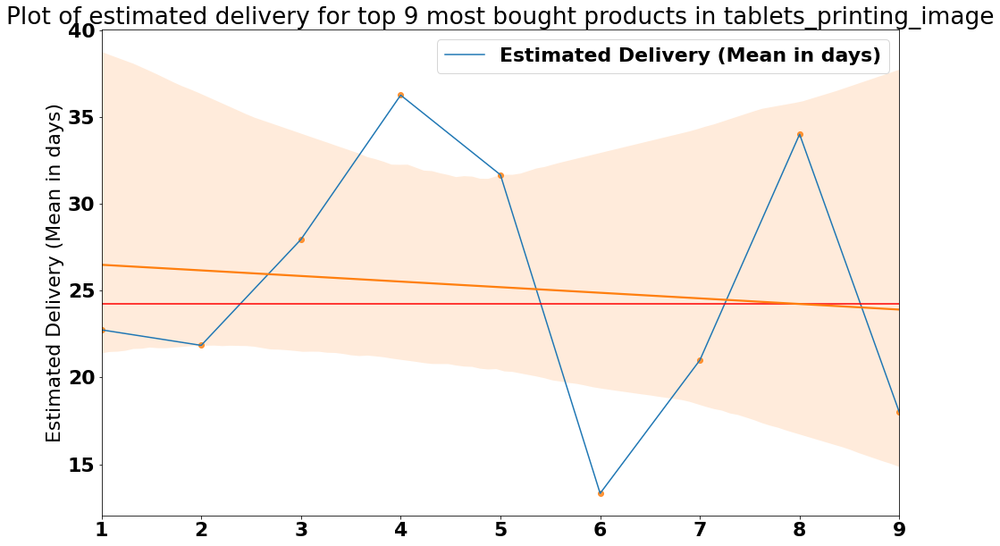

None
Top 20 most popular products in tablets_printing_image


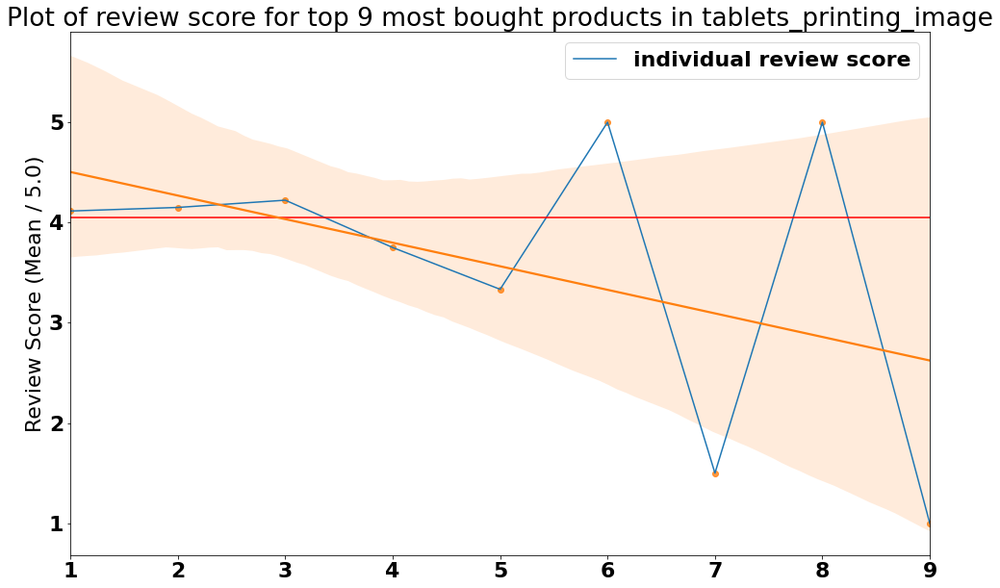

None


Top 20 most popular products in auto
                          Product Id  Number of Orders  \
1   4fcb3d9a5f4871e8362dfedbdb02b064                92   
2   a50acd33ba7a8da8e9db65094fa990a4                87   
3   629e019a6f298a83aeecc7877964f935                75   
4   1613b819ab5dae53aead2dbb4ebdb378                68   
5   f4f67ccaece962d013a4e1d7dc3a61f7                56   
6   4520766ec412348b8d4caa5e8a18c464                55   
7   3cb39171fd36c50097f2dedbbe0dfe6e                43   
8   98d61056e0568ba048e5d78038790e77                40   
9   dfb97c88e066dc22165f31648efe1312                36   
10  1dec4c88c685d5a07bf01dcb0f8bf9f8                35   
11  c73628b1c3144b2e0c9c88072f21a213                31   
12  55782cb82e0efe052da0a3da237da3b2                30   
13  4cac1a12a6fe9ffba4a9556dbe582e28                29   
14  d3e1006ba3735c0d44160026b6e0ced3                29   
15  060cb19345d90064d1015407193c233d                27   
16  33ba4b29d820b397054cc97e

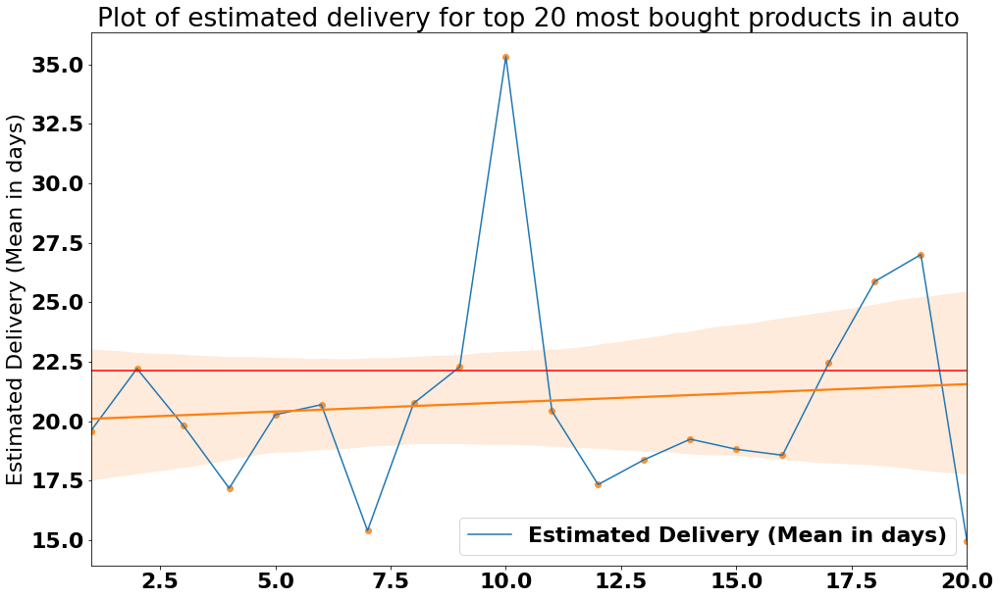

None
Top 20 most popular products in auto


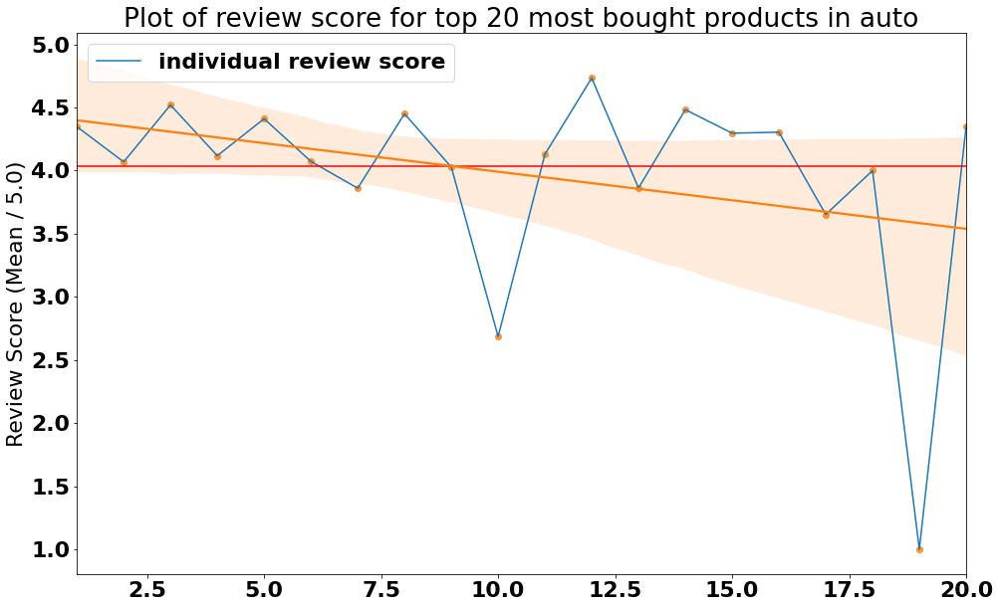

None


Top 20 most popular products in cine_photo
                          Product Id  Number of Orders  \
1   c3798d484fb730f0b5c23af0d5361595                12   
2   e988092a8afe5d9393a5c3a7ca17691c                12   
3   1f5f0f003ce8595ad88fb215ec1409e6                10   
4   88a1223b29fac4c3abef8d1369dbbaea                 7   
5   d55487f6b9833914549348cc2839f9e9                 4   
6   e0fddcd9bdfbff9df8a8228f6a6346d7                 3   
7   c5f91783ab6cb187c7182b8e4b8c9047                 3   
8   071b5dd29feece041c356d172474b113                 2   
9   060f71666a632ac169814c0f1d715571                 2   
10  77d33bd0b4fcc822df9ee16dd7c13a13                 1   
11  099e24c2e32a0cd384859e0ea1a59cfb                 1   
12  1bce8df66884f0841be155ae1f645d46                 1   
13  1cd17c8beea6f950dcdcb8e514d1fdfb                 1   
14  4c2e7dbae8cc699dba97825c02d87b27                 1   
15  e84e2fd4fd9f8789bd8cb6deaca58d30                 1   
16  1a0ef485e35802dd1d

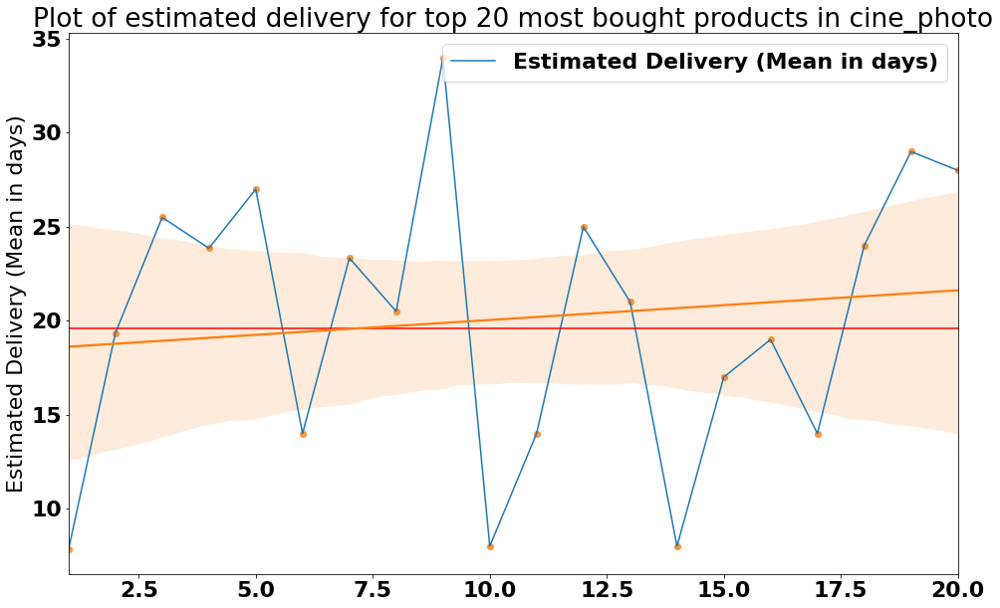

None
Top 20 most popular products in cine_photo


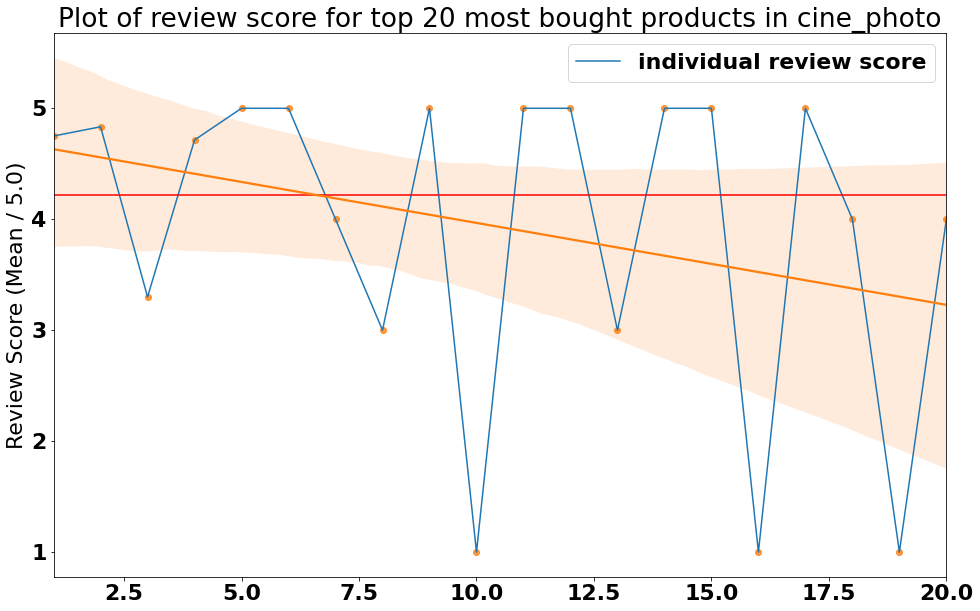

None


Top 20 most popular products in pet_shop
                          Product Id  Number of Orders  \
1   e1da6ab77f4859eb17950e5df1c0f815                43   
2   a4aa7c1427c31344e5f7cc3d839fe562                43   
3   ca5c923962558430573f83661dbe36d6                41   
4   e94df75b2e9a8b056be0c144a731f55c                33   
5   6adab229374835b551f6402e0dc53267                32   
6   ba80c9f47a84d1e08465f72e22930c83                28   
7   7ac0d3f8ac5b60c13d74b02b8cbb4623                23   
8   0c71252f37443403376d2008034a7240                22   
9   4c1e109ecdf58453de365d217cefa64c                22   
10  a5ae8400fc9fcacd4af585a57bbf264a                21   
11  fcf6ad274391aea29f5d6e5ef9da5050                21   
12  5ccdfc35d9cff8db4fa46b83d5712899                19   
13  e070a61270050c4b1b704300f331cca6                16   
14  9bb2d066e4b33b624cbdfec7d50b3dcb                15   
15  efcef300fe9b2c558a8ea258127f6e6f                14   
16  d3060c543b1b88a647cc

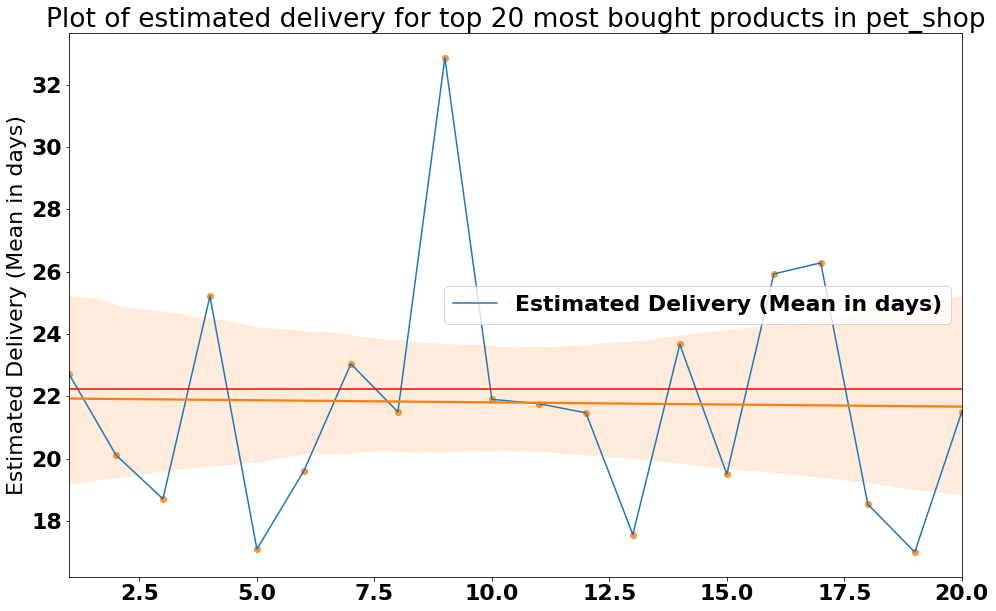

None
Top 20 most popular products in pet_shop


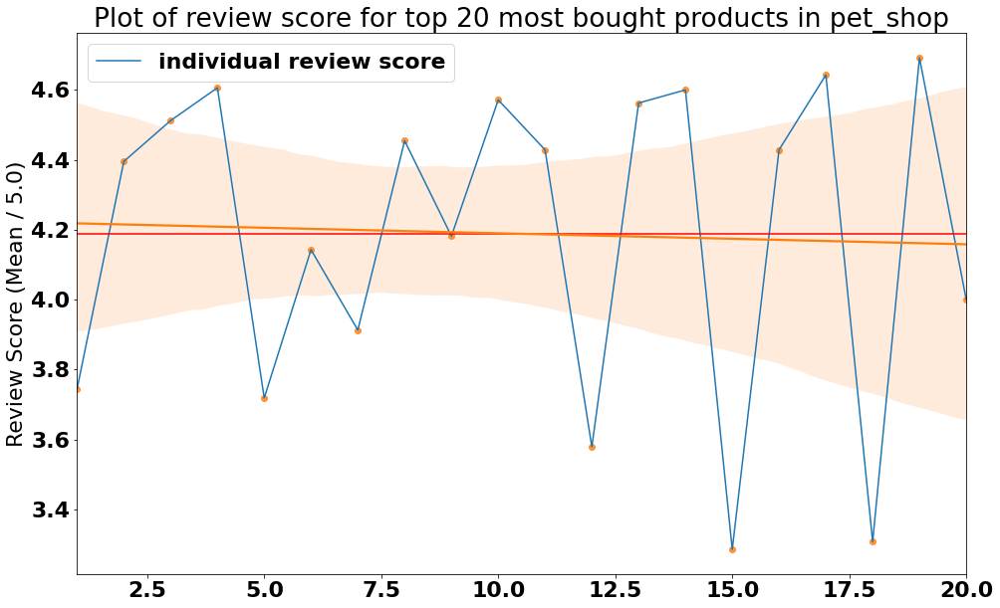

None


Top 20 most popular products in garden_tools
                          Product Id  Number of Orders  \
1   422879e10f46682990de24d770e7f83d               508   
2   389d119b48cf3043d311335e499d9c6b               406   
3   368c6c730842d78016ad823897a372db               398   
4   53759a2ecddad2bb87a079a1f1519f73               391   
5   c4baedd846ed09b85f78a781b522f126               163   
6   8c591ab0ca519558779df02023177f44               144   
7   b0961721fd839e9982420e807758a2a6               129   
8   0bcc3eeca39e1064258aa1e932269894               128   
9   52c80cedd4e90108bf4fa6a206ef6b03               125   
10  08574b074924071f4e201e151b152b4e               115   
11  7e0dc102074f8285580c9777f79c90cf                73   
12  f1fe595ee7ef768b41bd9b246d13432d                49   
13  d2085f7e0f9533605386960fc7e987ec                48   
14  e251ebd2858be1aa7d9b2087a6992580                48   
15  a8075470f960215ffb67624782f80fec                35   
16  98a8c2fa16d7239c

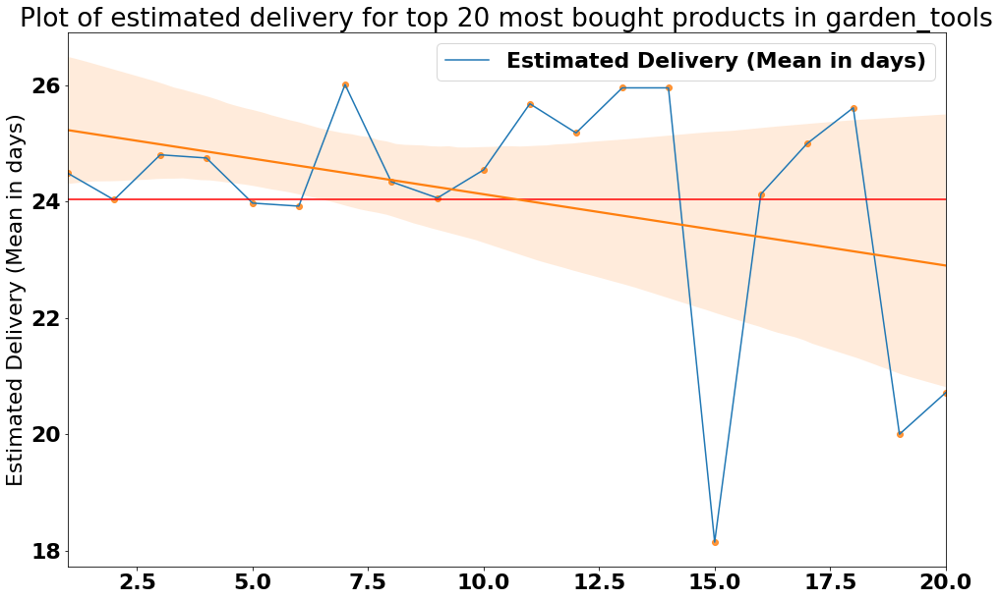

None
Top 20 most popular products in garden_tools


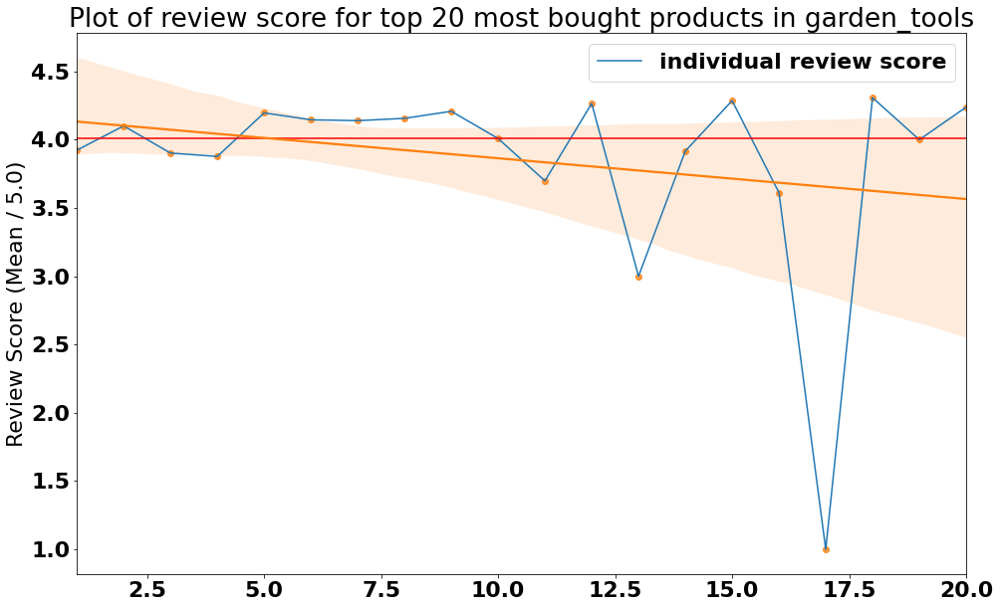

None


Top 20 most popular products in perfumery
                          Product Id  Number of Orders  \
1   2028bf1b01cafb2d2b1901fca4083222               153   
2   595fac2a385ac33a80bd5114aec74eb8               106   
3   ee0c1cf2fbeae95205b4aa506f1469f0               103   
4   75d6b6963340c6063f7f4cfcccfe6a30               101   
5   617186c3d97ea56c9c683a8a3974e8c1                98   
6   473795a355d29305c3ea6b156833adf5                91   
7   bbaef2eadf31fe3ea6702077398be06c                71   
8   22c5ddc22ea8cae84fc9917def682dc6                59   
9   fbc1488c1a1e72ba175f53ab29a248e8                58   
10  fe01b643060a6446e59f58e3021e66b3                47   
11  027cdd14a677a5834bc67a9789db5021                41   
12  f731f8587d4088c174397e010cf892a9                34   
13  e4d325bd1eea550509bdbbc5c3301fc1                34   
14  0e2d365a247d105fefc31b17ab8706d9                29   
15  75c06ee06b201f9b6301d2b5e72993f8                28   
16  017692475c1c954ff59

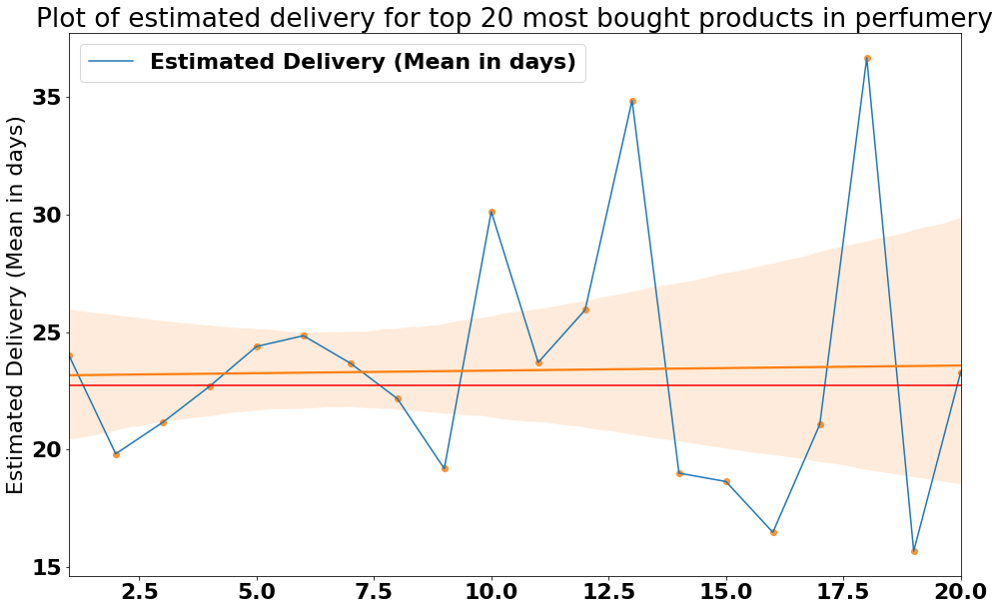

None
Top 20 most popular products in perfumery


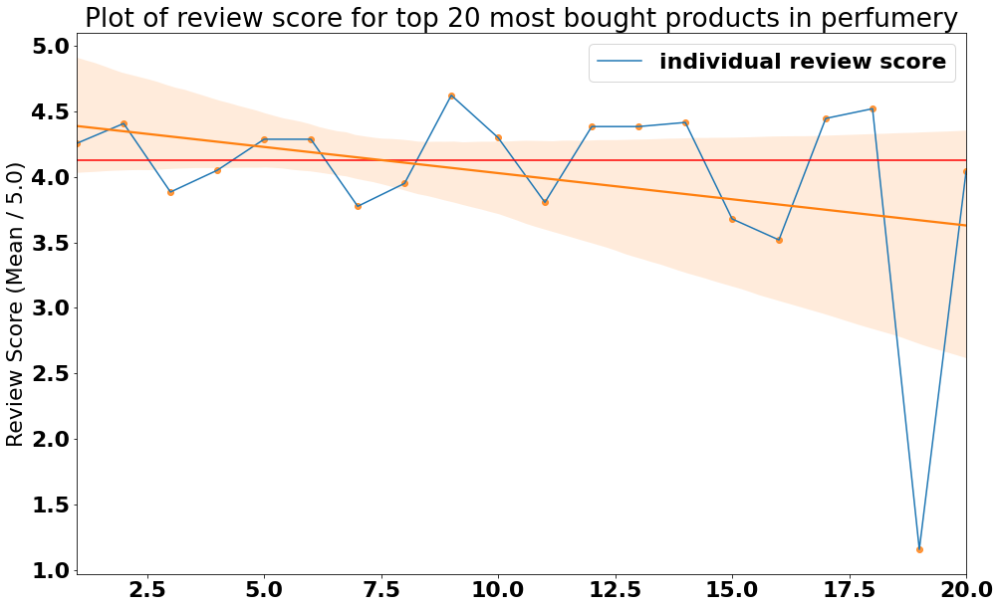

None


Top 20 most popular products in construction_tools_construction
                          Product Id  Number of Orders  \
1   7564c1759c04fc0a38f2aa84f7a370ee                44   
2   779dd392d4fbe5ca656bf3ceabecbf0b                18   
3   0da9ffd92214425d880de3f94e74ce39                17   
4   ed00a8453145186b3f071f1e3edef33d                17   
5   f5badee8a0e679f057ec0ca4f0f32dcb                16   
6   78f29023586e374cdc3773ce0af6bd2c                14   
7   2722b86640ddc24e1374c2df1ac2a230                13   
8   3bad4452b9bf0554748e82f3a4a5673c                13   
9   0dadef6ed70b861b14eddb3a3ca6b73e                10   
10  dbaee28f4ee64465838a229582d77520                 9   
11  b883409932bf862f43008f116a06cda5                 9   
12  596e3ace8e8329beb05bb40700a659f7                 8   
13  4a5c3967bfd3629fe07ef4d0cc8c3818                 8   
14  cd360a9f341f57c25699dbac377f5efd                 8   
15  6bb54c0a1ddf991dc06cc7cb5a13bab7                 8   
1

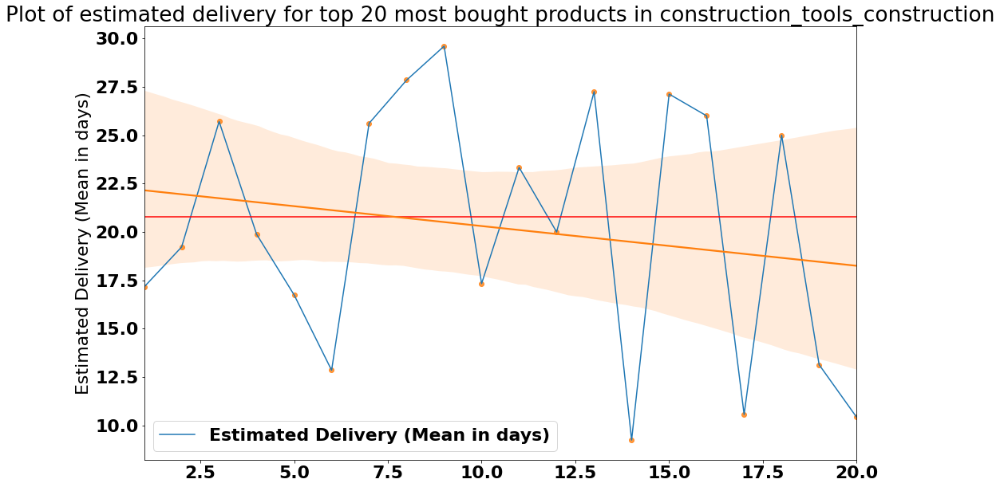

None
Top 20 most popular products in construction_tools_construction


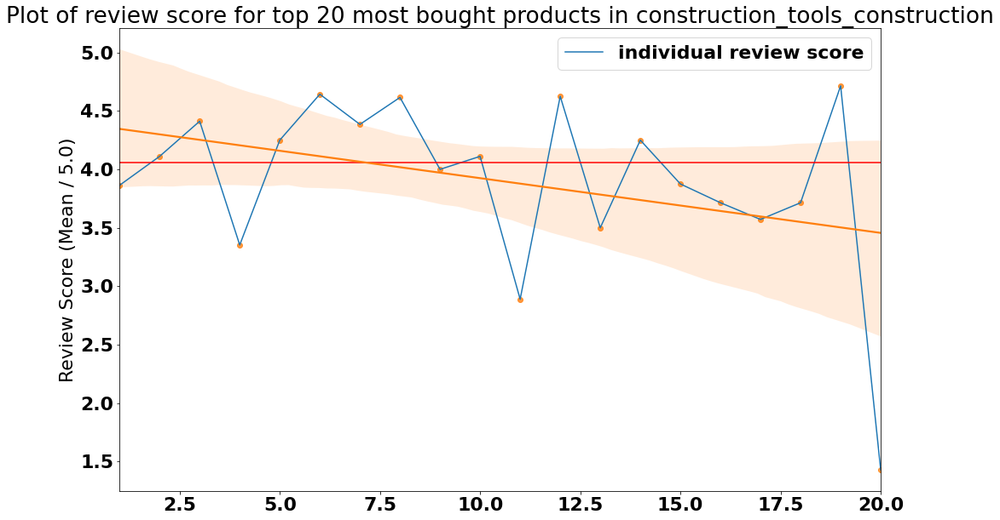

None


Top 20 most popular products in costruction_tools_garden
                          Product Id  Number of Orders  \
1   71a7800a633691de8ecdd17463335e2e                22   
2   42749c525c90994bd3d4c74edf047172                10   
3   84c79830527ae823029ee6b904cf948c                 9   
4   0b01a9718a61dbdd35cfec9ad13a0301                 7   
5   5272c0e8bee8fadf0a2a23b5460da8c6                 6   
6   774ea72f37a7fbf1fb32b973a18f2348                 6   
7   4ce6c1b5cfe26c9f980438fc1c810f8d                 6   
8   9834262f81613c7215955ac3b7081919                 6   
9   39d4a8413d363755330d17445a28a76f                 5   
10  3863a6df816f3b8ce0358a1243541fcb                 5   
11  104b9503ee57d0aa2cd3a6448f242636                 5   
12  fde90f06296b26995fd0de6f16610d70                 5   
13  7eaf66aca1ed54df09b3c864b7416110                 5   
14  07ffc018eaf23e086370dea42c74077b                 5   
15  666696771a5dd7a28816eab47b70d966                 4   
16  c819

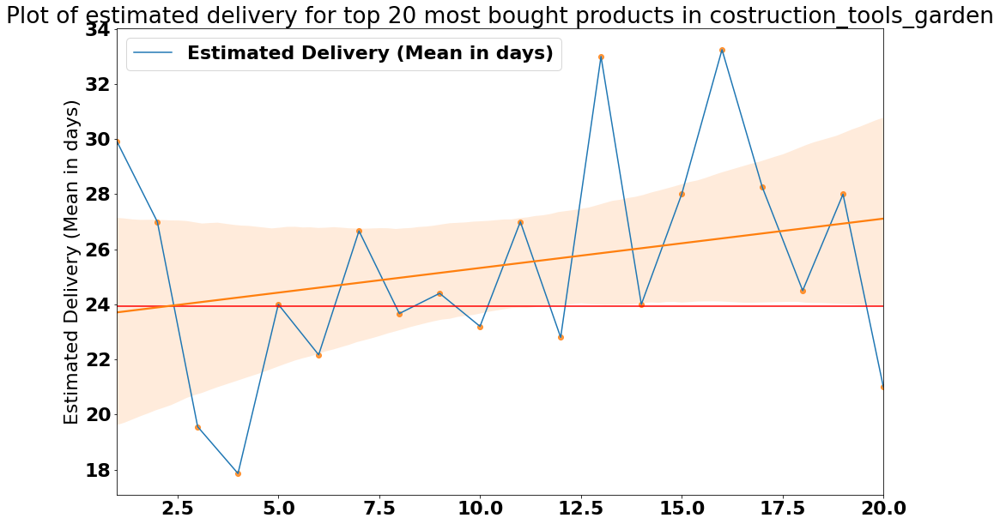

None
Top 20 most popular products in costruction_tools_garden


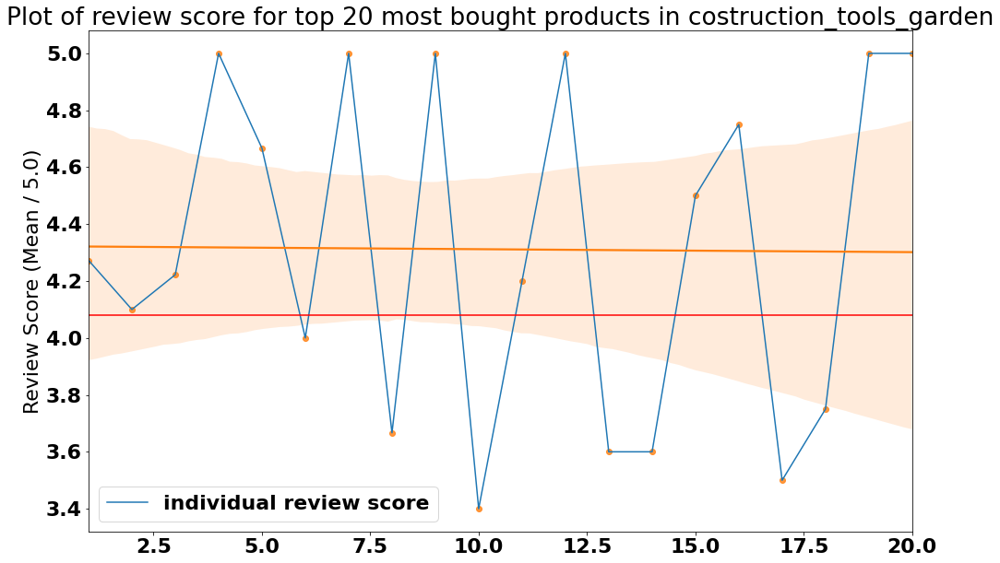

None


Top 20 most popular products in food
                          Product Id  Number of Orders  \
1   89321f94e35fc6d7903d36f74e351d40               120   
2   ed2067a9c1f79553088a3c67b99a9f97                57   
3   73326828aa5efe1ba096223de496f596                56   
4   d493f5a208254fe85b3ab55d898461a1                24   
5   33202a8e7a645388c41ed714203d7131                18   
6   f0c1c1d5ec61ce4c4846abd4283631df                18   
7   ab1106e227a745836a0dc83b374e2575                16   
8   092be1e8336fc404c57bd5970d056886                13   
9   cd59f488cef311feb633141ad1e8563d                12   
10  45a6892a98568b366b52ffeec9a03691                 9   
11  861857117917aaa99611defcc0d514cd                 7   
12  fd0c762860528d119344e1377b574fc5                 7   
13  1900bad8eae4042922f8487abb59e3c5                 7   
14  58816ce2ec224ea03aff8abe045f8407                 7   
15  24f5af2b789d02450459312d48fc840f                 6   
16  3d0552899dbe2f89cff6197a

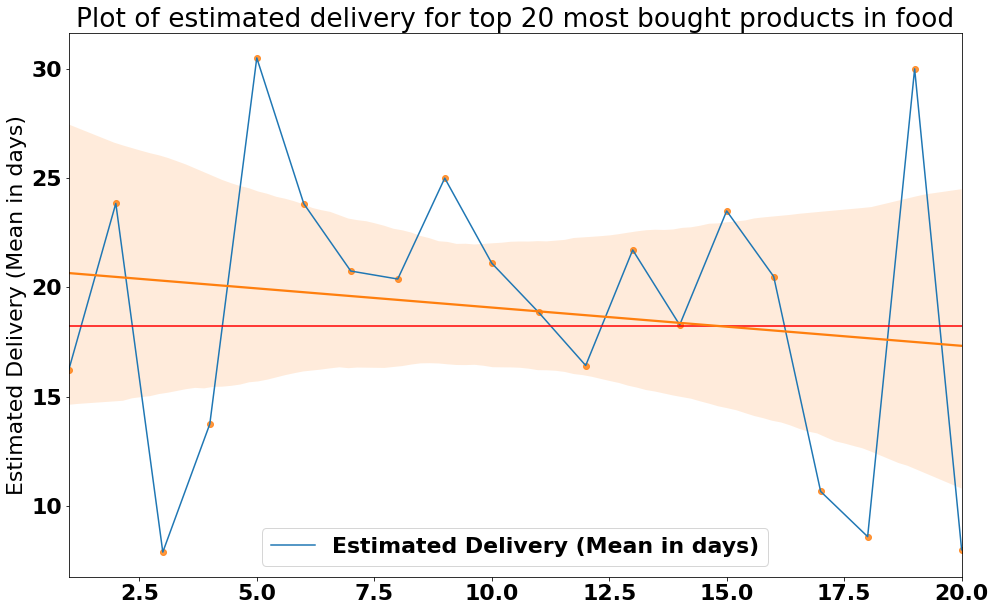

None
Top 20 most popular products in food


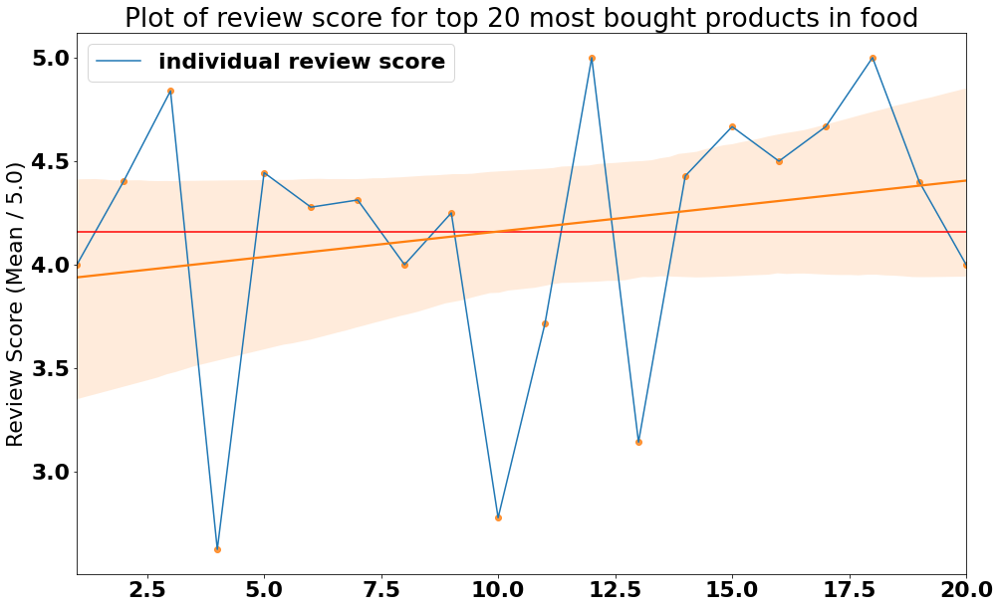

None


Top 20 most popular products in books_technical
                          Product Id  Number of Orders  \
1   173e9fe34bfe97f3a5e6dc57fe897b74                43   
2   edd087ed331c3ce178ec3489b9ecf117                 8   
3   6d68112743e7ed2de3932554b033f544                 7   
4   d7a023eecac412d29d49735e9e9b629f                 7   
5   08bcc2d85da3a9c0e2ac1cc28b67418d                 7   
6   3bd016185be10ea4b4b2baa6e7dd9e9b                 7   
7   cdd914e78124a73cc28a165cfc4a0bbc                 6   
8   44feb28a74abb0f2f303412d60160750                 6   
9   652683d85a89f3b134e44989a601bc58                 5   
10  ffedbd68fa6f44e788ff6c2db8094715                 5   
11  4e3f399366b0047a572b6682f9bb166e                 5   
12  4535b0e1091c278dfd193e5a1d63b39f                 4   
13  ce87eb0f80420c505b53adef21bf93d6                 4   
14  b44ac72ece514e2e7985803cf7cefbc5                 4   
15  d8f1b415091ab79b62ac80443d865ca6                 4   
16  4f823b57fbf2a

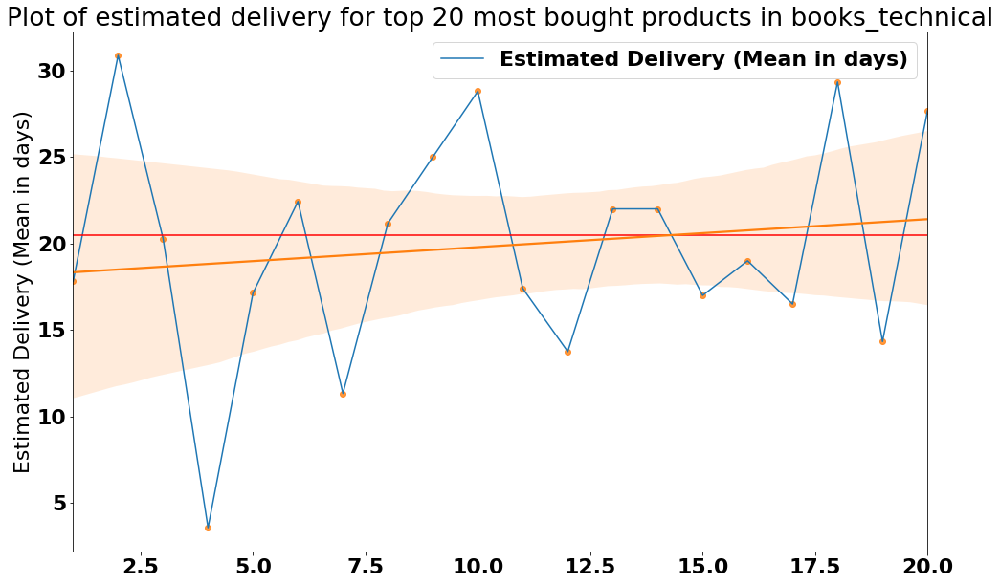

None
Top 20 most popular products in books_technical


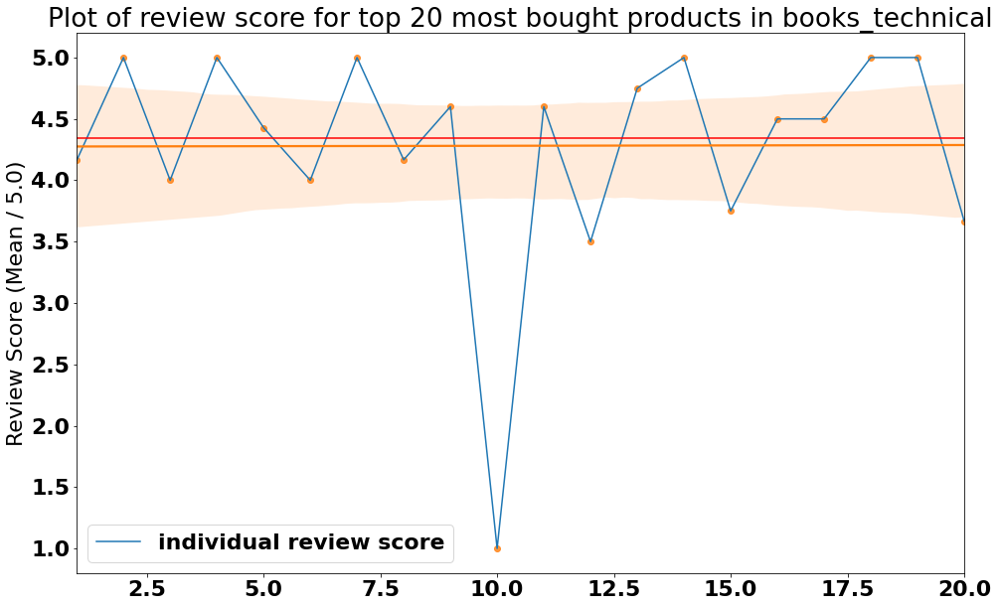

None


Top 20 most popular products in stationery
                          Product Id  Number of Orders  \
1   fb55982be901439613a95940feefd9ee                85   
2   5411e9269501a870cabf632f05655131                77   
3   177d3d5bb9d4d29222a222e3b3554f41                55   
4   e03102efbc2229024c89be731f0aedcb                53   
5   65266b2da20d04dbe00c5c2d3bb7859e                40   
6   94475071013412139f862c0bd7e3bb37                36   
7   06f0e85c7892d5df893f332706340af1                30   
8   d189fbf8b5d79a670cebcaaad68d77b2                27   
9   28a652ff04e43c1bc57937a9f8770f9b                24   
10  e84997d75938765ef99930f908ceedf4                24   
11  c706d50b57c9e83293c2586d01f32445                24   
12  9007d9a8a0d332c61d9dd611fa341f4b                23   
13  6bd248f93425ceeb625a8a97e2404112                23   
14  5c2bb11cf2149bd4d9fffcc1246458c3                22   
15  1a0971a6f39f04118207a7308d451e9d                20   
16  7935ddc510afb7d089

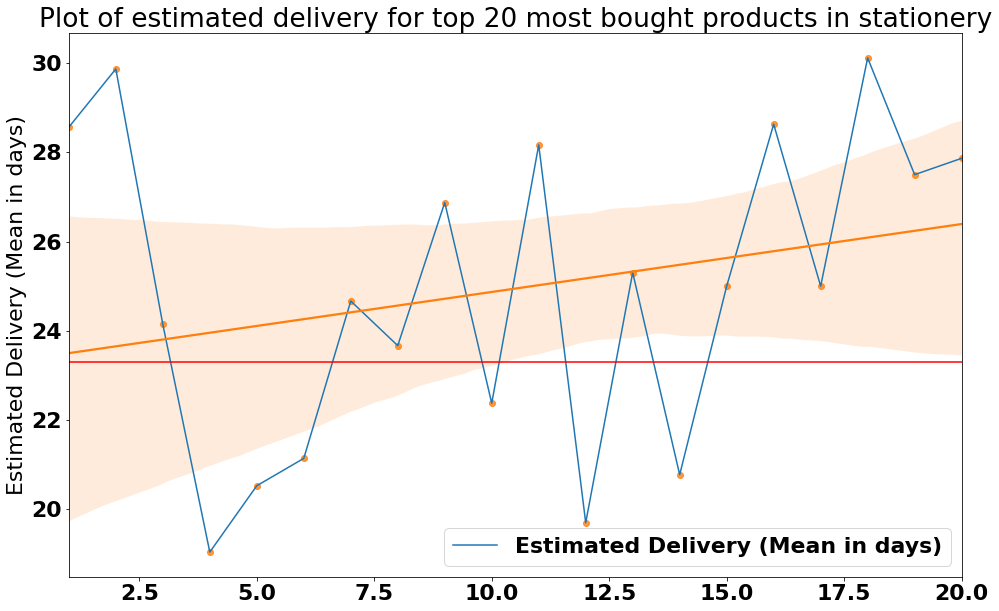

None
Top 20 most popular products in stationery


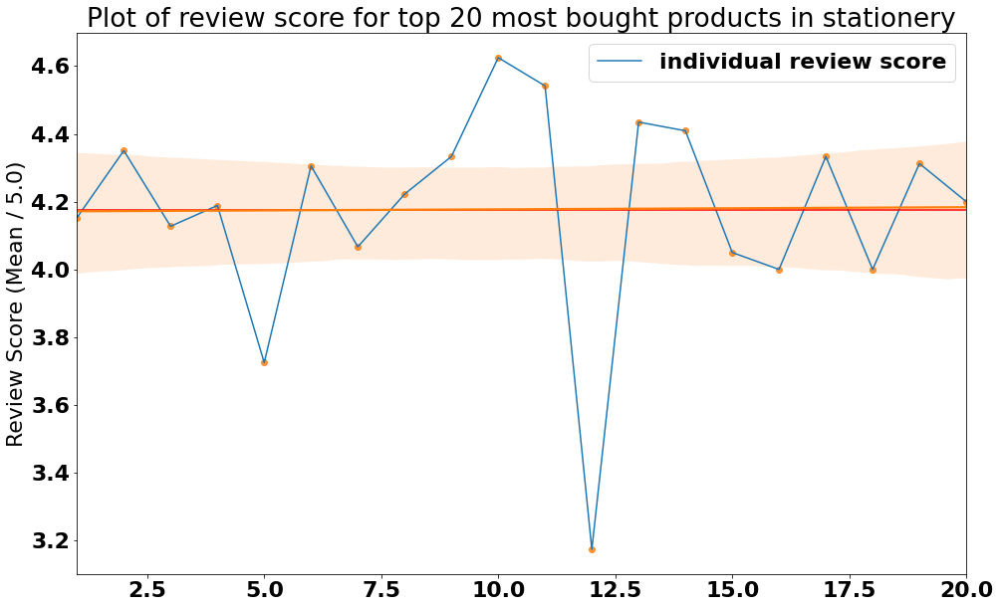

None


Top 20 most popular products in furniture_bedroom
                          Product Id  Number of Orders  \
1   4f18ca9862f511ecba98258b2194d061                23   
2   0e2d52789a024cfd6f9204778320a8e5                11   
3   0b814a3c8fa6dbb849df7c28c1bd6831                 8   
4   0296dd002a346e3bbdda4e0bc48a5073                 8   
5   aff39c649de8c4e36d325880de8f4338                 7   
6   428f4b96ba9f630e761b333673039ae6                 6   
7   2edc5e6012ad882462d116ed5a9e3085                 5   
8   d373a9b9079c251371e94cacf40c1fe7                 5   
9   d8c365a069853295a82caf595c2c8c8d                 4   
10  1b0fb6d6a05121d4b76a49f44c2c427b                 3   
11  8daf2f80c6d552efdb1012683beb10cf                 2   
12  91b07eeacd06edb343a31d2d9a5c2954                 2   
13  98001b51c21b1efa6530623ecb0c20fe                 2   
14  c388dd6e3dccf434053adacfc3b5108d                 2   
15  0504d5c0f9b71510b2b0bee952e380fa                 2   
16  36b50a27073

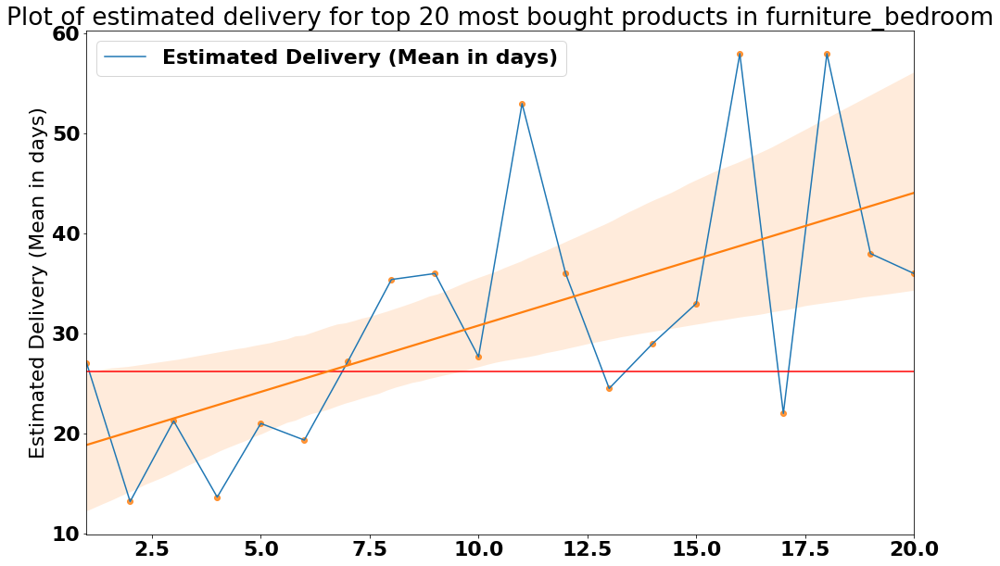

None
Top 20 most popular products in furniture_bedroom


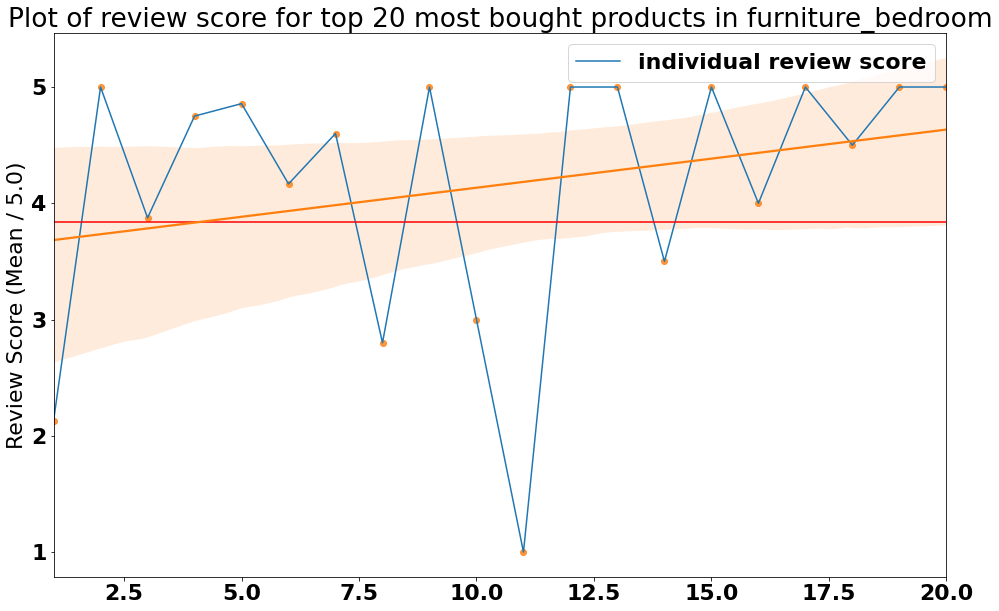

None


Top 20 most popular products in art
                          Product Id  Number of Orders  \
1   4fe644d766c7566dbc46fb851363cb3b               109   
2   986700c98805af229ab7ad51b95fa356                 7   
3   538948f39142c635d3132846c820e211                 7   
4   bf359473d58e90d8fc29bf8f3d282ea9                 7   
5   48633254f8b7b802b1ca8c4f4dcf3e33                 6   
6   4c6aedb2bfbcb47f59db757dfc22c607                 5   
7   d62ed986672bfab13938e62e6badec55                 5   
8   d3d10495159bcc41173e3d26a273529a                 5   
9   cbf96c04205dc933b89e025748c2a057                 5   
10  f20135d2d37130bbd6a2a9fa2e501e8f                 4   
11  d727c091d4ce7f59b5e690ce0b58b1ea                 4   
12  986c47683f9e701e110a0cc525dfac87                 3   
13  3262a0950995f2a891ec1fdfe6f5a133                 3   
14  4673c83bbad0277b120ac3251d4b3633                 3   
15  749d3e9ac43e769ce6245a97630f6543                 2   
16  50a64d6b01398039142e3e0be

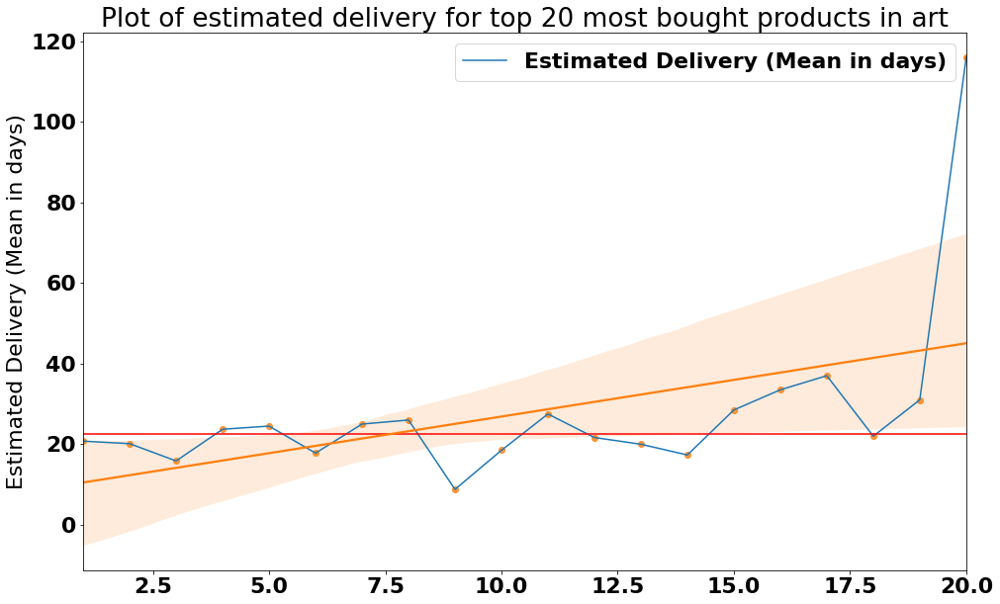

None
Top 20 most popular products in art


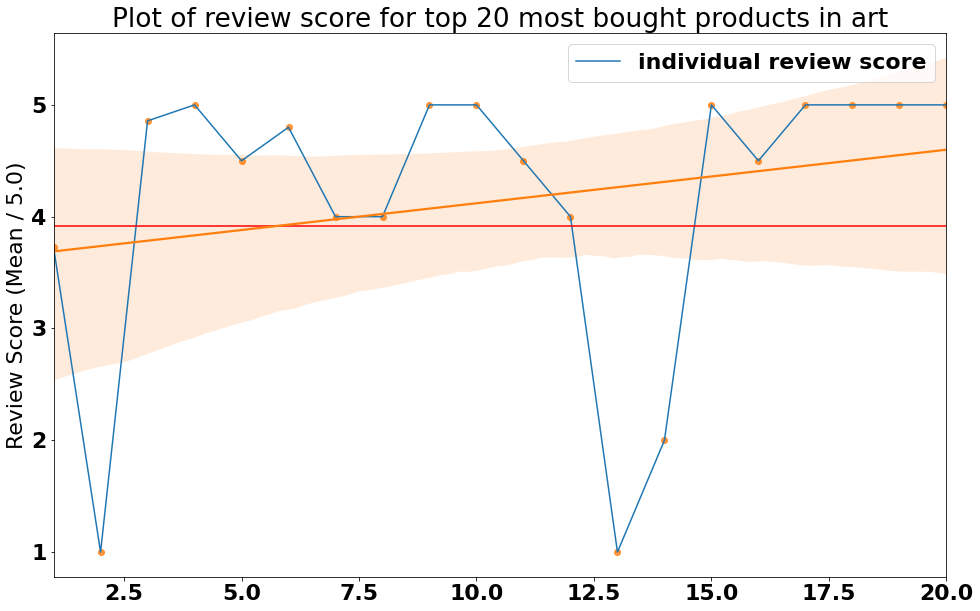

None


Top 20 most popular products in musical_instruments
                          Product Id  Number of Orders  \
1   738da8ddda2e593acfdc53c2d1520dfa                23   
2   44e086c4a977f37a888627b43880586c                19   
3   a5bbc554f75cf4afa2cd56791015ec27                18   
4   9048cbd294fe0c1a3ec8c8248bc2cadd                17   
5   b5ebab9fa4b5f2771ec47a5d6139f3ff                15   
6   16c4e87b98a9370a9cbc3a4658a3f45b                13   
7   7bdb28a55646012fb3348058d629d9bc                13   
8   17a019676883dce326999c11a46a14f0                13   
9   9163c7e81fd68452472912c4cde810aa                12   
10  4f1a7a45b6d43fa7e4958e013923d9e5                12   
11  b7a89537c40b1f5a18b5ba75dbb91cbe                10   
12  778f8850980a158eafa6e7555c085ea1                 9   
13  69d3ff4f45d52d69e4b06760e0e154e2                 9   
14  ce169d5f9421a6f21e41a7bf54d0b98e                 8   
15  05a9ab81472f6bdcd910cb49b636c5b5                 8   
16  860ad475c

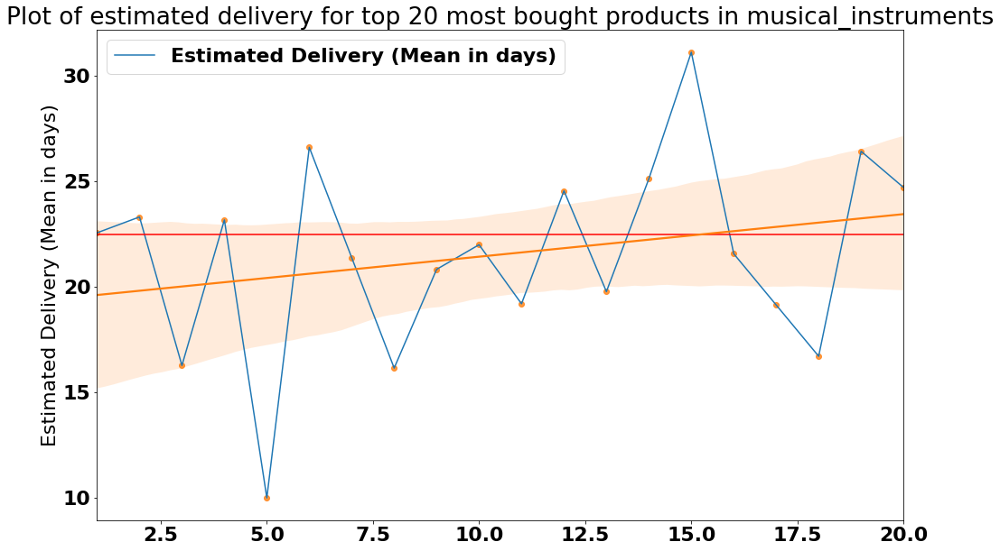

None
Top 20 most popular products in musical_instruments


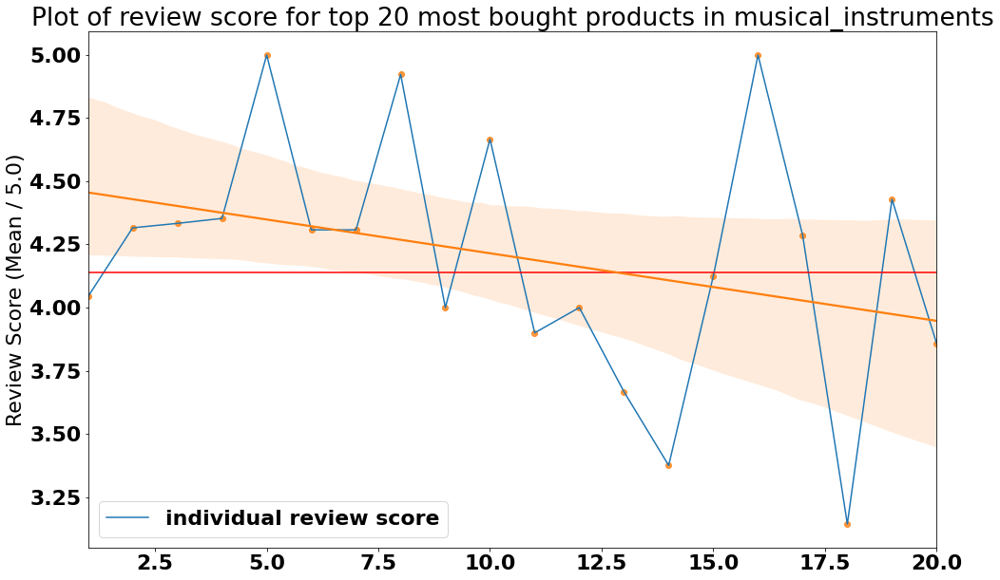

None


Top 20 most popular products in construction_tools_lights
                          Product Id  Number of Orders  \
1   a02d0123079f4ae96001ba2010d1a2df                57   
2   349ce46a0e2e20054aa9d80c48af8816                42   
3   216bb0e0cd43ffd832e0973d35e0377e                40   
4   26b2a480ced2900a62bb9431133e95aa                15   
5   783caabd539c4079ec08423e30719fba                15   
6   21af4f32f6f1cab0bb13d7563dc06e70                 8   
7   4316b712956314302c5d0aef9ed77c13                 8   
8   924c635d837c240da3956f3c28c1e6f4                 7   
9   1fcbdcb14ed564faddf72bbcef855036                 5   
10  d9235fea02ba3f9fafcd78d898ac4355                 5   
11  37f4d0bf85fbf875c920d460766d6a5c                 5   
12  5a75c30c323b0ae56499ef163504648a                 4   
13  197f7d1d3a8b0bf0c8f0394ff71b574b                 4   
14  1302fd16bdfe85e523940c846370ef2c                 4   
15  f0bb82bede57b520480ce892667bb71d                 4   
16  b3f

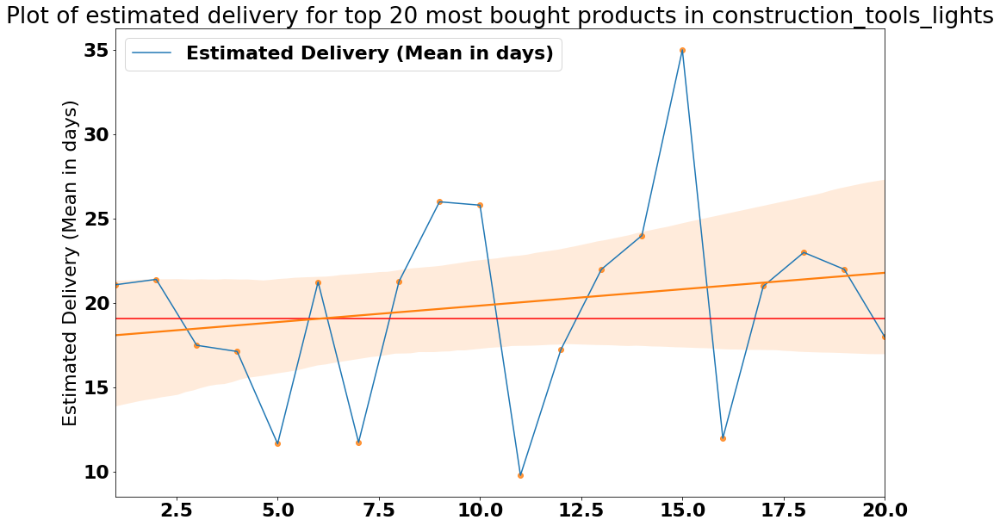

None
Top 20 most popular products in construction_tools_lights


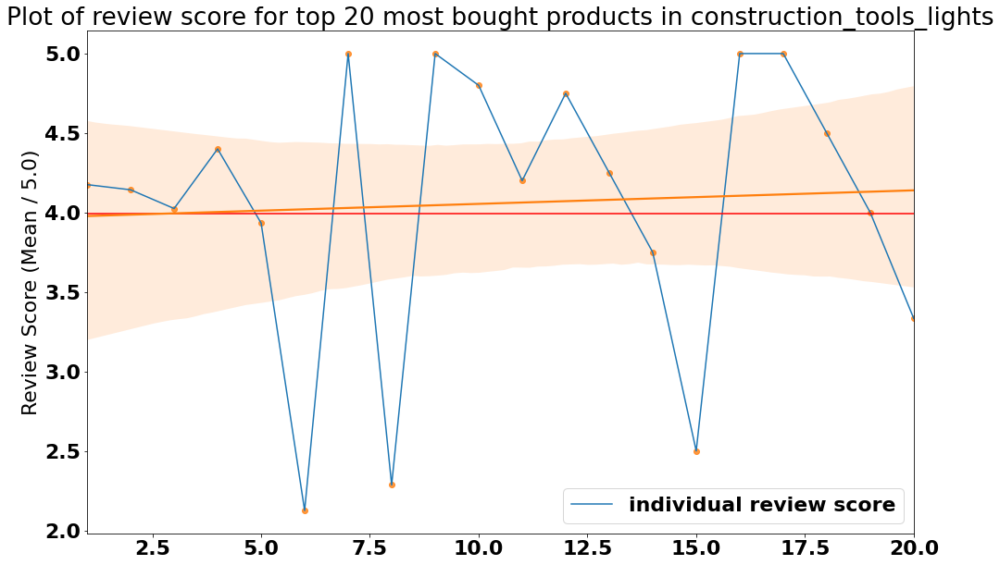

None


Top 20 most popular products in office_furniture
                          Product Id  Number of Orders  \
1   8ed094bfe076c568f6bb10feada3f75d                73   
2   a9516a079e37a9c9c36b9b78b10169e8                61   
3   aba86c093ccdbac75b09111d57e50004                60   
4   3eef0cb94ba82de806bb30ab743c7655                59   
5   2a5806f10d0f00e5ad032dd2e3c8806e                57   
6   b114bf337c0626166abe574eee9e3f32                54   
7   1bfb290d7273a442c874dbe74b4abae6                46   
8   0554911df28fda9fd668ce5ba5949695                38   
9   2b7aa376a6e728560bddb5558cc48e89                34   
10  b92a7304ebad1ca5b393b53b2de5c70a                32   
11  d6fe3b4ddecd4a8393c6a1385de3bfb6                31   
12  914c9e9af640dd56f48764a225b00f89                30   
13  e8316a4667e5870c85e906b1f062bde1                30   
14  68a058d125ba1544e726898f0b8c0523                28   
15  a5647c44af977b148e0a3a4751a09e2e                25   
16  6dde44b41729

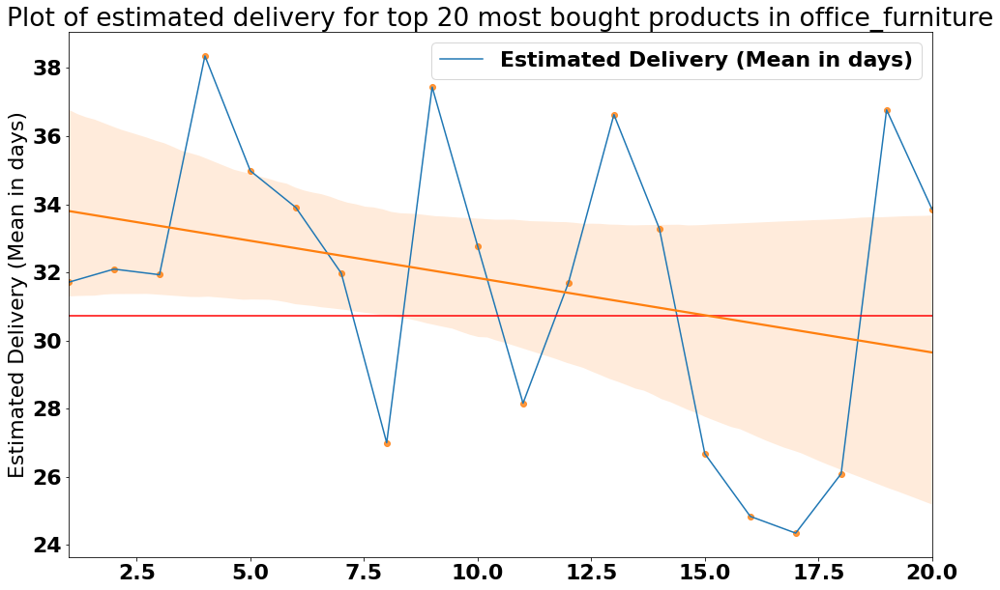

None
Top 20 most popular products in office_furniture


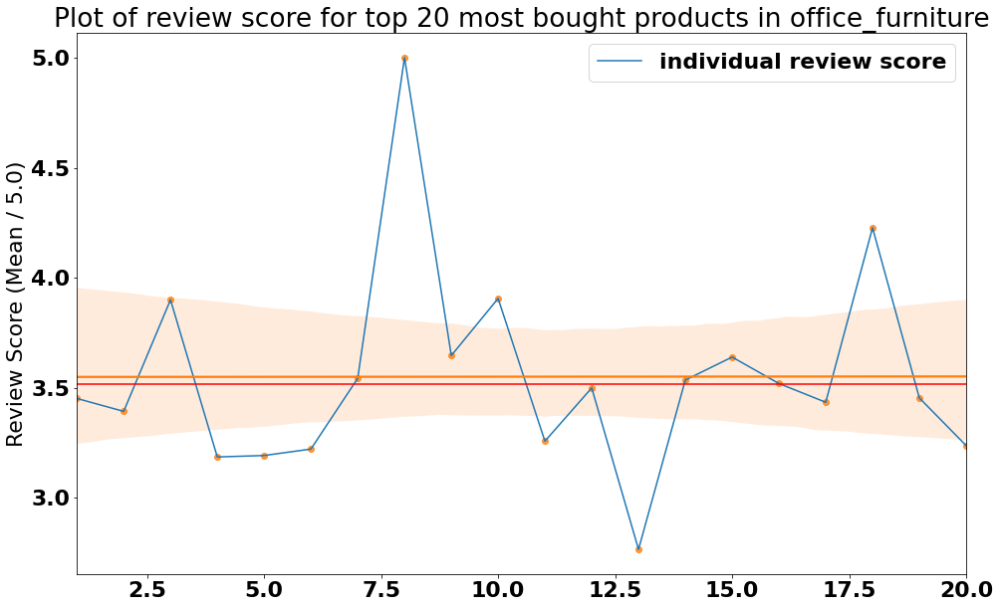

None


Top 20 most popular products in kitchen_dining_laundry_garden_furniture
                          Product Id  Number of Orders  \
1   c075b8e131353552218860f1c421e4ef                29   
2   261244fc4d0197d8772346872f5b0f5e                22   
3   18f6ea7e8cff29f8053baac6762449f9                21   
4   79c0ace2ccf0da036e787875a49151a4                17   
5   48cce5e4d2191b274474ac6327a3df2d                14   
6   bf5d132b4d30a18970b8ee7798725af1                11   
7   3347f12bccb00487d0d9aec54dc1037d                10   
8   a75b732b129c2fe3d8e371dd8333cd00                 7   
9   9fef57f37ae72292952e73ff9a7a3fee                 7   
10  dc3ecc737589882b0318d38cf8b3efaf                 5   
11  c3002d67c0b8c6449c3a80c1556ad8c5                 5   
12  6609d9a71a607da16750629d52615b9e                 5   
13  d75fe2da6eb275eafad5535fff7a2005                 4   
14  183b0c895605218dbd34cdcfcfa8af28                 4   
15  c11485ba18bc927ccd486e58eaea6ef0               

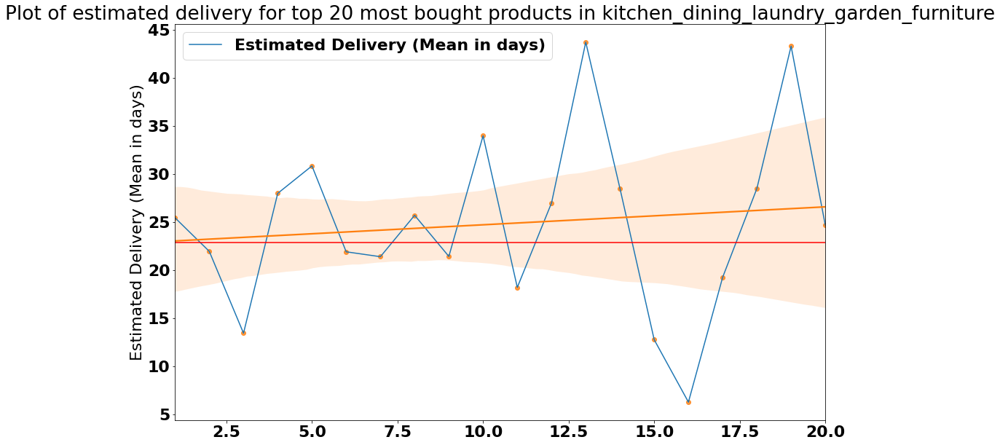

None
Top 20 most popular products in kitchen_dining_laundry_garden_furniture


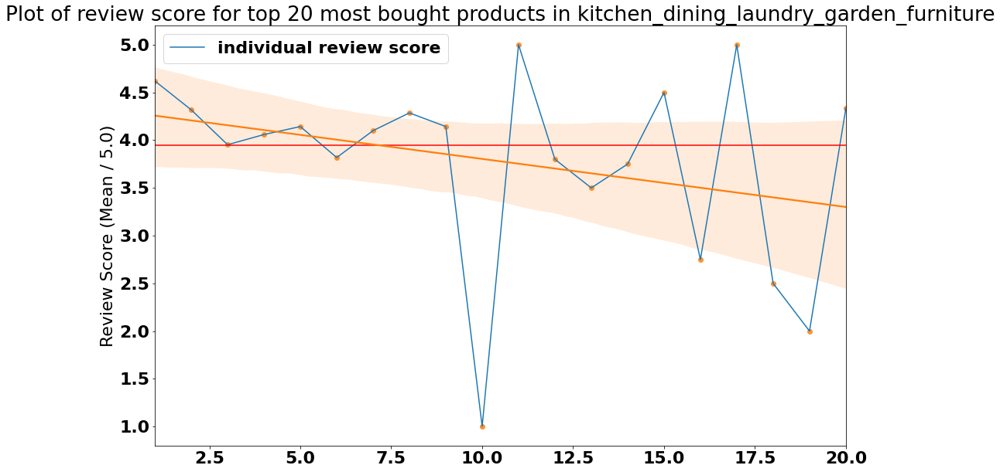

None


Top 20 most popular products in furniture_living_room
                          Product Id  Number of Orders  \
1   2ff995aead9c63a1f37a07b3664ead37                42   
2   c94d19d021d4a8fbae5a45f904aeea90                30   
3   58efb9b638561ce132216a9a612513e2                25   
4   1b8ee158f59c098470fad33f39660964                23   
5   196616257eff8bc851dc4fc041cbbbe9                15   
6   e27c4dd075a521097a085bced0631ce7                12   
7   e85cdca8790ea0026ddf7316f469608a                11   
8   21d2fdced5c69bfc6539b67908a4ad28                10   
9   d363e421b1d15376b299089946fed127                10   
10  591c08a1d9290193bd96d8c9e6e607ac                10   
11  caf9add3dcd98d688be0064d9faf65b1                 9   
12  76914818a87f9b6b320e136e17e6ae06                 9   
13  1c55a8be0613dd888ed9c039cea3d660                 9   
14  8466762a9393a2b2b1de73f3cf6081a3                 8   
15  feb4ade62e32b8d74c6f69f635057964                 8   
16  0db04bf

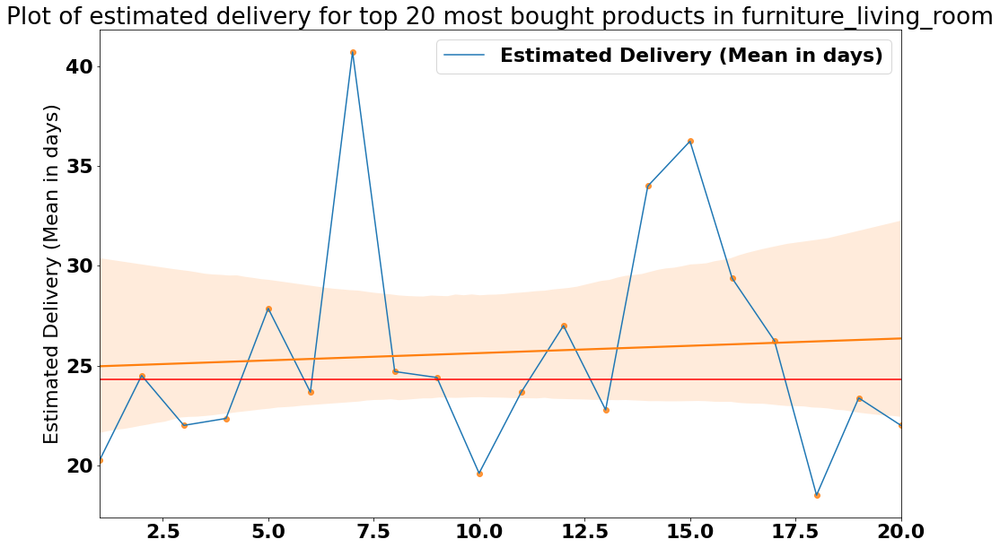

None
Top 20 most popular products in furniture_living_room


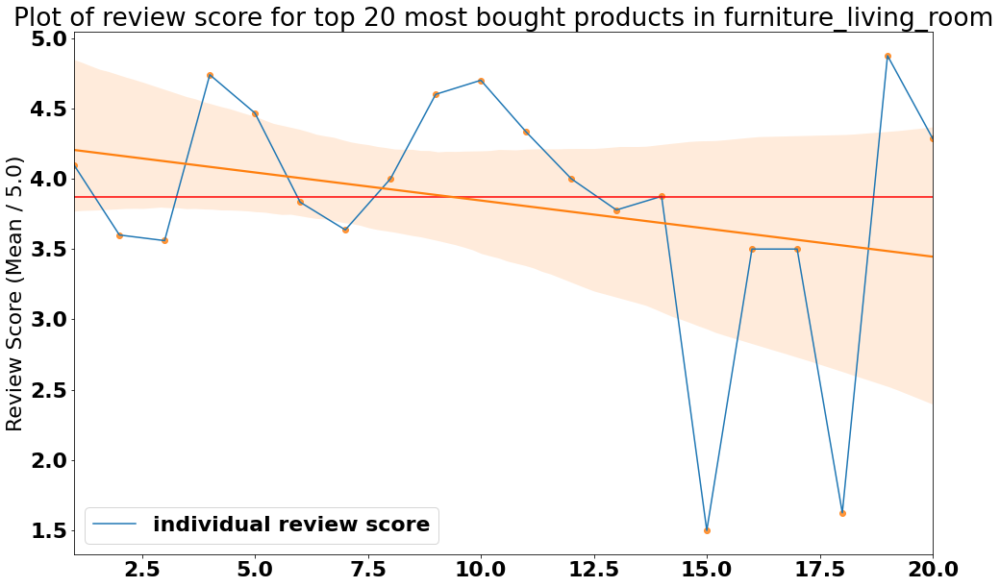

None


Top 20 most popular products in home_confort
                          Product Id  Number of Orders  \
1   35afc973633aaeb6b877ff57b2793310               189   
2   ca0019454bd5ddca0f4022fe89f6557a                14   
3   c6bf8cc852eee5c4ab264e792a9c23a1                10   
4   91497eff4735d835057824111f9532b7                 9   
5   186052b3f166a0f7227e78b2d27652d3                 9   
6   e2fcaac49de7a3a90f0dc74d7b1e9f10                 9   
7   12fd8665371236b5b586ea4e448902c8                 7   
8   3a7553224e54d216c4a65c85f2d04deb                 6   
9   758eb93d6519618b22b2721413074847                 6   
10  7c65bcd66be0ad761948bfeda4e7bd2f                 6   
11  f4cd1164757f2f82e7f949e9ba129664                 5   
12  908dd61b840a480fa931ef04389c6266                 5   
13  b3d1d218a4ff07119f546a42c6ee7d7b                 5   
14  c80124276571cd4bef53cf35d9b36c5c                 5   
15  9477e72598d2f21dc53f809bd42cf7a2                 5   
16  0ecaf0629e5e2274

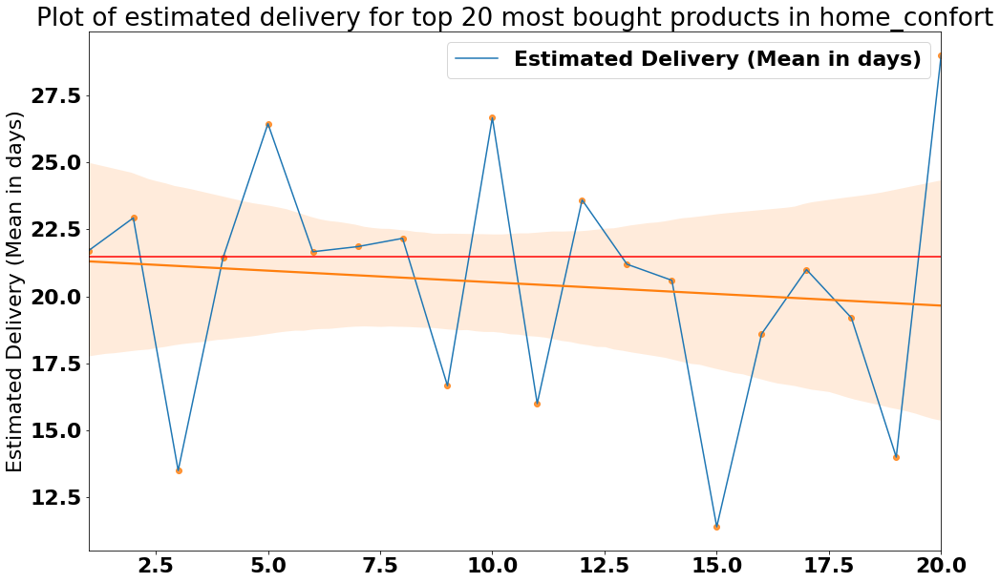

None
Top 20 most popular products in home_confort


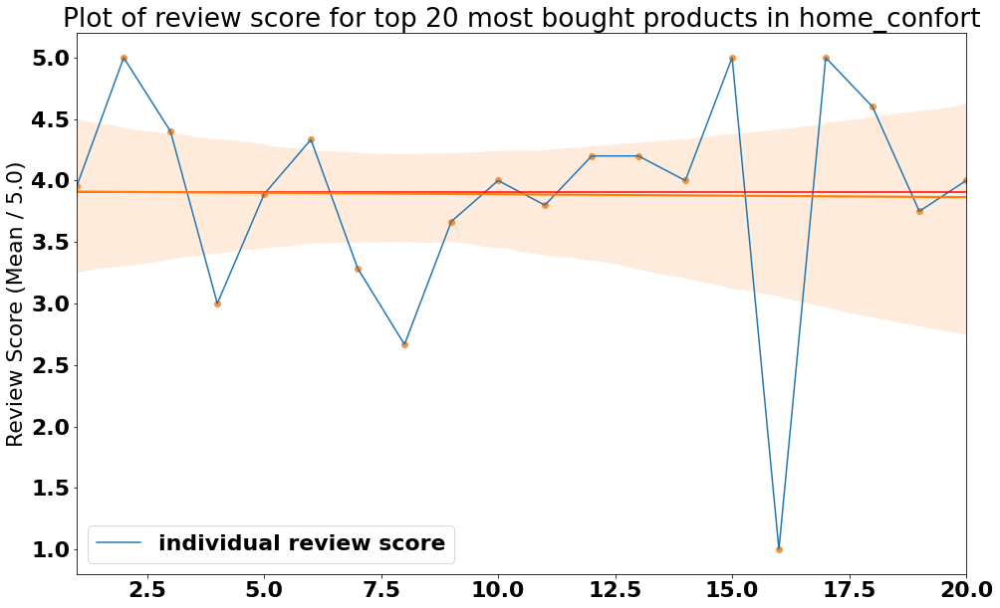

None


Top 20 most popular products in industry_commerce_and_business
                          Product Id  Number of Orders  \
1   d04bbac48960ecb7ea311b00ca6e1cb7                41   
2   593236d0ff46b4299b4787fb8d43f7f0                37   
3   4cafc445fc7535c3b41b8978c0ce68dc                15   
4   62177bb58dda374cc02e6cd2616996a1                12   
5   8e7a3ee016b12c87b5e3e7e717620758                11   
6   88e84a987b4681434dedc0bc9e00826b                11   
7   8246b1e9198f46fc3c05900f43568ba6                 8   
8   632fe3d92c45b5c83f4102fadd94ee92                 8   
9   173255396ec907ab516d3848dbcc98da                 7   
10  f42229541a6335f3ed5268439ea9f414                 7   
11  48401d4a555fd20aa93a202a4ed3b598                 6   
12  9c3225fb1d3bb4943cf7be6afa4b4246                 6   
13  cc02ea01817f1cb21e6708bc19f1ee20                 6   
14  9b4d597238711e4dfc04d98bb2e5ed17                 6   
15  9805b37a2e4983fb5dbb5c8168590c44                 5   
16

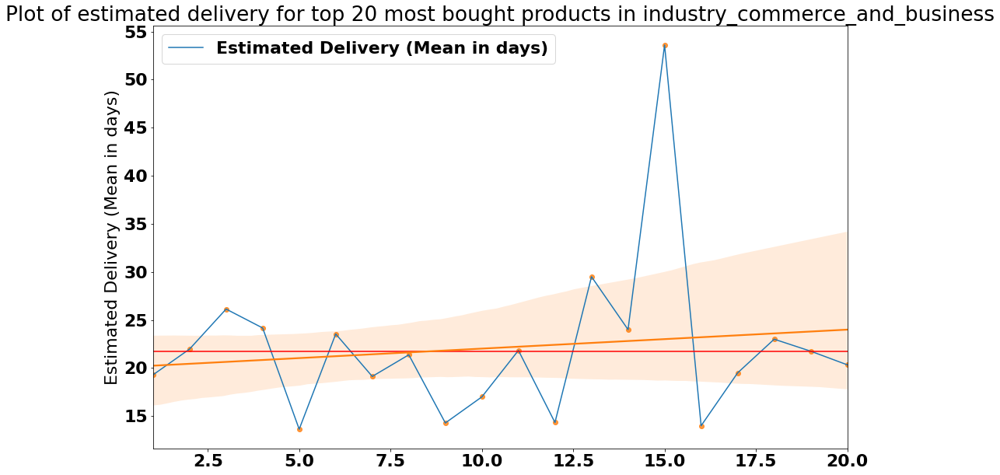

None
Top 20 most popular products in industry_commerce_and_business


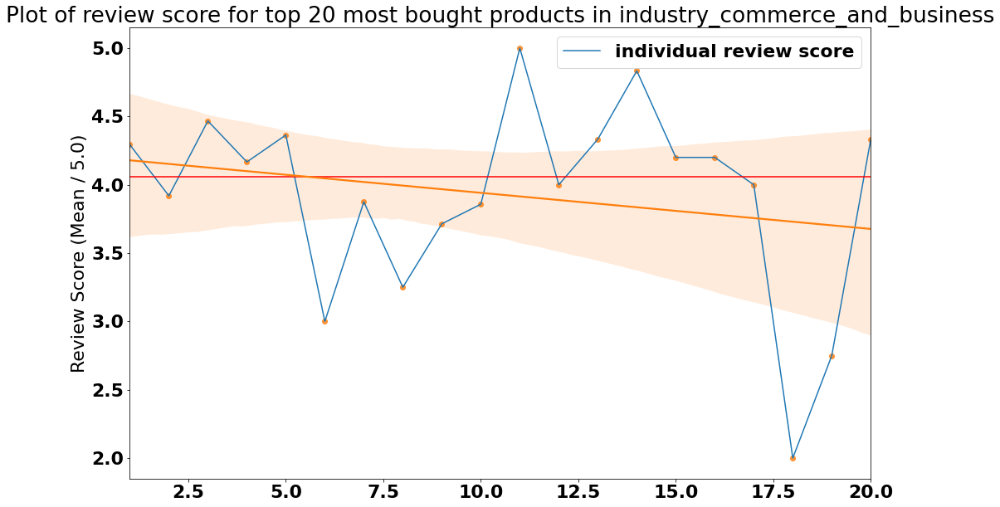

None


Top 20 most popular products in computers
                          Product Id  Number of Orders  \
1   d6160fb7873f184099d9bc95e30376af                41   
2   a04087ab6a96ffa041f8a2701a72b616                27   
3   588531f8ec37e7d5ff5b7b22ea0488f8                23   
4   a5215a7a9f46c4185b12f38e9ddf2abc                19   
5   bc4cd4da98dd128c39bf0b8c2674032f                18   
6   1f411e9a31196b71ed8438c8254b858e                12   
7   caaa713799b547352795c831a14f1c3c                 8   
8   1e5428c428e0f783acd6e3d94ba4ee2a                 8   
9   4e11734666acc305a4649de43f0bd181                 8   
10  fb8c11da2e1b1634e879d1c3c6762dc2                 8   
11  6e263657e75994ff623356f9cff692db                 5   
12  7c8e2b381bb0fcba5b368961d7823cd2                 5   
13  9aedf557945e816d48539ee56293f860                 5   
14  b008888e5e01a5c9da36306228e900d1                 5   
15  194e74feac1f84a8ee5a517d4b3e107a                 5   
16  e004a3b7f9524967fdb

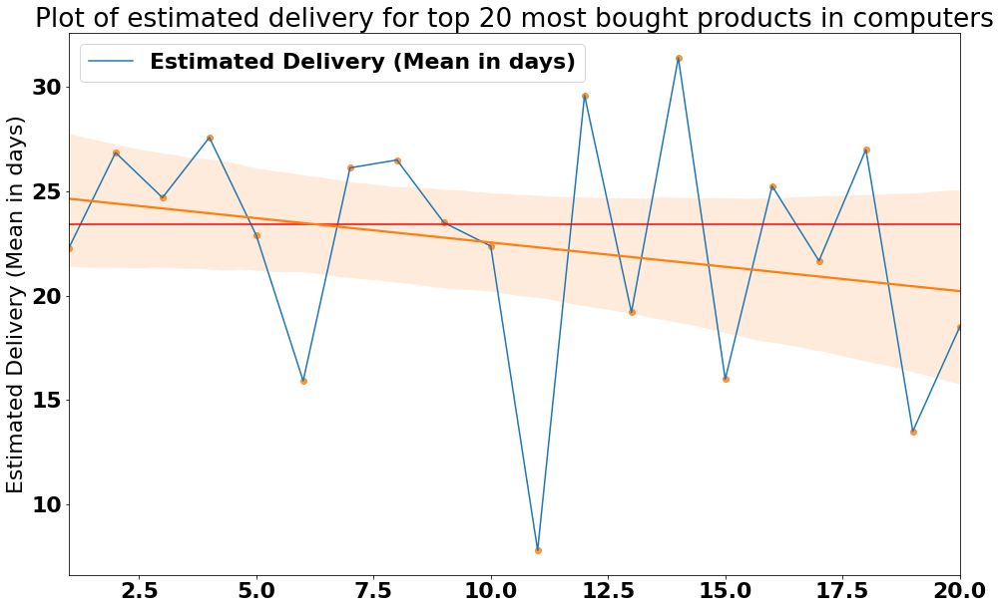

None
Top 20 most popular products in computers


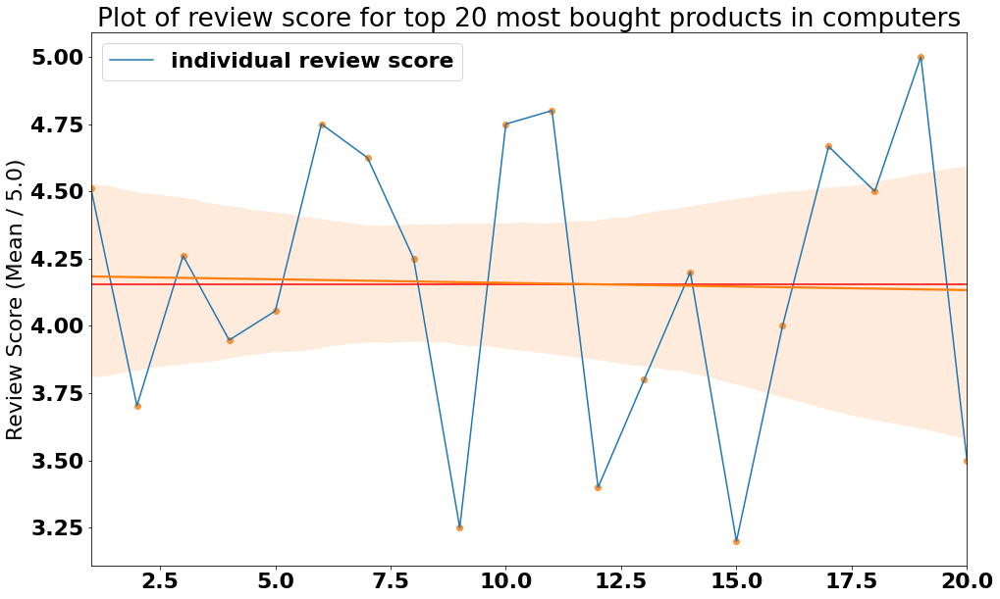

None


Top 20 most popular products in electronics
                          Product Id  Number of Orders  \
1   7ce94ab189134e2d3c05f496d635419c               107   
2   93c902b021a9e594f658ab1b0351602a                73   
3   ab1f9387c0627dd24000bfbc54fdeee0                70   
4   bdc3291ab242ec1effc8eb0987850268                69   
5   5d66715cc928aadd0074f61332698593                68   
6   6a8631b72a2f8729b91514db87e771c0                62   
7   566a4f2c4385f36d15c00dfcaae132d1                45   
8   35ebf08a93899d44e756809e11b14754                45   
9   dd0dcee76f9c12fff4bc0eb641d57c7f                43   
10  82e4ad16521ca131d95e198d507db370                42   
11  50fd2b788dc166edd20512370dac54df                41   
12  6803077179d24889430188e03fafd31a                41   
13  474bb6b54fc608ca71059a6c4f7ecda3                38   
14  87a71ae93900ab55fcf685c8040769b3                37   
15  44fded21627553d1886d459384bbce06                34   
16  a5f6ba3fe91a2e73f

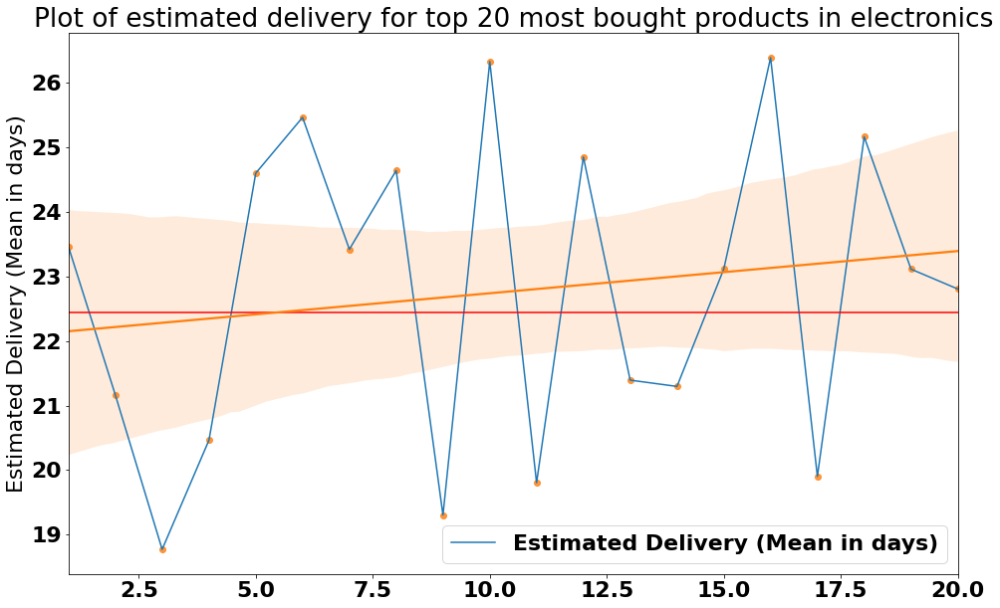

None
Top 20 most popular products in electronics


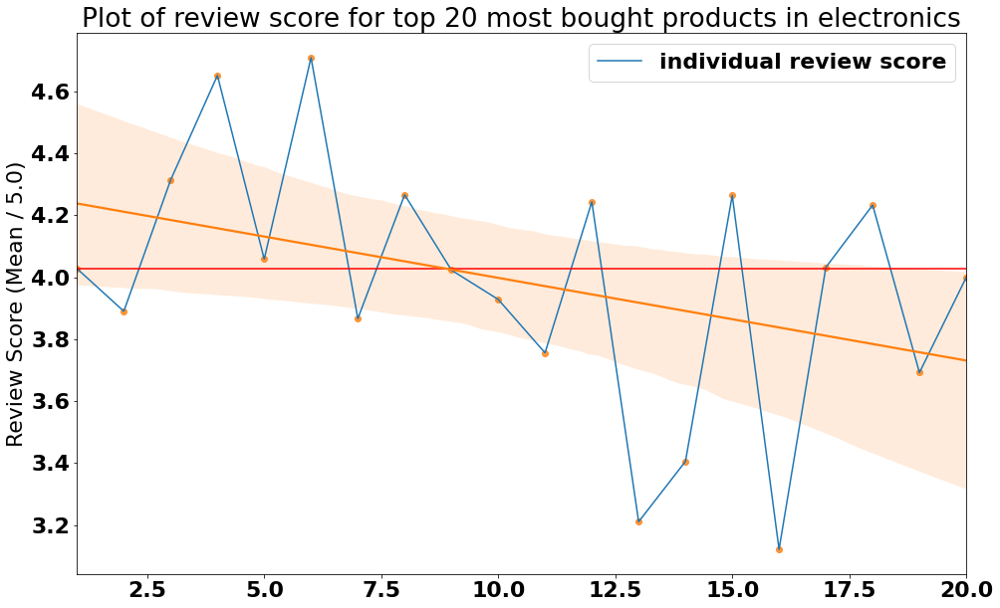

None


Top 20 most popular products in market_place
                          Product Id  Number of Orders  \
1   8d1cfc0463b545928bfb4e589e017bd4                26   
2   9af7b4a3262141c12ba9bd489a8573c7                17   
3   c5d8b84a90f73bd09c30e71e76caaa11                14   
4   cf1d8e226162a1d0ad61f29b7ed72d82                13   
5   b3cf0a98f31b76ed0cec13d9c77102c4                13   
6   3215010238fcd9cab6ba7d2b81a6973d                13   
7   e9b3cf27d68caa64832c4a7c460abcb9                12   
8   3c794d260ad4b5f507a5d90df23523bf                10   
9   20518c6950587eb5e8f02dad2fa0d685                 9   
10  373c022e7383e108569b38098f3ed975                 8   
11  f1d3e7a4605f6cd5f2a3cf9bde5c7845                 7   
12  be5f0f785e9495b018017045cc207457                 6   
13  d9894482fba41f536a273ba2276d951f                 6   
14  f8dc3e347e9b954a84d1d5e42b500e4c                 6   
15  635b74f3dd5462e3c133b42cd9299fa2                 5   
16  5cbd407f3315b628

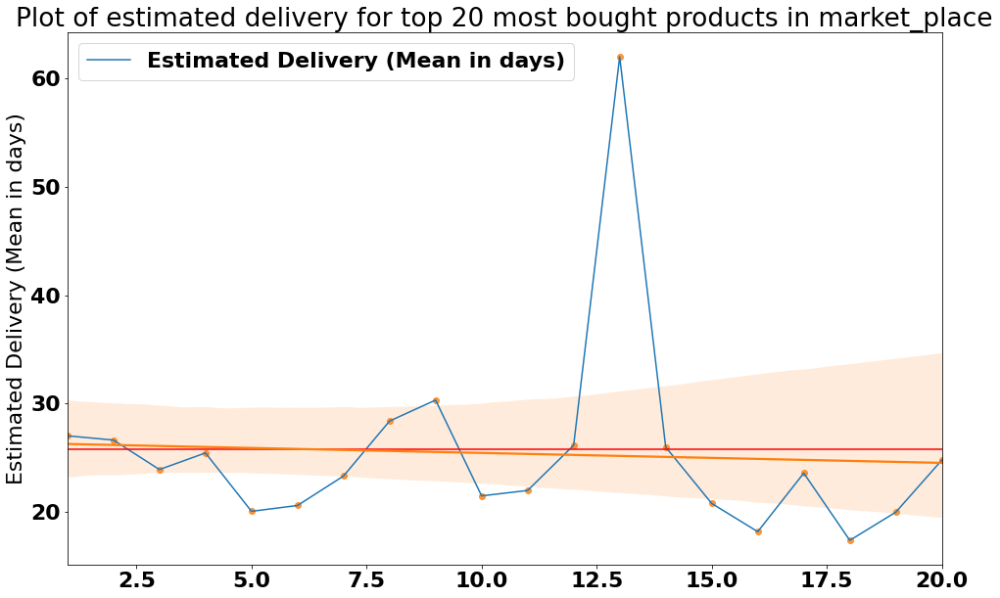

None
Top 20 most popular products in market_place


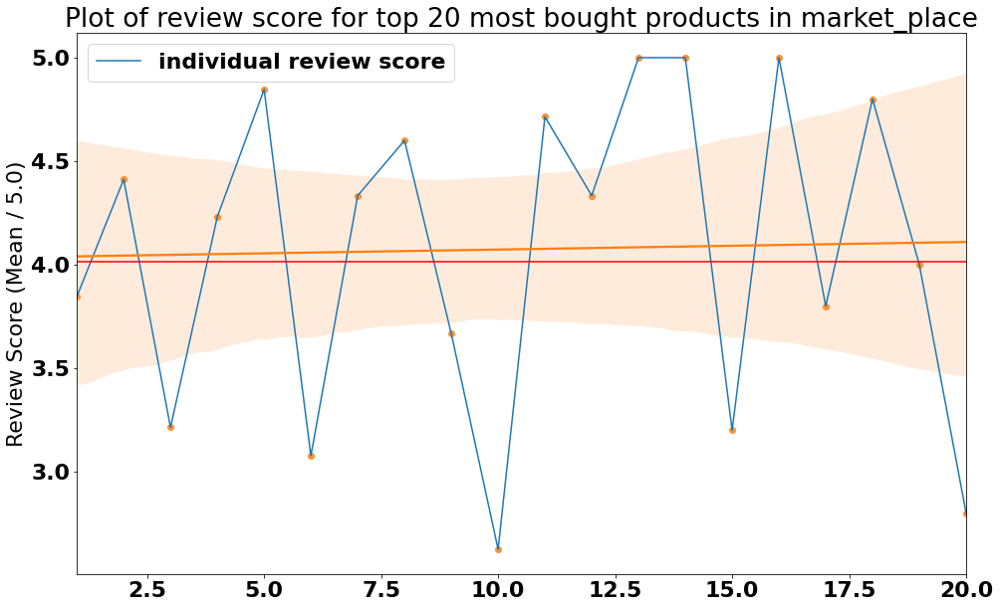

None


Top 20 most popular products in small_appliances
                          Product Id  Number of Orders  \
1   79366d6a24de9351b7ca6e3cf75a68ec                29   
2   63d6e7ab30f482382c9dfbbccae7da54                21   
3   44fc450365728c413fefc547592626be                15   
4   a5e537da8376b8623758e0186bfa400f                14   
5   d2bea3c01e172037caa99b2d138f39d0                14   
6   2043cae78c8b731c405c7329a05154b2                13   
7   db25a58a5da5dfe2fd19f2604491bd27                13   
8   9a99bb9931fce41bda596488d0653c39                13   
9   b76364870c38ddd7dcc9dd9ab5abeeb4                13   
10  61a4100ccd6d9c4c808a1fd954ddb8ad                13   
11  cc2232dbef2c9fca23f4c7f6a19a42e3                13   
12  de92134fd940e9302d27c31af4581fbd                13   
13  304104a478e3a605db6072a22e4ee228                12   
14  1501b0033c68a37fa9560033a440e529                12   
15  81d879a43537a2803762ce12282ccbc9                11   
16  717c660fd7ed

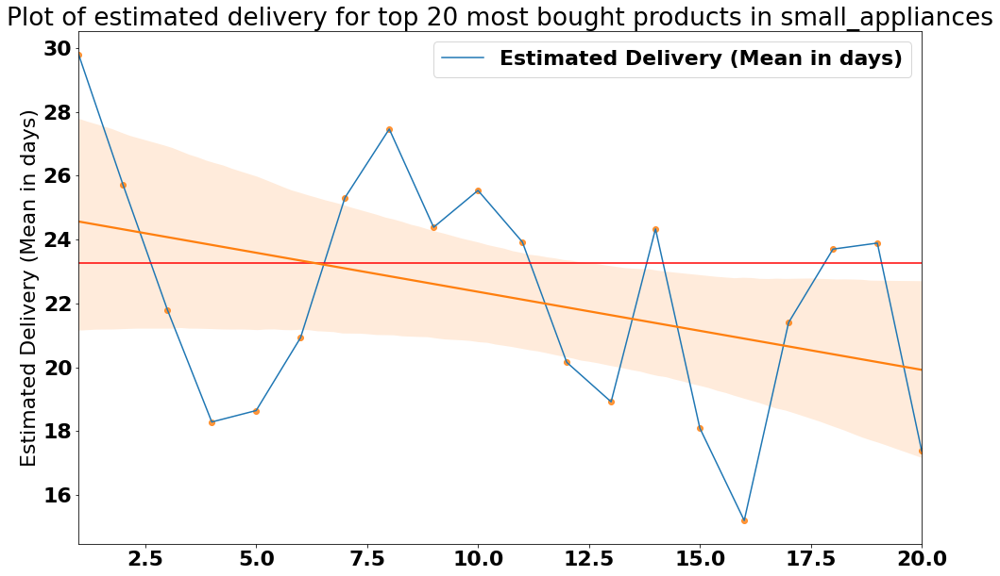

None
Top 20 most popular products in small_appliances


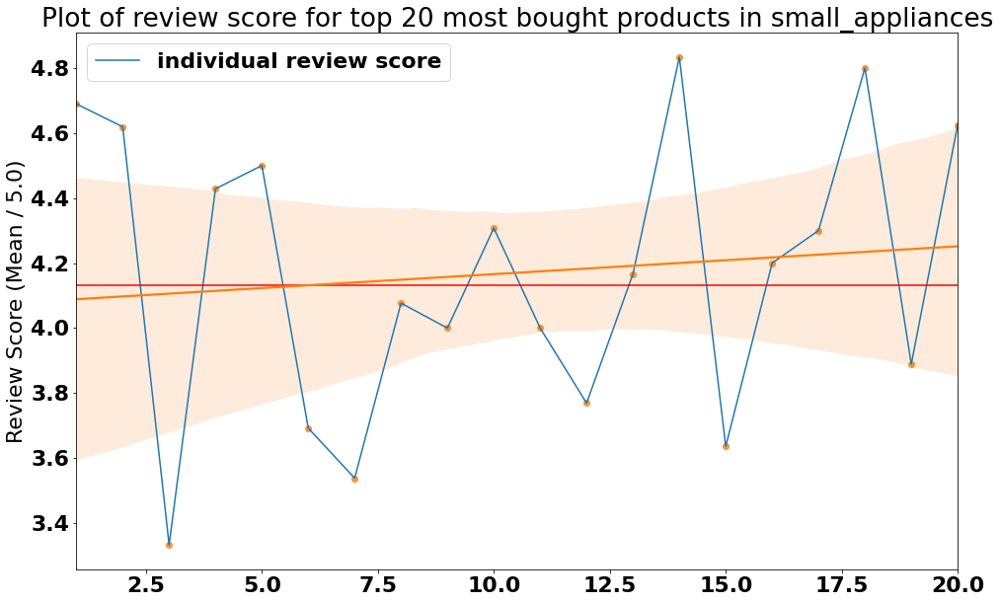

None


Top 20 most popular products in flowers
                          Product Id  Number of Orders  \
1   7620a27f1d6747511f1c6f0ddb63c0ef                10   
2   065554bfe0244b9f5f6414f332106a21                 4   
3   e89607ddfcf953bc7a85adaca52e122a                 4   
4   5fd35bd0069ce2a404716901326b1336                 3   
5   be0e6c61c2bcdd9a4d022ba67fd66189                 2   
6   74356542db3483a78a8ba69f5b7ea094                 2   
7   94656ce34a307d26e23011bb25148c9e                 1   
8   4a3ffd5293869f4b85d163eb3b4d0faa                 1   
9   5127baa26f9d08000b80cc8b063fcd89                 1   
10  c56d677c973431acb4abfedbd33d488c                 1   
11  1561355720506eaee90adde6aa1375a9                 1   
12  e0714d4d2e52b1fbc8e851dac210333a                 1   
13  3104dbf304c25fa1812a11ad924f8b57                 1   
14  57646b730d659bc73d8193fc5131014b                 1   

    Estimated Delivery (Mean in days)  Review Score (Mean / 5.0)  
1              

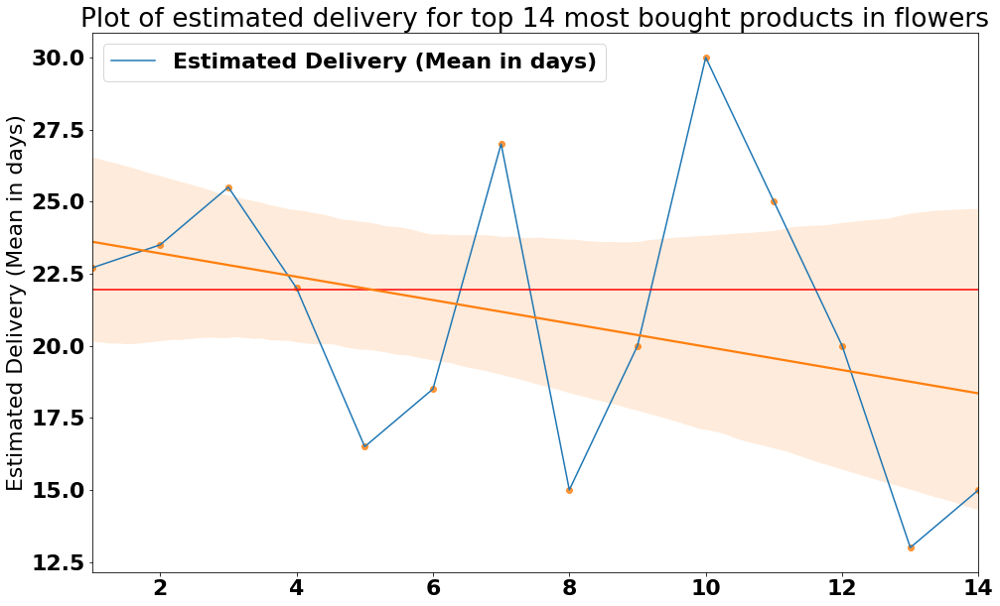

None
Top 20 most popular products in flowers


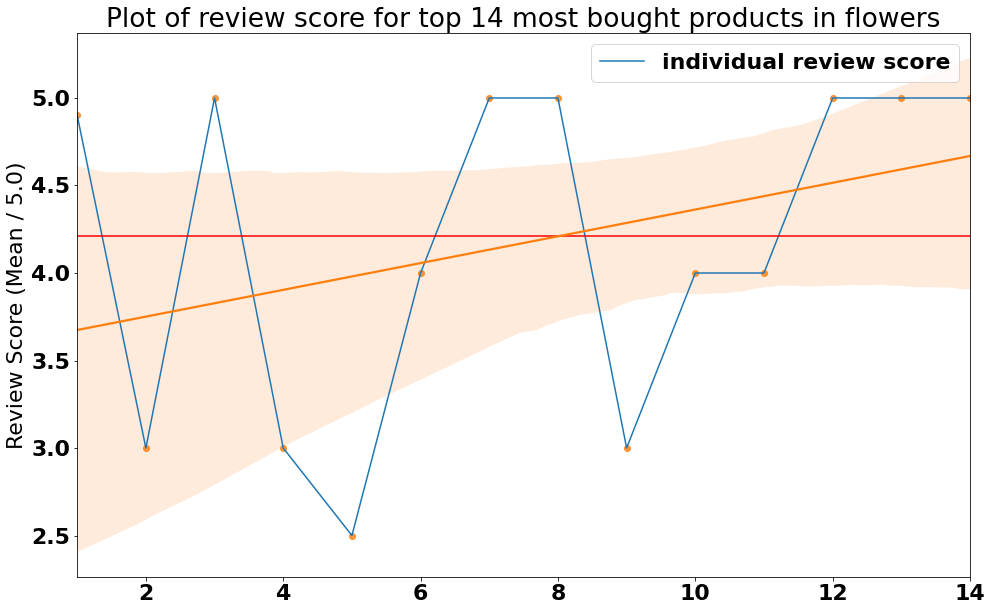

None


Top 20 most popular products in music
                          Product Id  Number of Orders  \
1   4befae07dba4384f6d8237ad1e7f8294                 4   
2   2848023ffcfb063bb7aa0d0c447bd116                 4   
3   d655dc03de9b831ed22639631ab2958f                 3   
4   e500a9395078ba5b59387db0dbee0063                 2   
5   5fb3ff04cc8ff9f140b028d867a6b0f4                 2   
6   def080e33b38a4c756347d4665b40a7f                 2   
7   2b250e4c796f4ce9da7ee0465bd1b574                 2   
8   0eeeb45e2f5911fd44282e5bb0c624ff                 2   
9   1428c05db72682f014dc218c294724ea                 1   
10  ede21d9928e12f59d3dcd5586c77cf09                 1   
11  20d7e618ee9f33f59efe64ca4059d185                 1   
12  614a7083f3c1a64a1829fee6bc60d90d                 1   
13  24dbd57bf68a29e64c462b88087b93ed                 1   
14  06a2ab007679c70b21a1123749c09719                 1   
15  664a3e65f7a940066cd9881c28c47f57                 1   
16  88c44792cd15d55bc4263bf

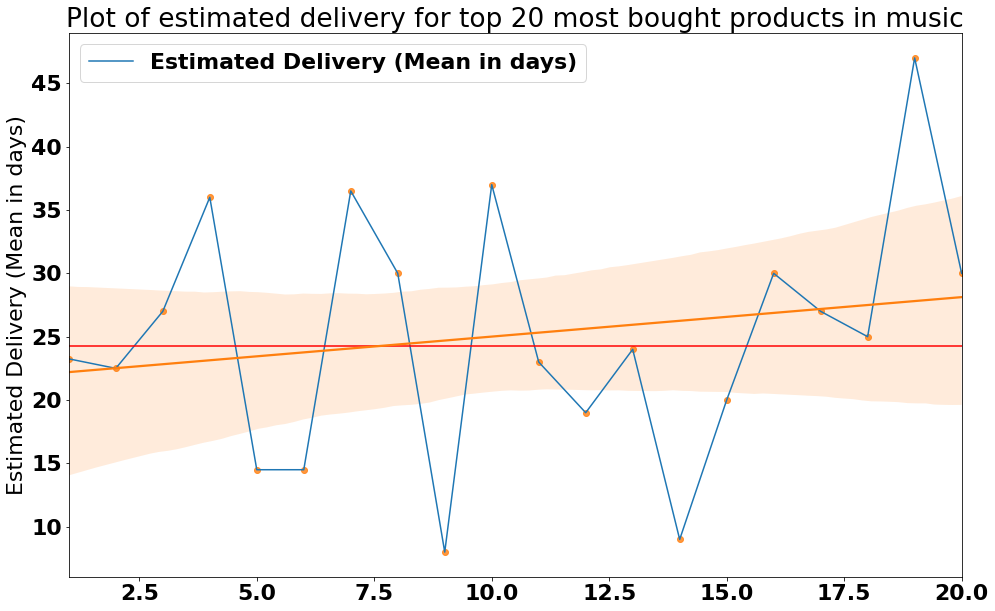

None
Top 20 most popular products in music


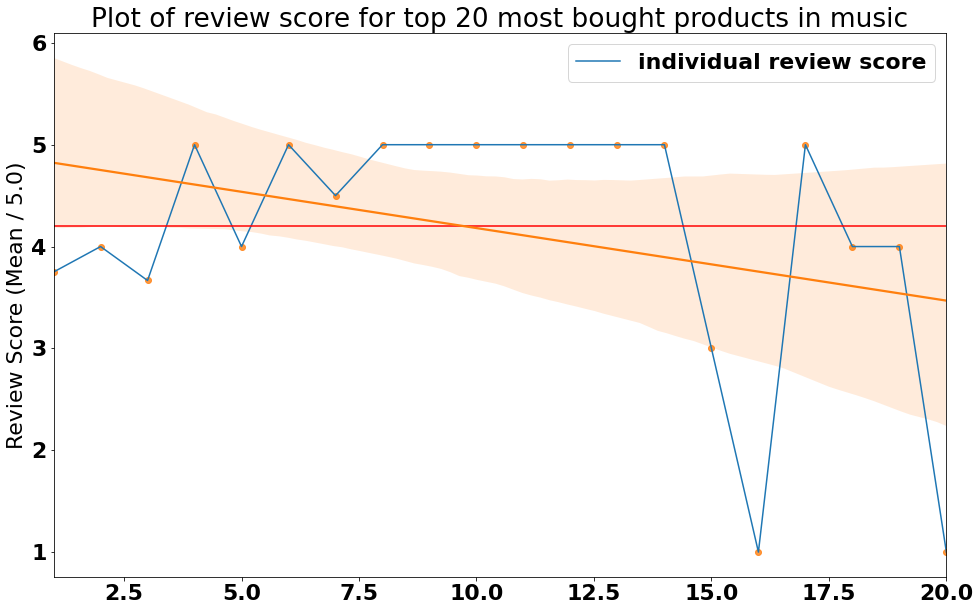

None


Top 20 most popular products in la_cuisine
                          Product Id  Number of Orders  \
1   33900d427fa4bd3f509cdacda72e84a3                 3   
2   cc9e875c2df286dbed83efe01191162c                 2   
3   2365562e74dd46f5e99cdc696c504cea                 2   
4   724c49c346d2979339d366fa59ce49de                 2   
5   d29534bc8c74cd3d91e0f175a5c9b366                 2   
6   ea9b0b855335919945731f9368f83dc9                 1   
7   e2dd0cb9b99517a86cbc9441cbb55348                 1   
8   b52e7c92200ed9874e77bc09b5ed4d40                 1   
9   775596b5ab8f1cb5890c7263c1c92bc4                 1   
10  0c800efe70e04ffcc3b266946e3e4826                 1   

    Estimated Delivery (Mean in days)  Review Score (Mean / 5.0)  
1                           20.666667                   2.333333  
2                           27.000000                   5.000000  
3                           23.500000                   5.000000  
4                           23.000000      

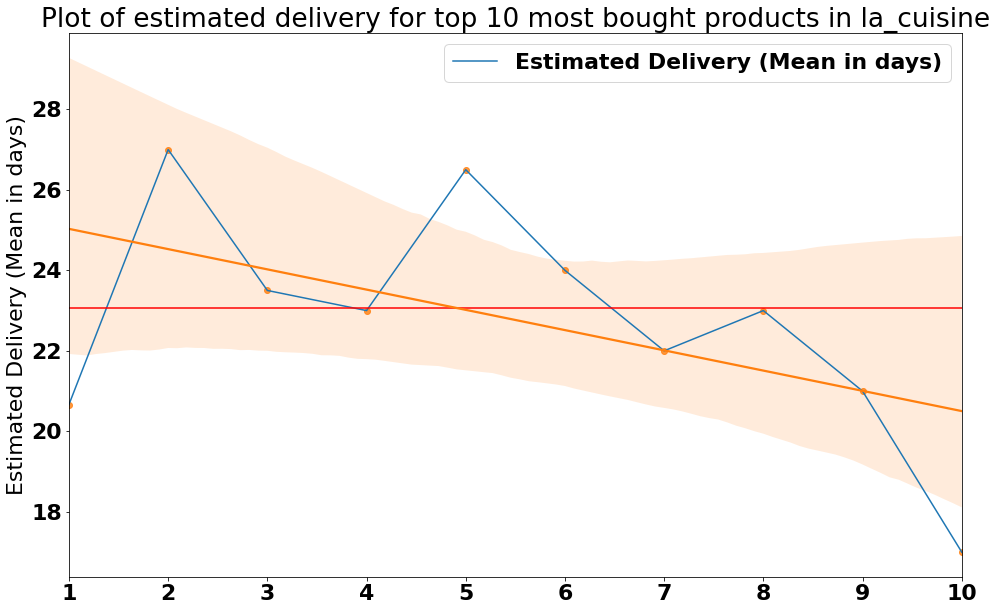

None
Top 20 most popular products in la_cuisine


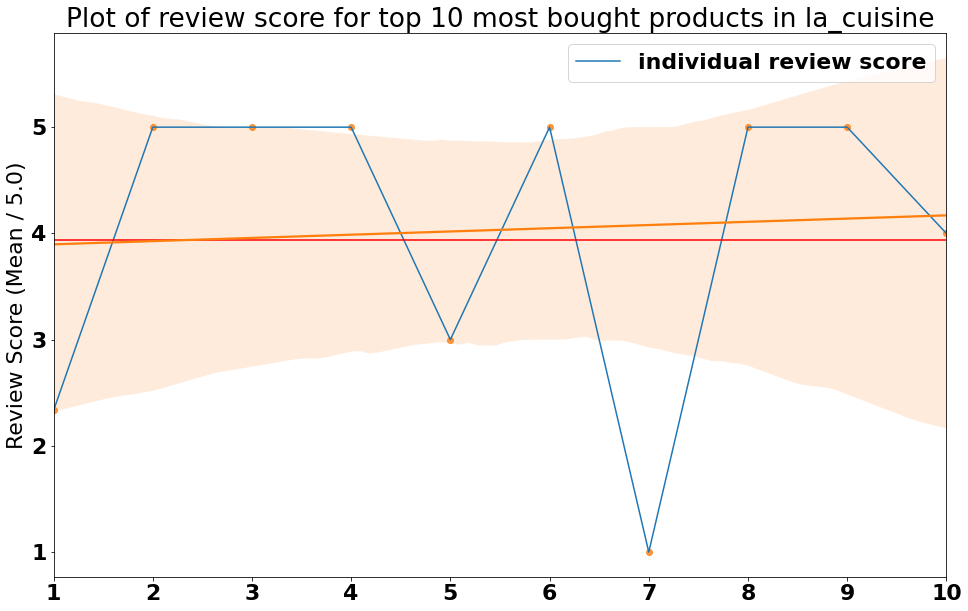

None


Top 20 most popular products in luggage_accessories
                          Product Id  Number of Orders  \
1   f71973c922ccaab05514a36a8bc741b8                69   
2   af51d485dc5255ba2e18b21b550156e6                56   
3   c7b3cf9de7be95b3e09e7a63315685eb                42   
4   6109d0cae3bcb57d579bc0fab6e61814                38   
5   c92f0e7b9d49a9543558d6532772441b                37   
6   657247f6f60543b93e3cc708a8e6329c                34   
7   30ccf4724f5227265f837e9ba0246278                29   
8   2b939dc9b176d7fa21594d588815d4a4                29   
9   e7d26dd6742baca292020c158e6720c3                27   
10  3e4176d545618ed02f382a3057de32b4                24   
11  aede48631330269f65a8d680de491657                20   
12  242edc6b84c00f0d48c664a020a92c52                19   
13  c45f017c36f9112a8bb4f170edfb1870                18   
14  82183967d9fde935fc0b0189bb68ccec                18   
15  d34ec3c23c142291062f958688a1b41c                13   
16  f0bbc1bda

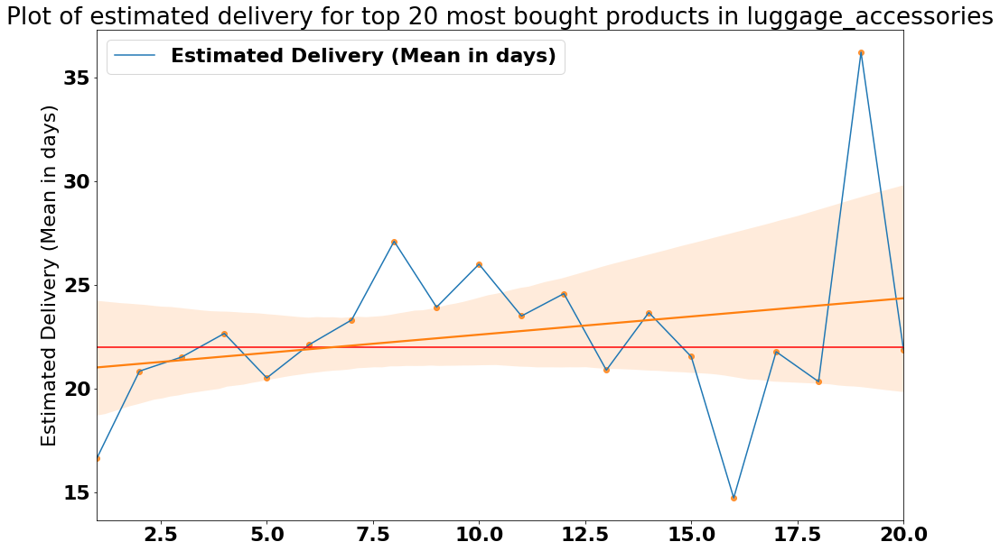

None
Top 20 most popular products in luggage_accessories


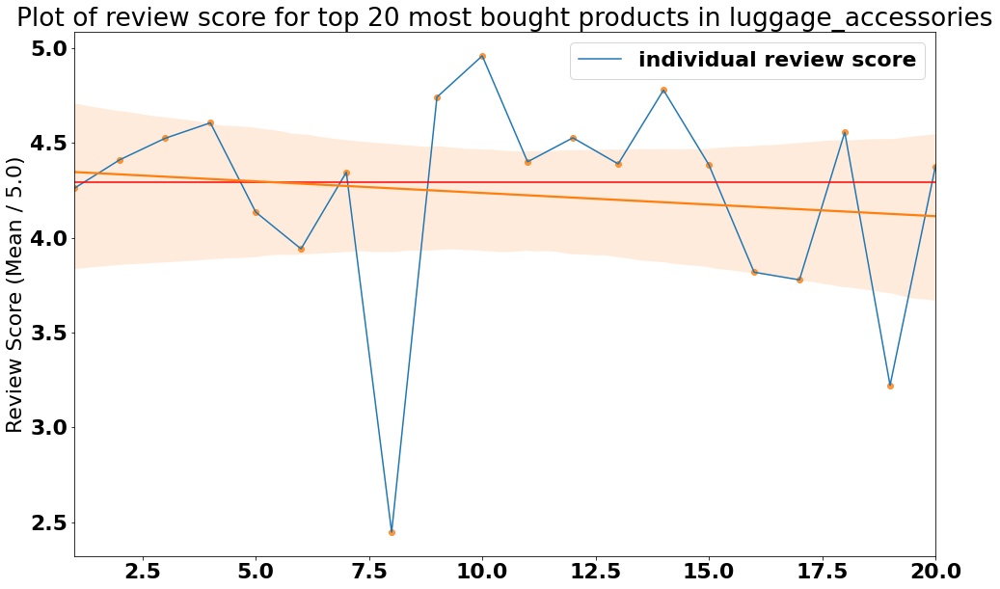

None


Top 20 most popular products in arts_and_craftmanship
                          Product Id  Number of Orders  \
1   b9976e9c22fb1540bd71d1bcd2989475                 5   
2   43f224fb79bae5b22585eb868fe3b84b                 2   
3   3a96bcbf644a5d390107570628568026                 1   
4   56a1efb30499b4dffd45c8d655199b11                 1   
5   9c313adb4b38a55b092f53f83f78be9e                 1   
6   2b54fb9a4acf707537eb53eb2458c241                 1   
7   4a24717893a6c8f3cfcf9843b8987d15                 1   
8   6bb18295cc019bf3b6dc7c773411d530                 1   
9   189d6b9a380642d0ee2245277cc9b2f2                 1   
10  5aa0d6ed4e6c0995d62090cd82cde89a                 1   
11  1cf657de01c2b973b898ad0ac9073ac7                 1   
12  78eacca1151432fda7271e7e53e49720                 1   
13  ec90895370885d025efeb8e72e7fa699                 1   
14  43506d2b6b5e0535079f88c7dc51c4de                 1   
15  eacb104882d39ffb53140b1d1860a7c3                 1   
16  08c5c3d

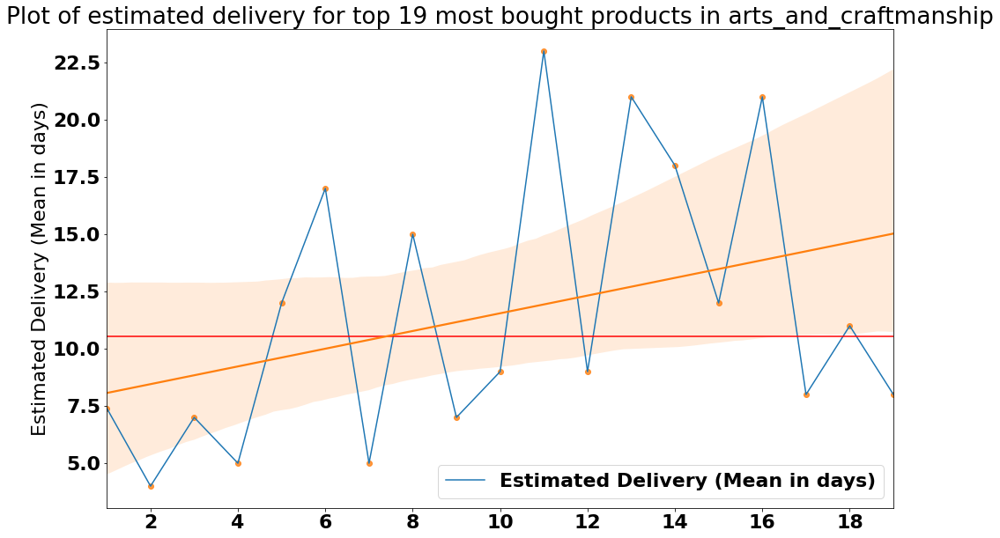

None
Top 20 most popular products in arts_and_craftmanship


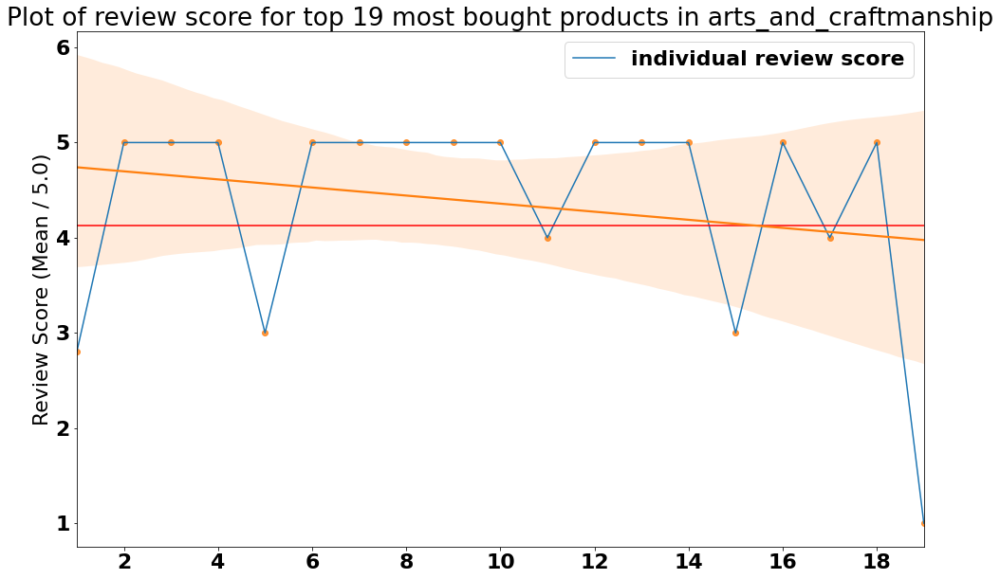

None


Top 20 most popular products in food_drink
                          Product Id  Number of Orders  \
1   84f5c4f480ad6c9998d6a6860f1a2e41                25   
2   ec96b7b4e1401281edb9465d0d689cae                17   
3   992197904e1d4f0bf3994652373188e4                16   
4   54b755678728b84472c2b654ac4de777                15   
5   42eb5329dd0ee3d76d135ce04c84451b                14   
6   90f97298579cd20412fdcc9b7a2d4b6b                11   
7   a54244559e62c8ef2939e52189d65d4c                10   
8   1b28df0b54809d40f2bd2f2218c601a2                 7   
9   7edfb4c96d69a75d28b973bdc2dbcfaf                 7   
10  37eab73447adec63c01f2cebf76afd9e                 6   
11  3ae810052cf18d30232367f0b45e284c                 6   
12  63a2b46cda9cae69cbbb77dc2b0165ac                 5   
13  0776155007ad20447a0b0f91d4aad644                 5   
14  ca4fe13c336a5399a892b4afabb17abb                 4   
15  434487f82b5c35646bd8155cf1946179                 4   
16  e7be446dd7fa8f1652

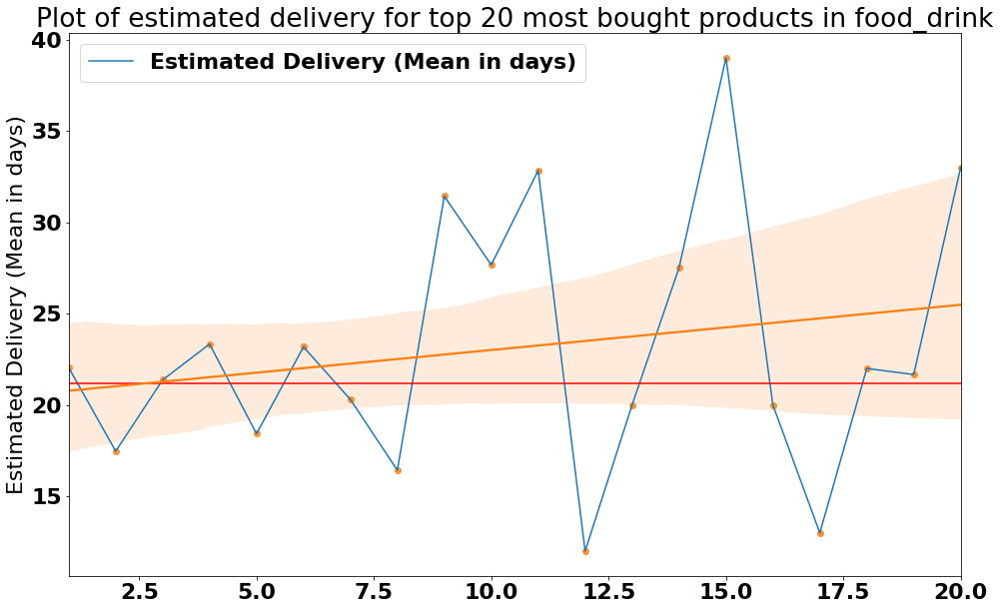

None
Top 20 most popular products in food_drink


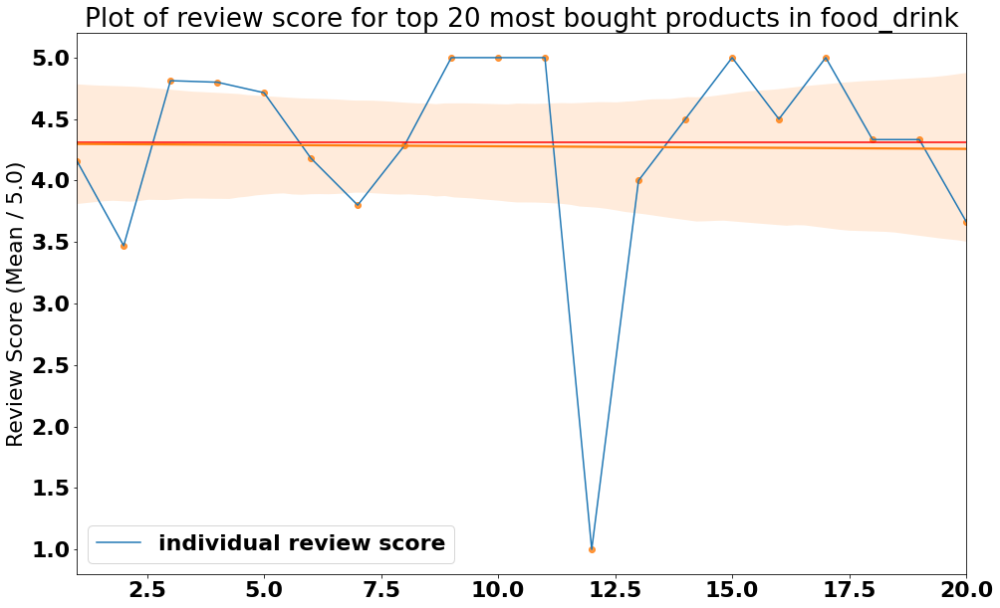

None


Top 20 most popular products in drinks
                          Product Id  Number of Orders  \
1   cd48f265a63e13b762601f5f794c5fca                95   
2   ad2037645597db38527fe3afbe226af2                24   
3   d99526b1e4fa5f57b8bde34a7337b5ee                21   
4   8fa67e5cb309b9cd7b4438e15948bdb2                19   
5   211293b50935ced8d4370f552c482d74                14   
6   ab40c45cb88545d5efa2679b30cec4c3                13   
7   157ee978f4fcdf8984b0bb33a6687fde                12   
8   0c9439abe84dc40a64fc164365c4d064                12   
9   17da5d80ea0eeabd565083183027d588                 9   
10  839c9cd22f47fc465c20d554b46fed2c                 8   
11  8eae309a711208a0e5e41e110cddb1ee                 7   
12  3a7d90845985f39048815a6939c56be4                 6   
13  0bcf6f2768e7e4cf76462a7b7e0ca0c6                 6   
14  5b99f79ba0d929b0f3270ab0f0f5911f                 6   
15  7cb5b984262835ef46a1ed83d04d0d44                 5   
16  c968bbc4dfb718031488d3

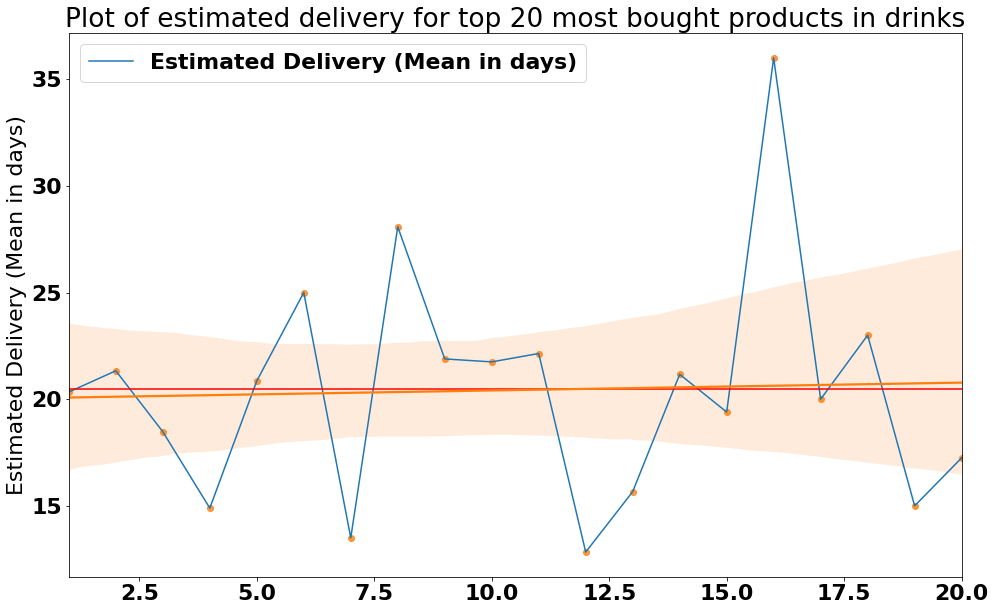

None
Top 20 most popular products in drinks


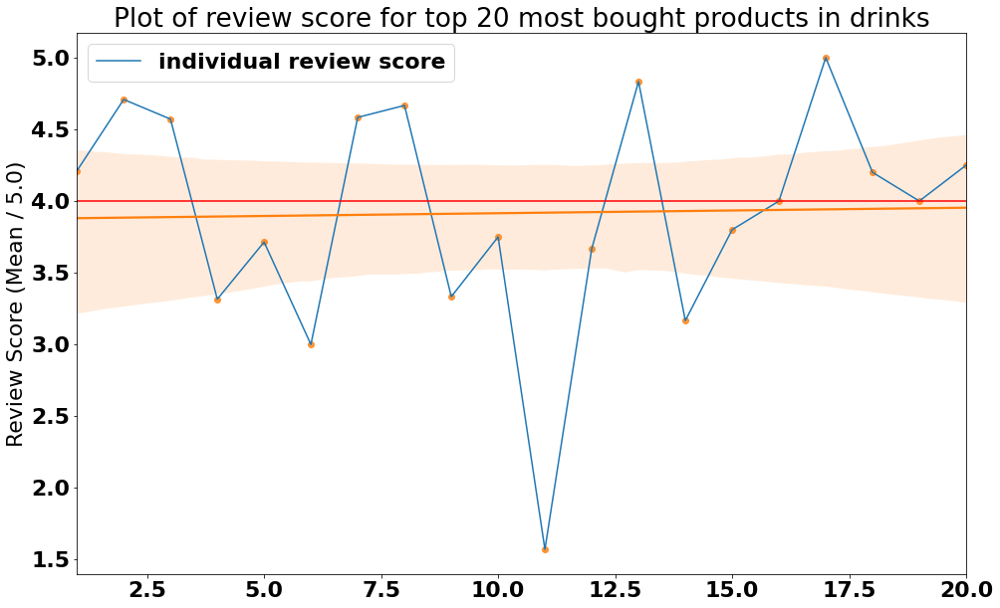

None


Top 20 most popular products in dvds_blu_ray
                          Product Id  Number of Orders  \
1   8ac47b3ab13c68f49f10dde899674149                10   
2   d55d2479e56093f23ebcf313ceb3bcfe                 4   
3   133f594a246e5c52489304a4b5a39830                 3   
4   6f19f41a7c7ac7e45f4070d07ed80a75                 3   
5   ebad2408485504e930678ed1af88790f                 2   
6   c82cf18016c429035d415a45a1546652                 2   
7   f2f6433af969cd131435a2b163d5af96                 2   
8   47d52bb24ef8a3aa09724f00604be3ba                 2   
9   2d31f67b1edd83be73d1448bc1f1a7c7                 2   
10  812b558694cd8e22f35f9d1bcfb549b5                 2   
11  0350ac874c8937571b129554110ec3b6                 2   
12  63b0acbe2513293d425f64289b622766                 1   
13  f44a1931c29511b4e200e4c044c83cca                 1   
14  5af87403ae95da1184c5035ef7e10c07                 1   
15  fe1ba35c47a4b599f34ce8ad2aa2c42b                 1   
16  06cdc7832ac572e3

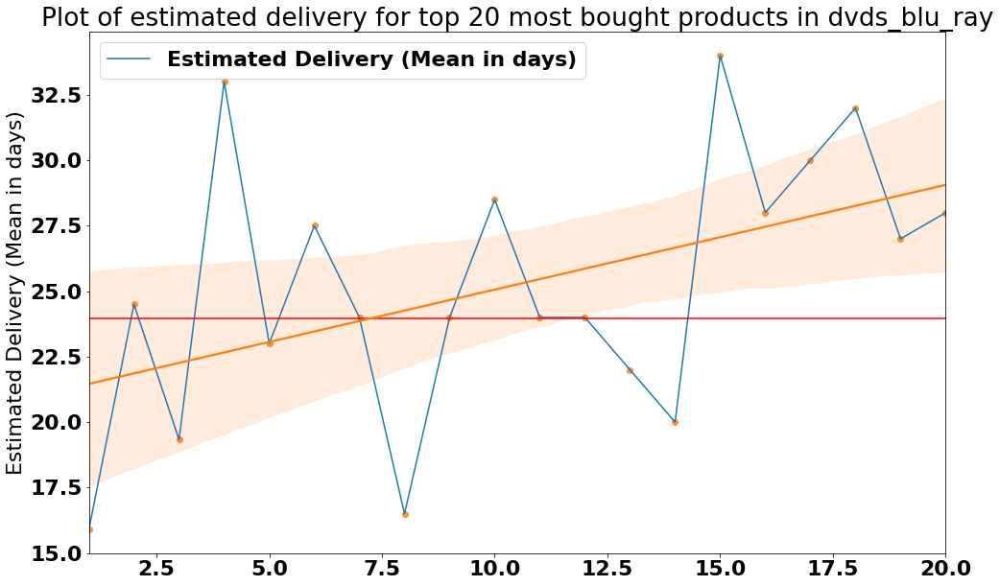

None
Top 20 most popular products in dvds_blu_ray


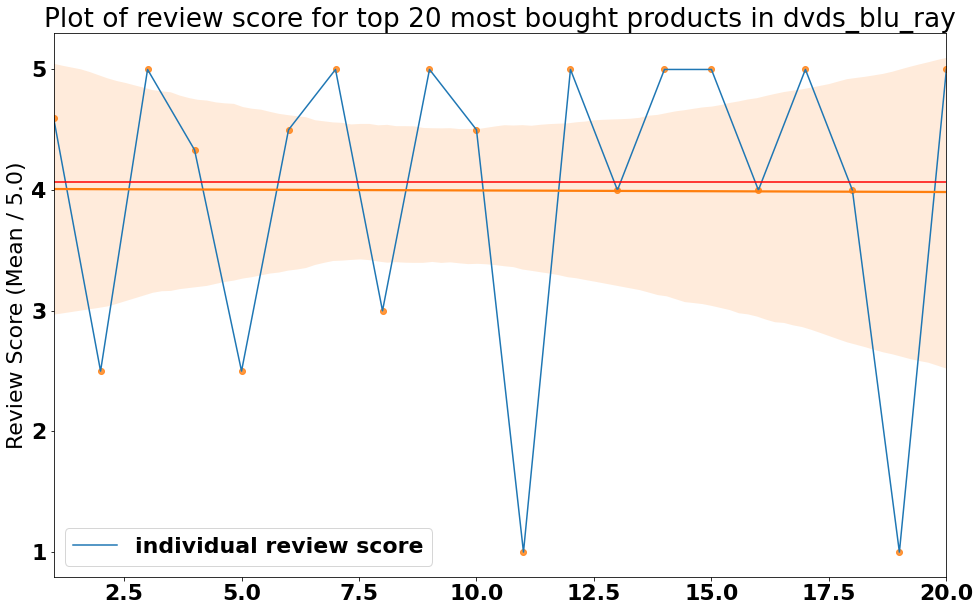

None


Top 20 most popular products in fixed_telephony
                          Product Id  Number of Orders  \
1   913580fde3e72c3b3e4ce0b79963bee6                18   
2   b4f9530c931398e215242293c2c8ba4c                14   
3   4633dfeb3a2588bdb52af32d504b44eb                12   
4   db51982bc43b26164c29605b8ed140d6                11   
5   f07ef9dd6e2d9a366ff30a25e210be70                10   
6   665adf6cc6e09e6a770ba182ea6a50f1                 8   
7   5769ef0a239114ac3a854af00df129e4                 8   
8   1454b29e83ab2f8bf6b4102736498ff5                 7   
9   193d170dd2f6849cf0cb92791a6a623b                 7   
10  6536314c94d43b787fc1c622941da14b                 6   
11  2ace3826b9a1b13030adc77ae9ae7902                 6   
12  19936fa4f614ee0590d3b77ac83fd648                 6   
13  68d9c8a95d2b7cb57efe9e1e929bdd6a                 5   
14  46e5995ddd4728e50343ef6bdb45b75f                 5   
15  80dfe643d04536672f84431155e07728                 3   
16  81227b918dc75

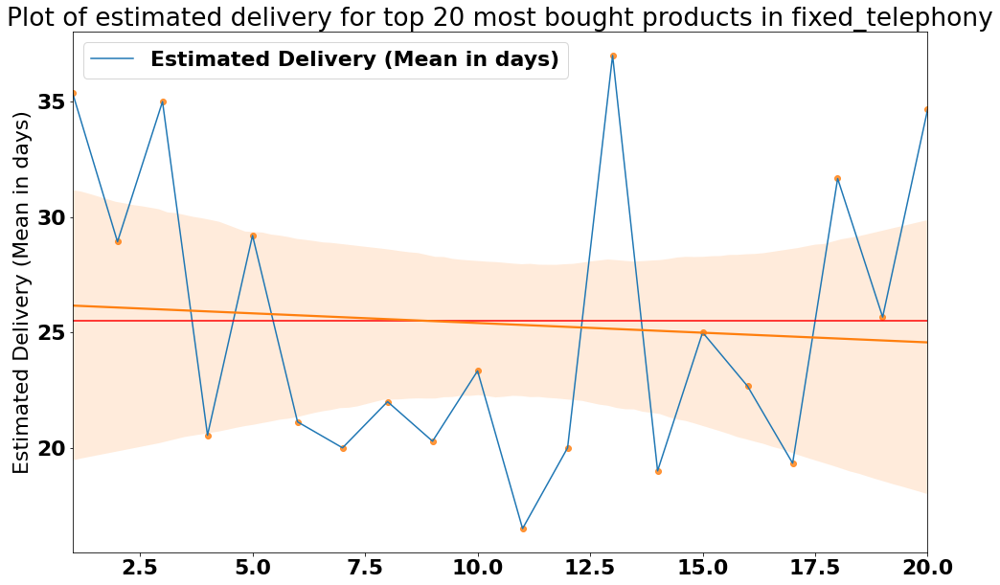

None
Top 20 most popular products in fixed_telephony


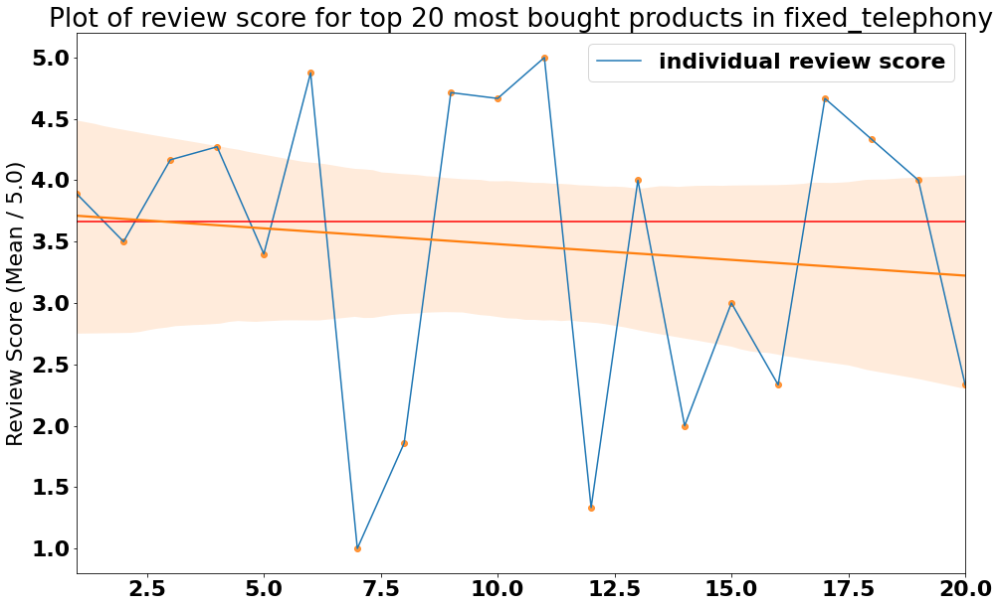

None


Top 20 most popular products in fashion_bags_accessories
                          Product Id  Number of Orders  \
1   d017a2151d543a9885604dc62a3d9dcc               147   
2   1ec486885049bbb9b79351d150ed18c4                43   
3   87283a98b24f9f1ac3a31b631073cf47                38   
4   44d097d59e8430f88a67517cd0c4f865                34   
5   ccadfeab525a9eb1569983b66e5075c4                34   
6   9fe172fa8e662ca8572cf12abf8bce23                32   
7   5d7c23067ed3fc8c6e699b9373d5890b                25   
8   6c81db10f914c4d032b14fa93aa0a818                24   
9   f177b434709ecb652dbee4f4b19aef2f                23   
10  89e4362d74afa10ac57f8d67210132a6                23   
11  5115d8cd6438c0c4d8abdf38d5d41ebd                21   
12  43f88c8353708451babf9bcdd1fda92a                21   
13  77fa3381855b6763c52ca3b72824f508                20   
14  e24f73b7631ee3fbb2ab700a9acaa258                19   
15  1d7db62a21ffb4f220d3e8a05fa77e02                18   
16  e456

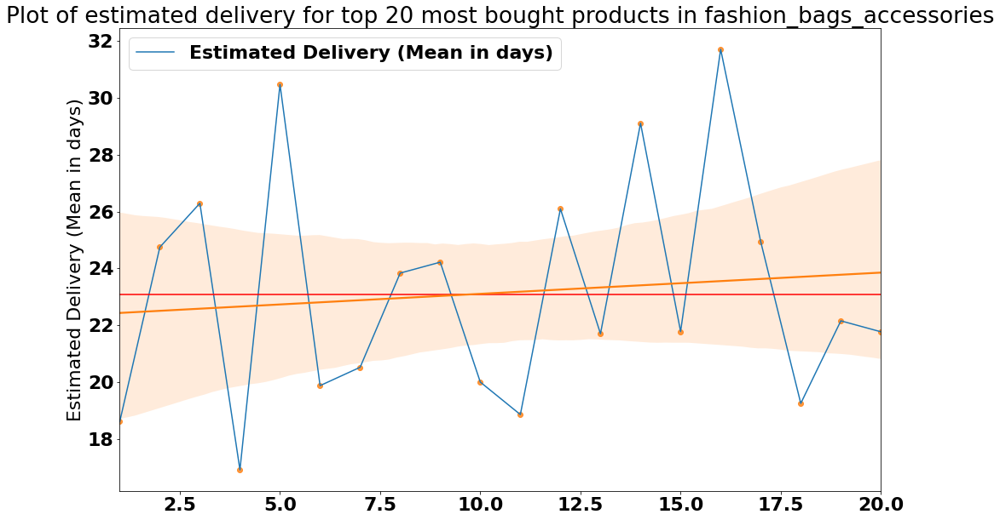

None
Top 20 most popular products in fashion_bags_accessories


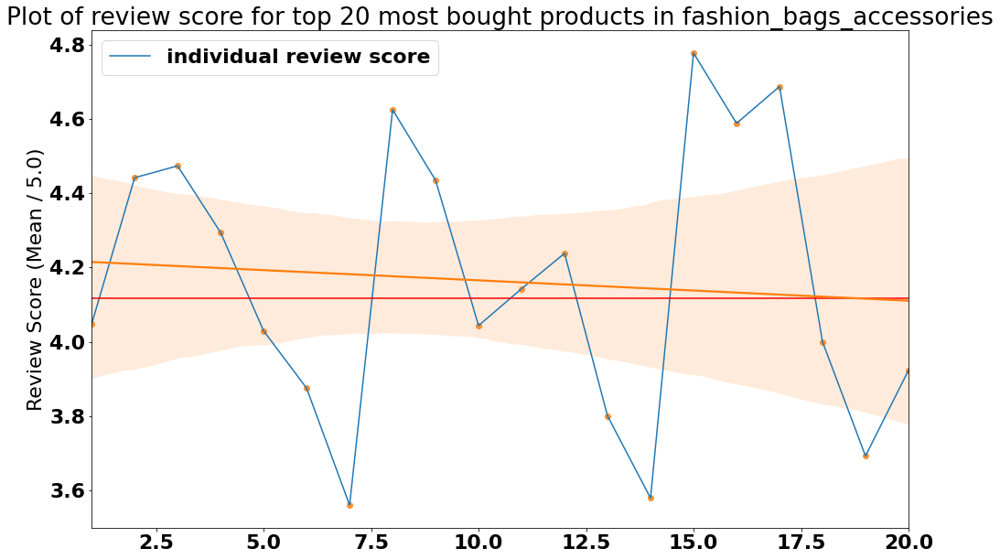

None


Top 20 most popular products in fashion_sport
                          Product Id  Number of Orders  \
1   e8f7d2639ff8caa8b86e5973295898b7                 5   
2   cc696680ea0cefcd5d7d5d928afb8de8                 4   
3   a38e6346616a8f362c328b9537b1ca4d                 3   
4   700a315aa104dcf3ea345a850f746ec1                 2   
5   17636e3c15333148e25253db631a2d7d                 2   
6   e475b26e5db4c91fa1cd25927908eac2                 2   
7   2c955308d12bcb61c241322c9d0390f9                 1   
8   f2f960ea3804c29b5e5834c34082a0f4                 1   
9   0fa3e881b0014107d46c7fb9d55fd685                 1   
10  3210c94e2542d988d724b0dd72234cdd                 1   
11  da8faea5f69f03fce4dfc01ceee4f1dd                 1   
12  ccb3d3835758ca91130e00c46c3c11bb                 1   
13  f750e77aeeecafcb47516be7f8f278b8                 1   
14  cf6b03b7b6a0d499505b4342f06e5f80                 1   
15  494822838e3883190a3b0834d5124c02                 1   
16  795ed92f8a2263b

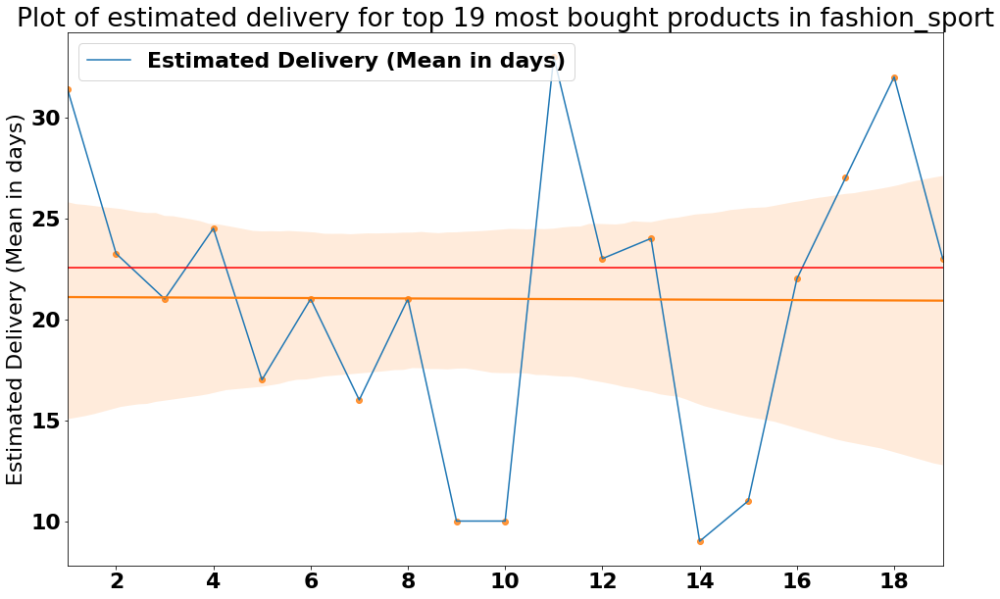

None
Top 20 most popular products in fashion_sport


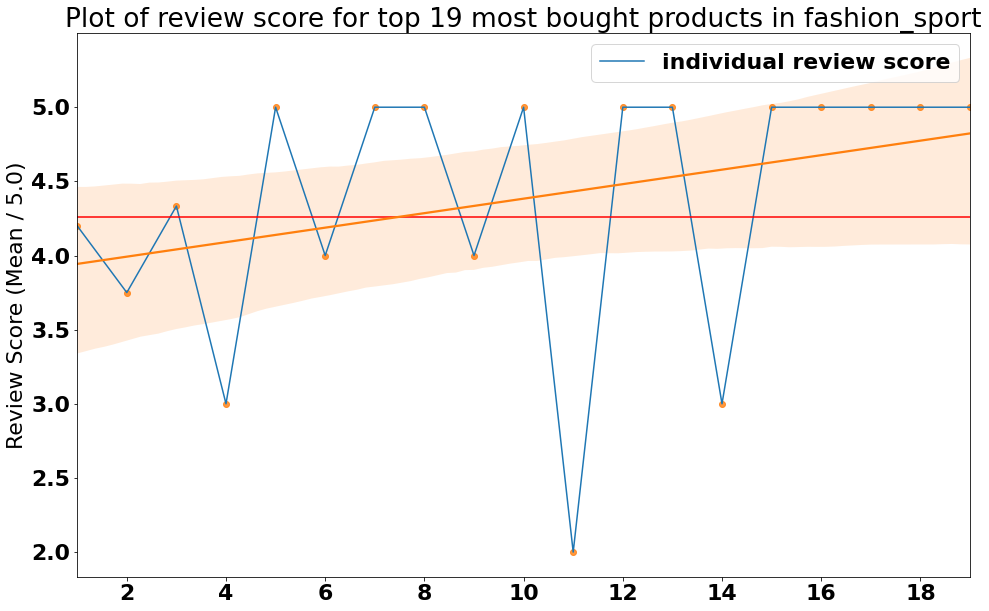

None


Top 20 most popular products in fashion_childrens_clothes
                         Product Id  Number of Orders  \
1  57bdf3098169cccdb62221bd3e089cbd                 3   
2  8cfc3506cedc0626364457d254429118                 2   
3  2b18330ce86ae5c606250b75b499f370                 1   
4  28ac6af4008a402e5039f3e042a36e13                 1   
5  0ab3ab3b2869073aa9afe795fe9151aa                 1   

   Estimated Delivery (Mean in days)  Review Score (Mean / 5.0)  
1                               24.0                        5.0  
2                               26.0                        5.0  
3                               22.0                        1.0  
4                               14.0                        5.0  
5                               22.0                        5.0  
Top 20 most popular products in fashion_childrens_clothes


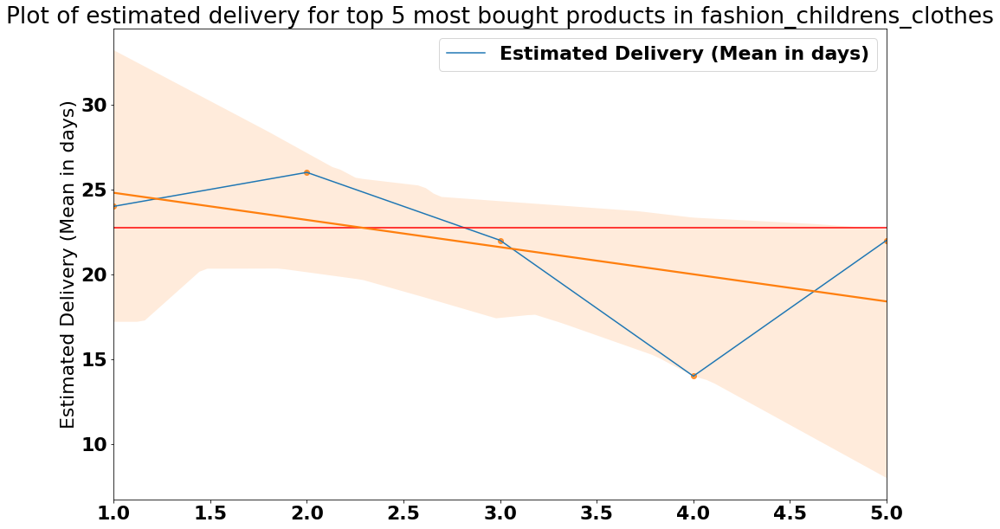

None
Top 20 most popular products in fashion_childrens_clothes


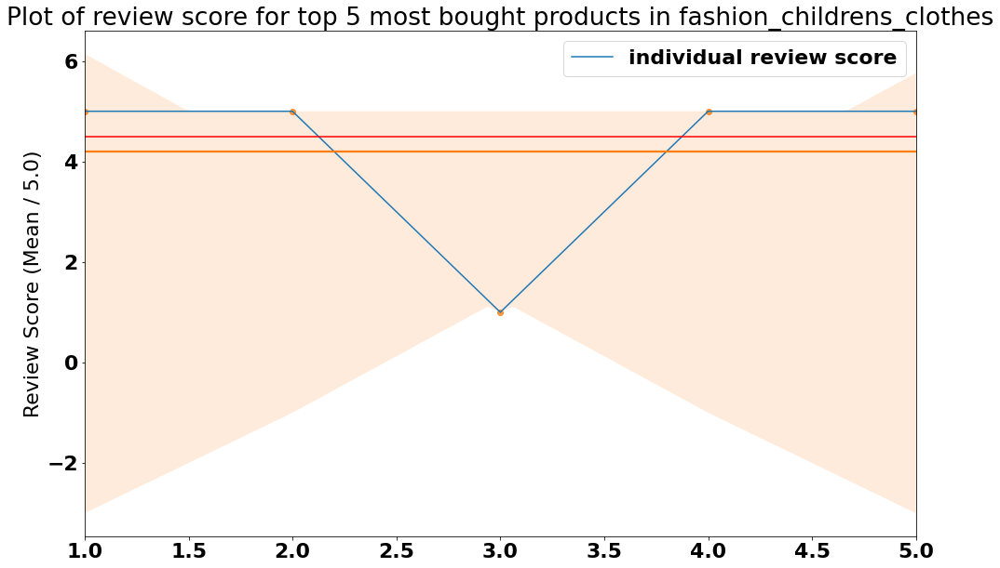

None


Top 20 most popular products in home_appliances_2
                          Product Id  Number of Orders  \
1   e5d860a0fff2e94bd1a406456cc6c4b3                17   
2   76fab799e52e98680a1aae62daef914f                14   
3   f27aff266ad97e75d4a24c893b2c311e                13   
4   2d063994ae4667cff3d6841e9d441d1d                11   
5   7fe486a60125c1541517e30944f95066                10   
6   99c97d191bcc87e072acc4521bce44d4                 8   
7   c3182d1991c7d4859e8f39b6c45a026b                 8   
8   ba230fc7bcaa2f503c46d73098caeb66                 7   
9   87feb07adc221a4c6cdf051ea1afd0ff                 7   
10  418b40c9e83b7e5ac79e4a7ef975ebbe                 7   
11  ce5cedf6e57d59b07eeecb68eeafd099                 6   
12  c8c073a1cae6a98799d7581958ede514                 6   
13  6d5172990dbf91301b99da2fc11c9609                 6   
14  84952f1f00709e71d58587cb34163e26                 6   
15  df0c26d7ddb998e2517658a55e46e48a                 5   
16  1743a97176a

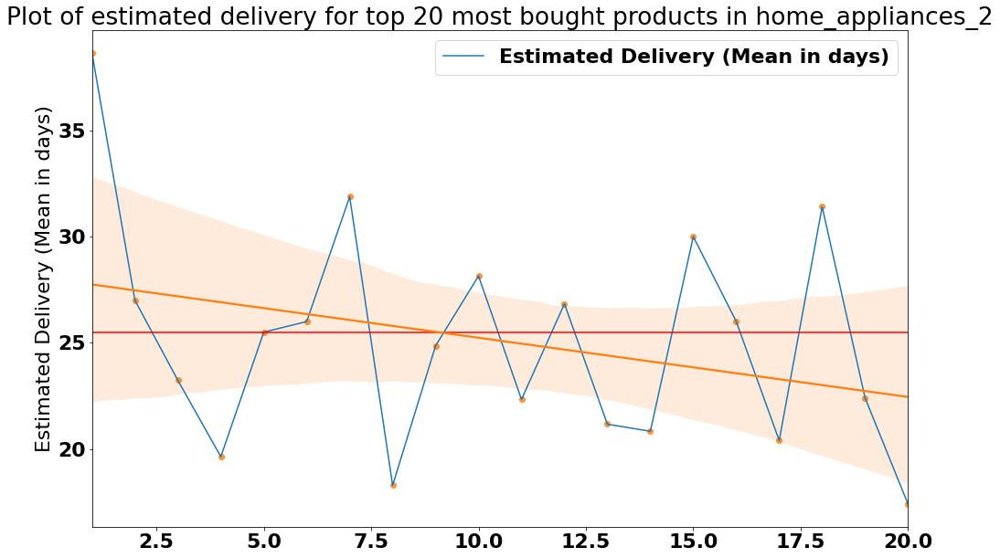

None
Top 20 most popular products in home_appliances_2


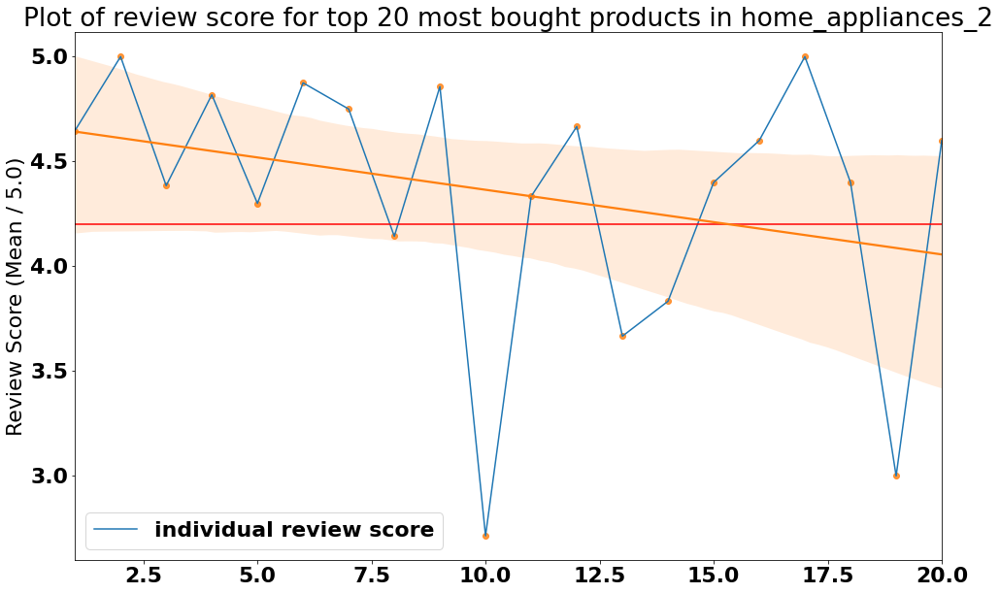

None


Top 20 most popular products in party_supplies
                          Product Id  Number of Orders  \
1   4a7056788ce9287c76ade358f2e2572a                 8   
2   90dbd461e405599ef4d208e19e472125                 5   
3   137464dece73fa2dbb54658dbc7aae58                 5   
4   99b4596b82b6f75d453160c9c75e01f4                 3   
5   157d8cabb7a3a318aed5ce596f4be96e                 2   
6   e583bb5fa3cb1e876a6ea48f21dfef34                 2   
7   0fca2bf7fe83539c429a0357389333e7                 2   
8   3505d914958a72baa40d2b1e0c56cd29                 1   
9   1ca64333e21cc2921b28c702e3ad522b                 1   
10  71b7afd92c42feab780d5ea512fc7348                 1   
11  9dfb6a06c2c6ee3127e05b422b4a7a63                 1   
12  833fb04f7b1c82365c0273e62de0c19f                 1   
13  b8737fddff36bc91ad9cf4c8d781f525                 1   
14  ded0fc03d15300415b27c4b3342fefe1                 1   
15  733162823b9a1dbc958b0988d32229da                 1   
16  4c303e0fd131aa

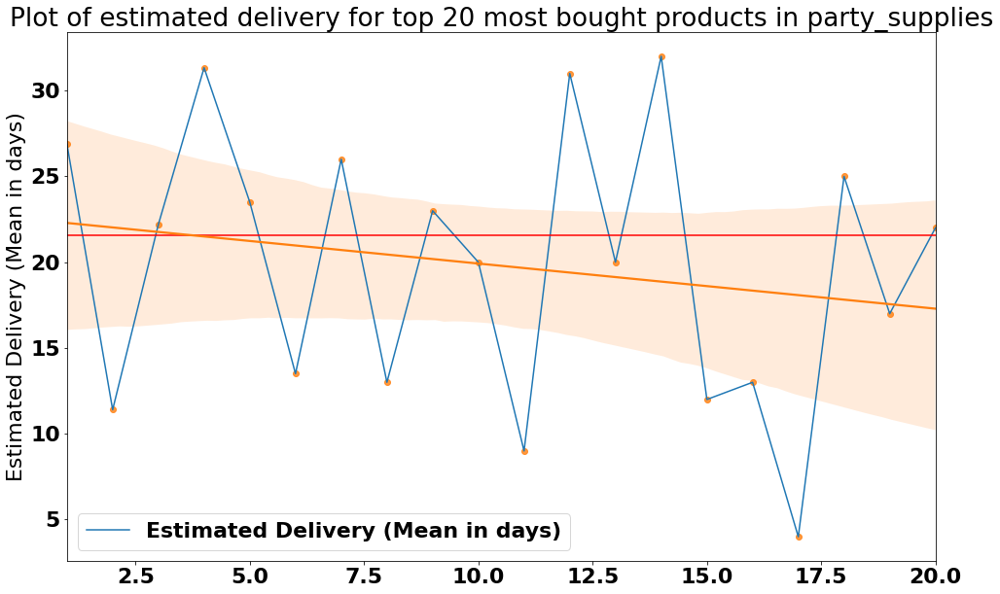

None
Top 20 most popular products in party_supplies


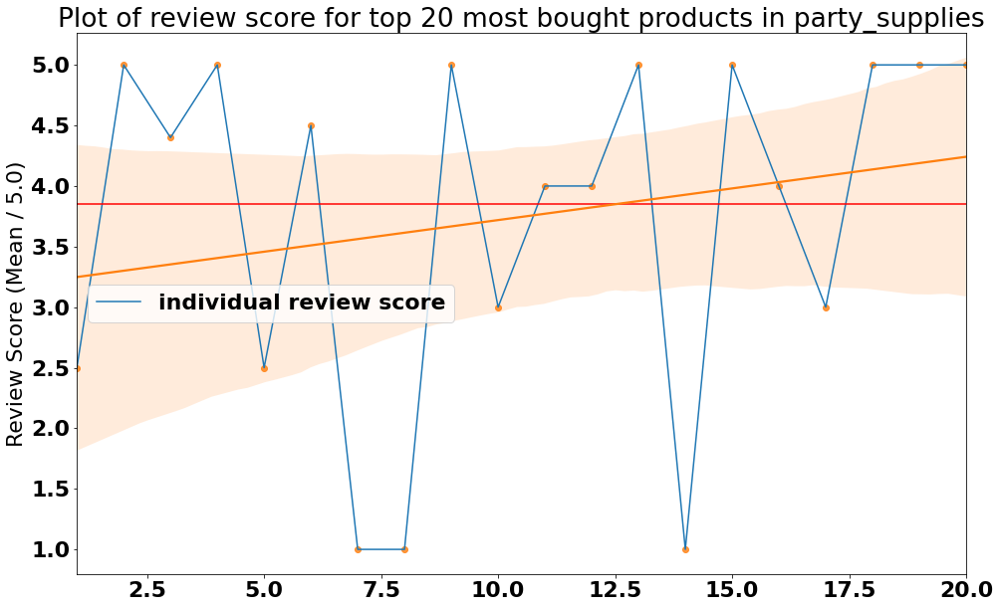

None


Top 20 most popular products in air_conditioning
                          Product Id  Number of Orders  \
1   98e91d0f32954dcd8505875bb2b42cdb                17   
2   ccb162ed569f47d83f62aebd5700d7ad                13   
3   0e34187d4312b97b5e698836d28ed040                11   
4   e932008cf0ea7c93a077dd8d7e5f49eb                10   
5   f2a1b32f85cad59ff2a8444154ac25f0                 9   
6   3fc00af0f0a8d4ac2933d3900416c977                 8   
7   4a96de21ccfb22ebe1c56992acbbd7fc                 8   
8   a448325c57fbf792a2f6ac7d1b730917                 7   
9   cfd43c5e600d45ac029357406b05dd82                 6   
10  3be495aa2bea5ca3041d723c2db13209                 6   
11  171787b81fa784a521d7ba199e6e9fa6                 6   
12  6a709b701952f3257fb1bebb4388dcc3                 6   
13  549356446db225e7f67b22ceaf66d159                 6   
14  bcbeea161819eed81ab43bc9751e012c                 5   
15  525f8fbde09c9bf777025c3141fbbc6e                 5   
16  a3c485c1ba93

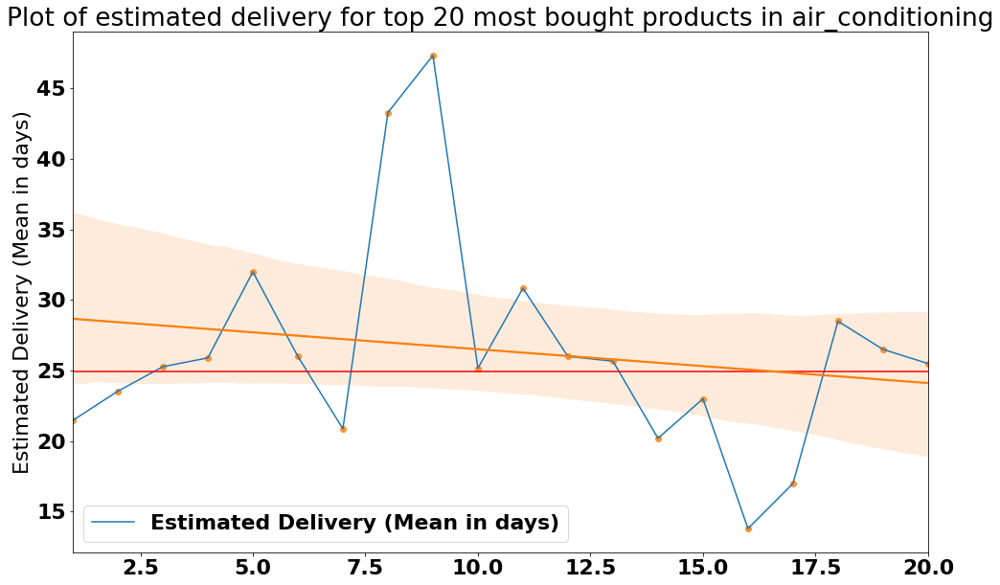

None
Top 20 most popular products in air_conditioning


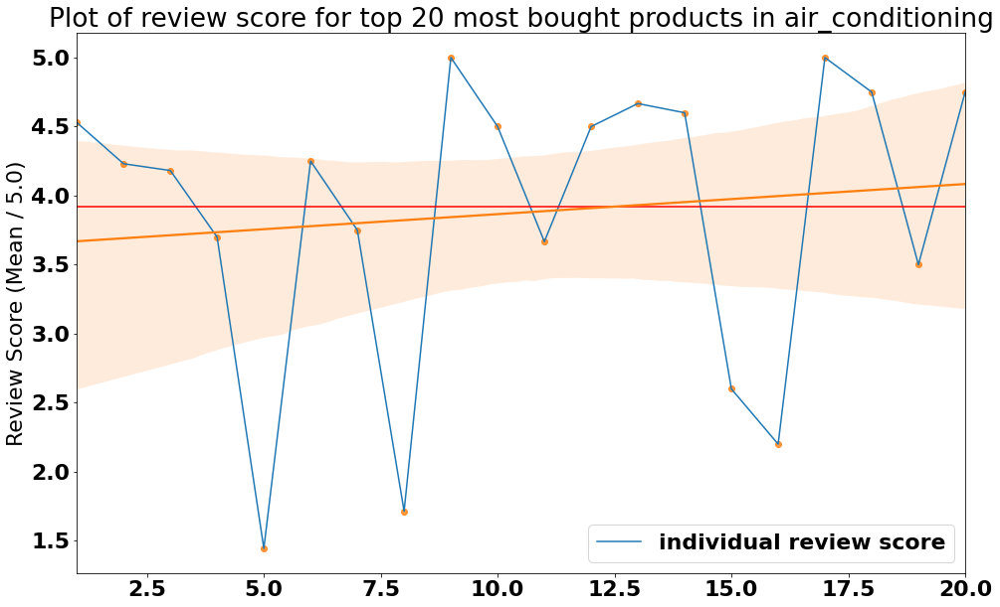

None


Top 20 most popular products in agro_industry_and_commerce
                          Product Id  Number of Orders  \
1   11250b0d4b709fee92441c5f34122aed                44   
2   423a6644f0aa529e8828ff1f91003690                19   
3   672e757f331900b9deea127a2a7b79fd                17   
4   a0fe1efb855f3e786f0650268cd77f44                15   
5   07f01b6fcacc1b187a71e5074199db2d                15   
6   3bebad3cf2c8d1a8d3ce97174643e054                14   
7   b5aebb467d9a92162173cbd234e00d99                10   
8   980ecbcc15fe174ec1e5757c4d75b1bf                 8   
9   16d096faa27582985f849f08370cf1ed                 8   
10  c183fd5d2abf05873fa6e1014ed9e06c                 6   
11  6ff1fc9209c7854704a4f75c9fac41b4                 6   
12  a79e27ad902bfc67386ea63ed1ef7a08                 5   
13  c89226b8a795ae3d6bca9d90b20dbf04                 4   
14  b8faf829f47ba1f35f169da4acbdb88d                 3   
15  adbcdfcfd5b8479f90579e4dd02df2aa                 3   
16  be

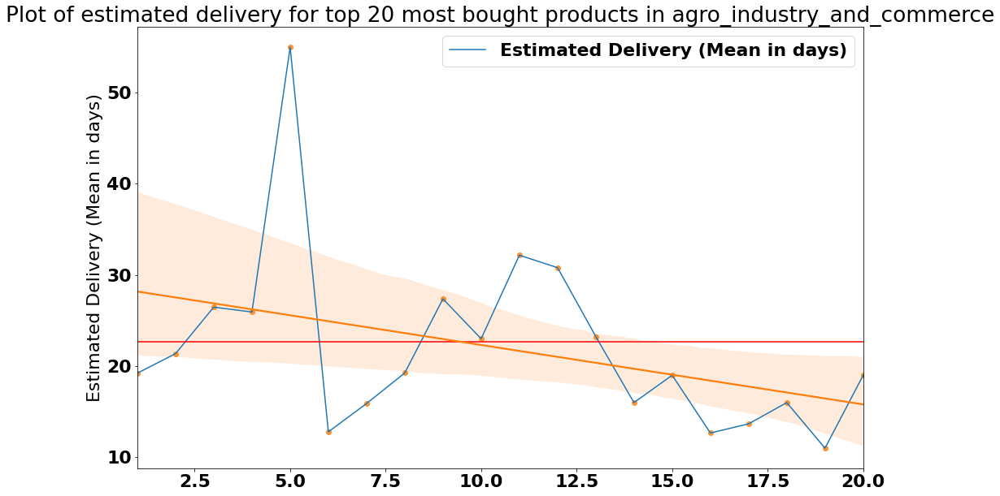

None
Top 20 most popular products in agro_industry_and_commerce


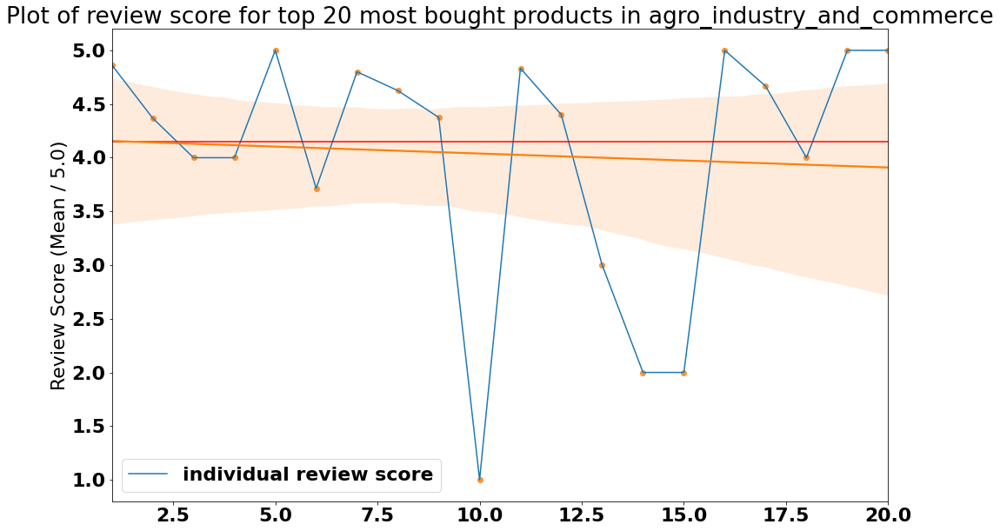

None


Top 20 most popular products in audio
                          Product Id  Number of Orders  \
1   db5efde3ad0cc579b130d71c4b2db522                50   
2   a59fb60fddcc72a9878b7ed5cb69d8e4                46   
3   7c4a8bec217df1de0df2b5aaf8175b65                43   
4   dca8cbb1c9d8a2db0fbc0c36b8d1a7bc                29   
5   13db47eae724e2848e12b71a617a3a41                27   
6   e6b6e13cf71449a457269f425b89dc74                23   
7   6eb70dfb283dc3f645ed7b03c990dc72                17   
8   9bfc55df037ce3ac01bfd84781adf7e5                16   
9   2669a9fe1aaf6cb29071f8f866014afc                11   
10  17ad6786808ab3fedfb261a70a5932d6                10   
11  3b7929cc079c14493fb6fb3373dbc1e1                 9   
12  401b5632c06c51319df083f1245a96ca                 9   
13  e0884eed28311e4365d93a89ac57eafb                 8   
14  96f027a4749058d508f6c1bda657c79d                 5   
15  a7aa202585393c58cb1351de084b4dbc                 5   
16  681ce53bc951dd4db1480c4

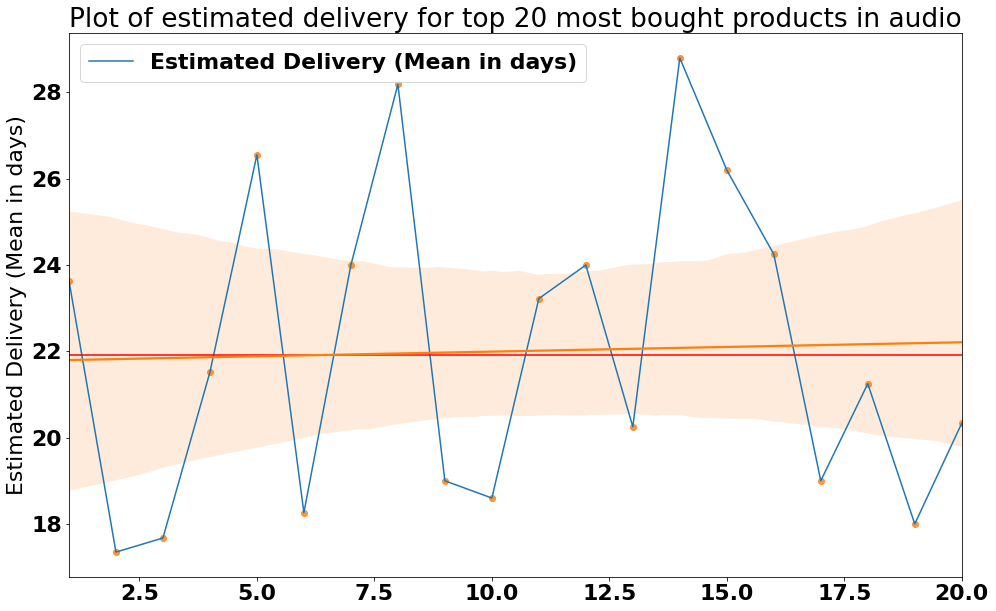

None
Top 20 most popular products in audio


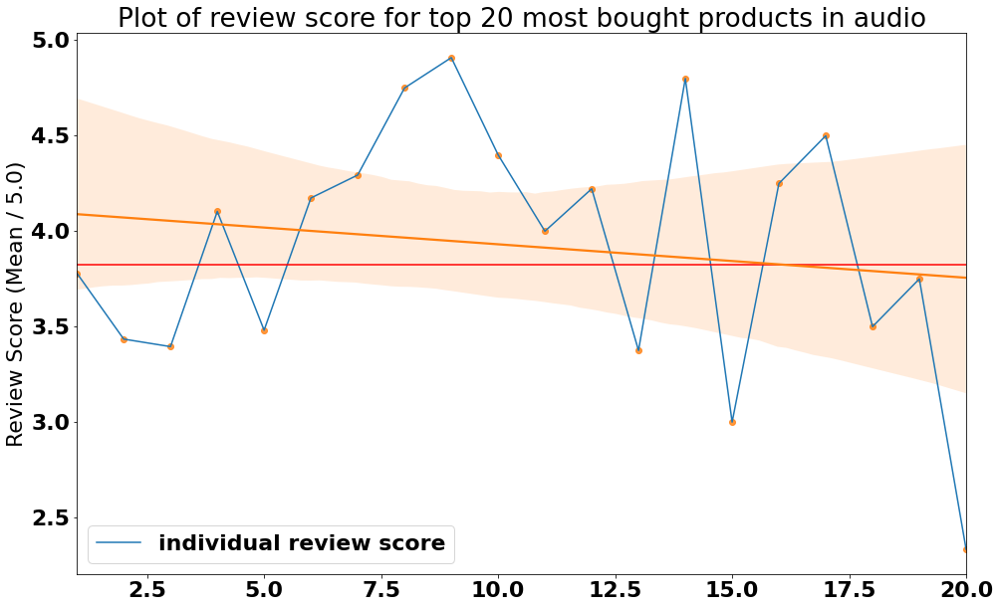

None


Top 20 most popular products in fashion_shoes
                          Product Id  Number of Orders  \
1   ac5e164e2eda939ffa46593f90077f9a                12   
2   a2c75a23c2f838881dd4275c0cec519f                10   
3   f39288f58793ce5e6985b3f7832af88c                 8   
4   002159fe700ed3521f46cfcf6e941c76                 8   
5   34eb0685663d60e57a9ca086c8e33423                 6   
6   55624051e913597daf59dee5c582b6b9                 6   
7   ca92f5c2276bfd491db575cd9de5a70d                 5   
8   6fa96cbd1d917acb1ef4bc8040116105                 5   
9   19fdf478915162331ece9adfd669b88e                 4   
10  cd3ec6ebbc74e6070297d45ca9dd62e9                 4   
11  09f62215f404dbd29cb4378c9952e1b9                 4   
12  4563d900cd3080ee4854e36ea7d0f156                 3   
13  5525bcf86683c9d9777c2f28326d7db4                 3   
14  71fa3ded050dac9c89b71383bbe4df76                 3   
15  1b4dee3e58cb87cb5a0acc54ea53db9d                 3   
16  4d58a1ff101eae5

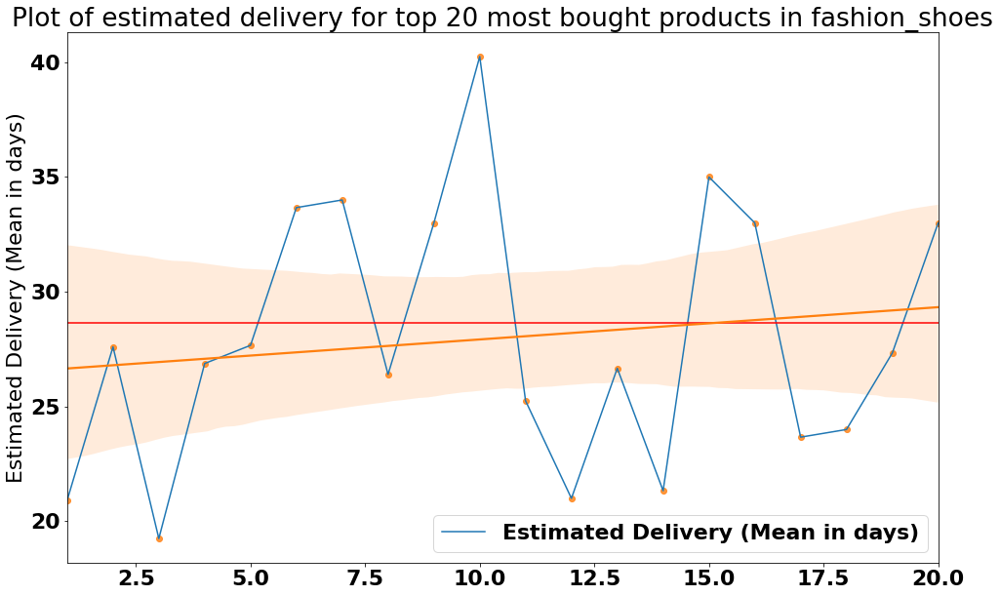

None
Top 20 most popular products in fashion_shoes


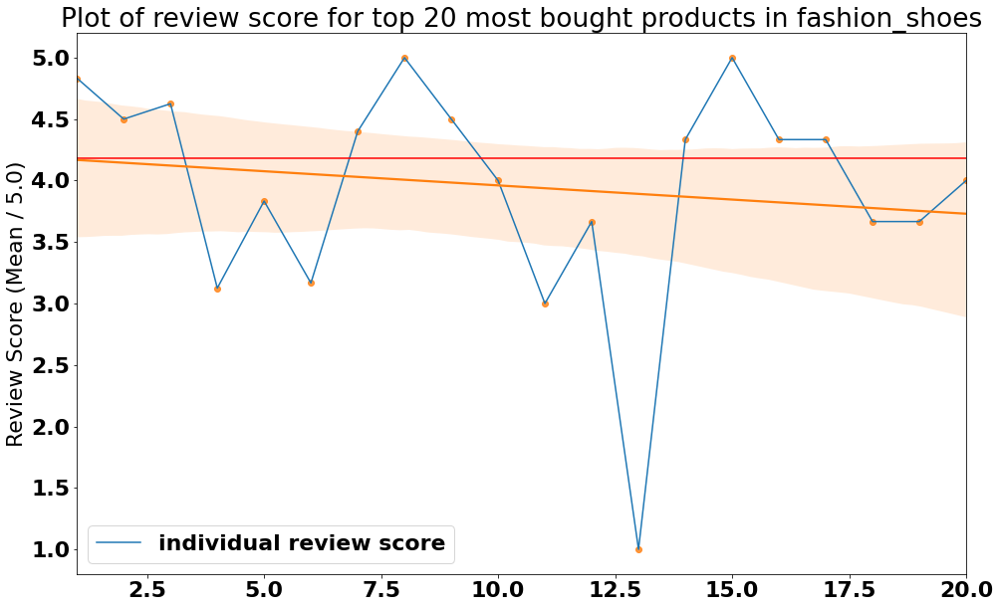

None


Top 20 most popular products in signaling_and_security
                          Product Id  Number of Orders  \
1   150c699262a053229e89213dc9c358d2                11   
2   0c8b6b6e4f9ee5fe2c48d6cee4c69bc8                 9   
3   7d8e924f1da646ec896e1c0a80ef2f99                 8   
4   bc3c6d2a621414f2e1df7a8a32a2828e                 6   
5   fd40f3ef9c7fb9c550619a88af47a5de                 6   
6   5d3b065e160c51e883cd7ef509a54176                 6   
7   49e038a7b8ba2e18d9a7a26c1f238544                 6   
8   b655ebf10fa7727c97d82cffcfe96ab9                 5   
9   eb883e95b710f252cb15d0fb41d8bbe9                 5   
10  87689c3ea34514e449355126a5fc299e                 4   
11  914323edd50192310dd03435b0e6ad65                 4   
12  161c9558fccfbf0a9ed72b42285635ec                 4   
13  cec51758e9839eb5414b214934430da6                 4   
14  04ca6bf4b3d9aa78046f0973efe2f4b1                 4   
15  668c66401c7341a09fbde2bcf15c1d55                 4   
16  fcb224

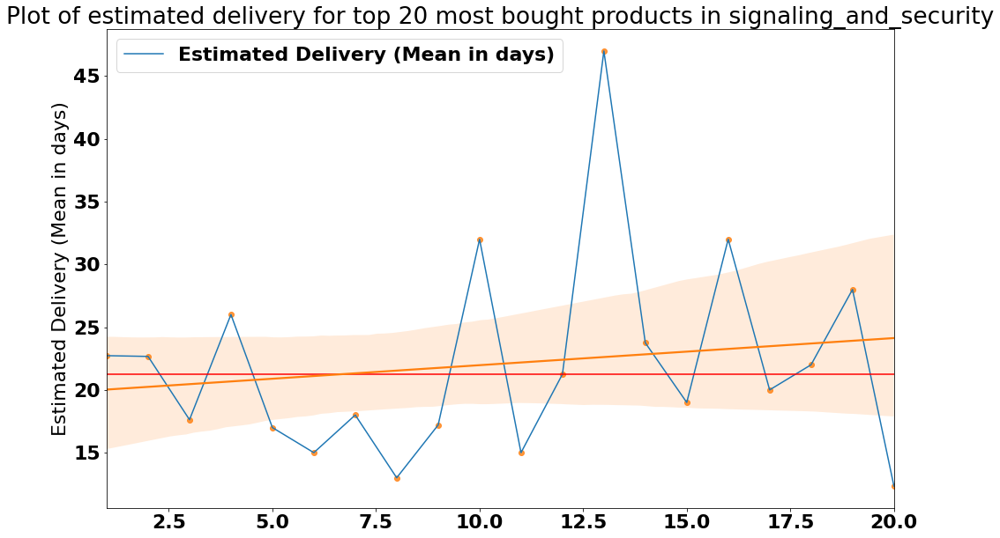

None
Top 20 most popular products in signaling_and_security


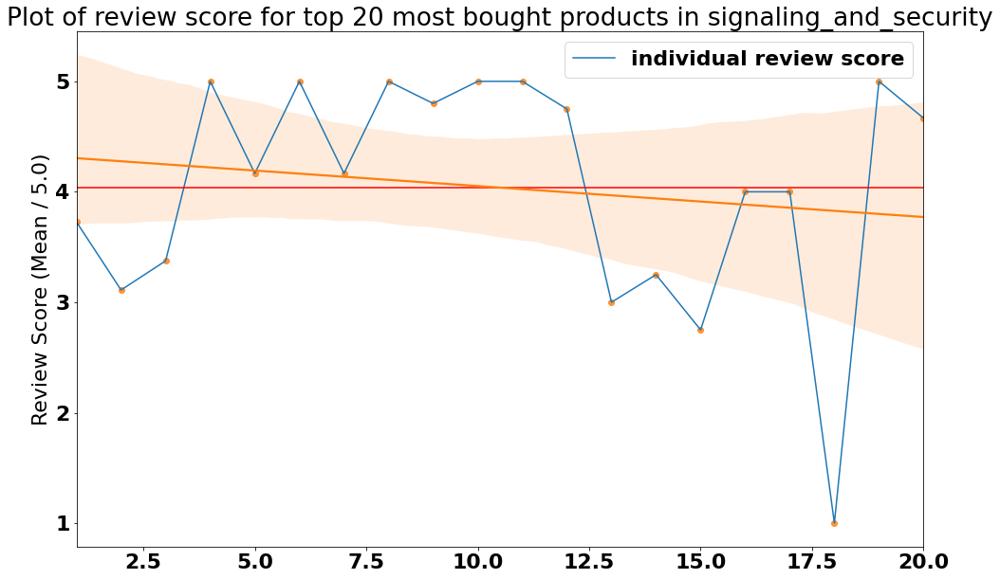

None


Top 20 most popular products in christmas_supplies
                          Product Id  Number of Orders  \
1   40e8b425d1a26e2d9cb77363523e05ce                22   
2   f59871b3d9da4c64cbe41ad3dd04dc14                10   
3   f3ccdb9f9c7f31e0efd626e9110b85f5                 9   
4   ac50a885bf3b6a817bf6a0a2f1e27af4                 8   
5   1522589c64efd46731d3522568e5bc83                 7   
6   dd72d83b749ec911396ef3337e00b633                 6   
7   19fee5d5b066841b45bc3e97832fa654                 6   
8   ffc0b406806006602c5853b00ab5f7fd                 6   
9   95d9994fadaf3720792cb0f1db17f782                 5   
10  ffef256879dbadcab7e77950f4f4a195                 5   
11  ab44178963b4bf809adc477810f9175d                 4   
12  9defbbbbd3c270b0c41dfcbf70582147                 3   
13  fdcf45aa23bb8312ecc0027d6e1ef1c4                 3   
14  1e5b160bf180293380b0d3e68bcc7ead                 3   
15  7dad8823339023bc68054e62d1e9a761                 2   
16  6516d379bf

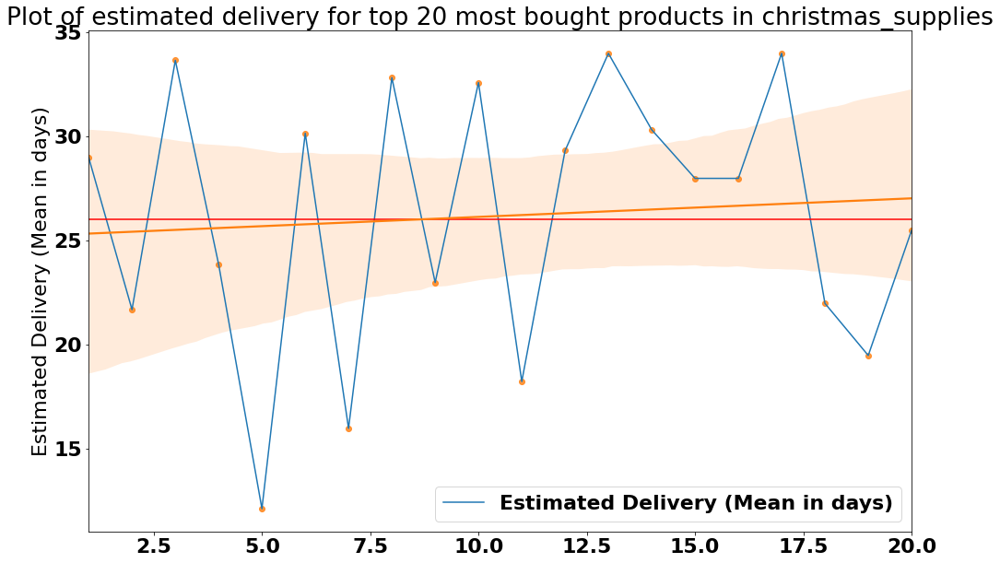

None
Top 20 most popular products in christmas_supplies


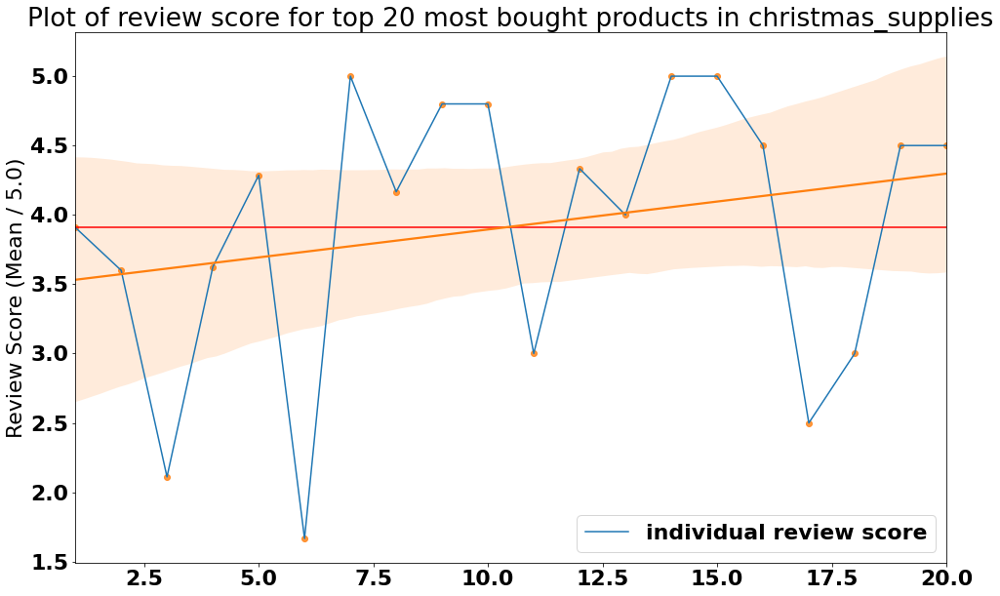

None


Top 20 most popular products in home_comfort_2
                         Product Id  Number of Orders  \
1  ec5b3c8bb77ad22278f6e9d719a83de3                27   
2  19de58ea609a59ce31f93672af50c09a                 1   
3  2072d4792ab7893ddbfc178948e0eb86                 1   
4  4fb3bad6b502eaca3b6d7d87bc1613a4                 1   
5  15dc5bc6f0f1e1a0d0255098726060c7                 1   

   Estimated Delivery (Mean in days)  Review Score (Mean / 5.0)  
1                          21.407407                   3.148148  
2                          23.000000                   5.000000  
3                          28.000000                   5.000000  
4                          25.000000                   5.000000  
5                           8.000000                   5.000000  
Top 20 most popular products in home_comfort_2


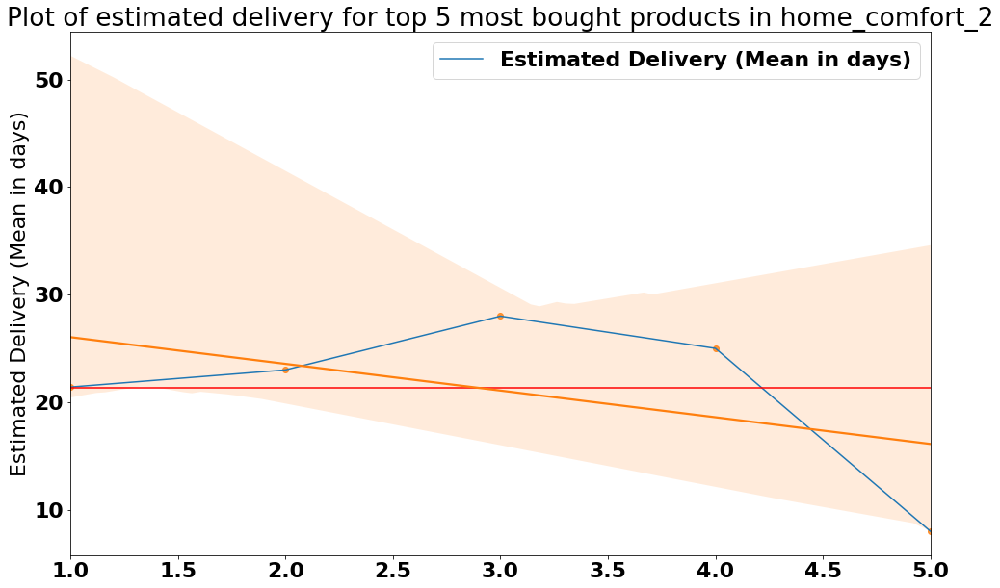

None
Top 20 most popular products in home_comfort_2


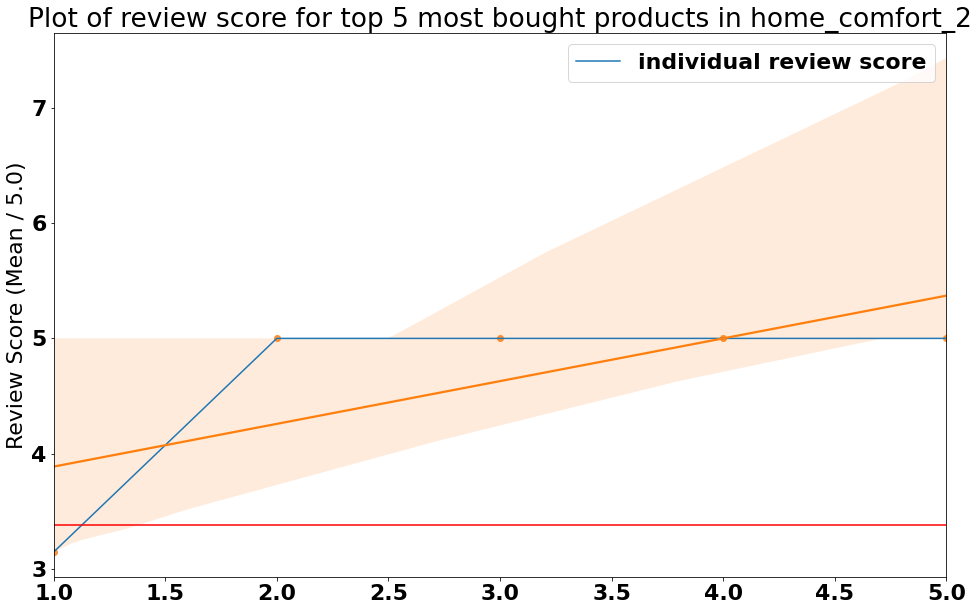

None


Top 20 most popular products in home_appliances
                          Product Id  Number of Orders  \
1   e5eadf9be70a4a9fa514019542fc330a                39   
2   be837f2e0152a208d4386f4126d5bd7c                36   
3   50d77758742285ff49f340ebdf0df5a7                21   
4   b30d7b0adcdc4a117f455472548155ec                15   
5   ab5da1daa941470d14366f4e76a99dd2                12   
6   a1f7dace2a9af48dd48428c12001dc09                12   
7   9c5cec867c62c0ec4674b002eb1c3e0c                11   
8   1347d4320dcd0acd750e37bb3d94a918                10   
9   43944a8f8f0b7ae86b6c3d3c2f257375                10   
10  f083f237cbf95dd0a5185e902f385dd5                10   
11  0820af09ddc75b84841b1fab4da4be9b                 9   
12  69b45497bec8e36af6fd1a31b2cd8f9f                 9   
13  ac20a9614b6db9e7289b85c4f4b6216a                 9   
14  2350c74f45b4009cbdab3fa73396c222                 9   
15  d66c729cd3b64c98515a18898c6b65c3                 8   
16  37470d8442773

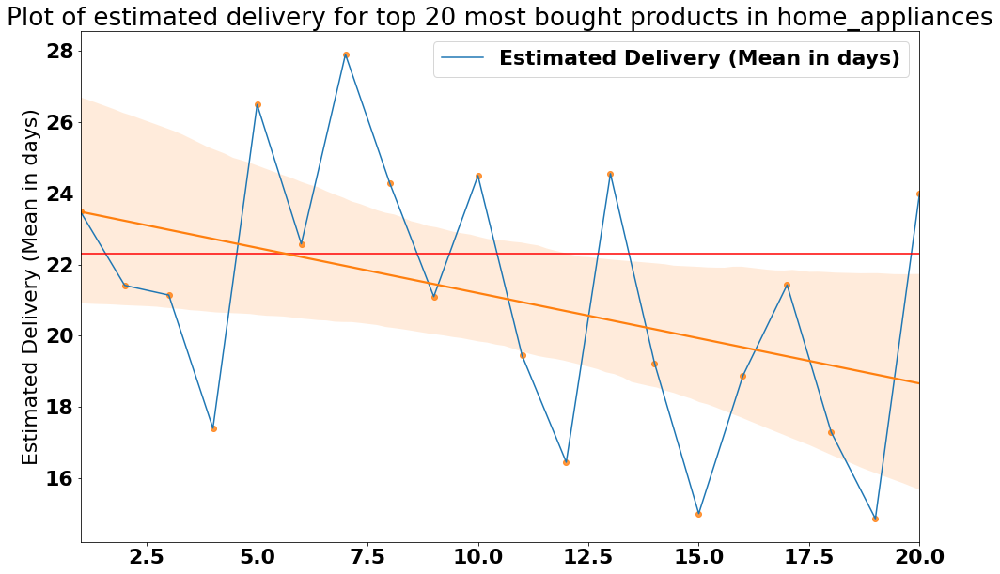

None
Top 20 most popular products in home_appliances


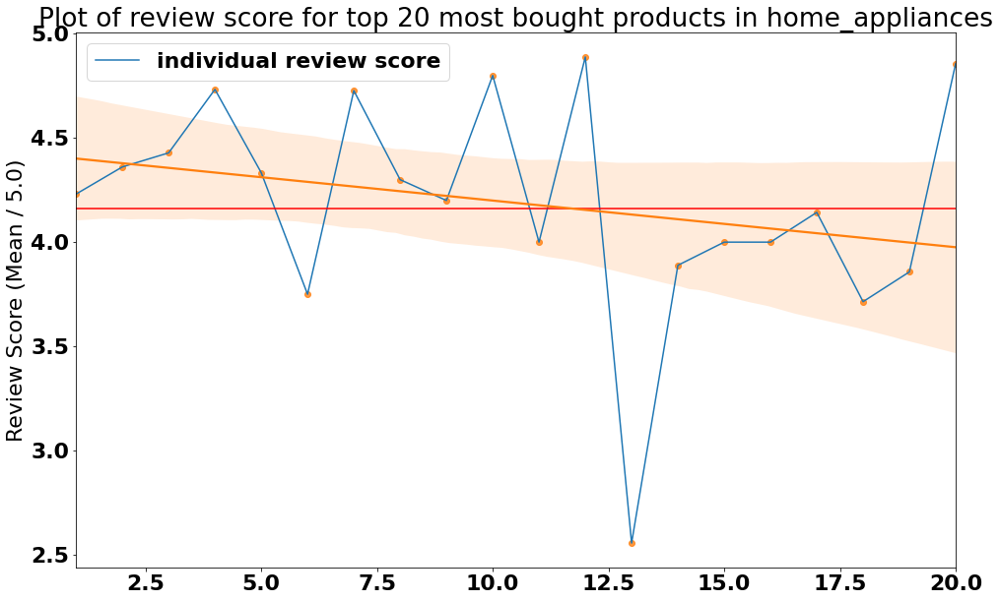

None


Top 20 most popular products in small_appliances_home_oven_and_coffee
                          Product Id  Number of Orders  \
1   f49e985b4cb2d0543890d6dd00077663                21   
2   0433830caca22b01a0f477d31307b043                 7   
3   ff92ca9bb0b3f4ec00a9b76c9f68cb3a                 7   
4   e5c50ee10712a01bfed9854a00502f8e                 4   
5   514171f9d45a3d93574fc587ef775579                 3   
6   4608a449f45011c89095f36265e75ec3                 3   
7   938e036a795cdacb18ed3c5a598f6cf0                 2   
8   a1e8d472af4a2704d41604cff9eeaaa5                 2   
9   58cda2faccdf7f8620e45b6a863efd3f                 2   
10  224037b21bfa8621e39c265513ee6594                 2   
11  56e04ad5959e2c30a6754d9cc1f098f2                 2   
12  7b2a6e3216a405943fc9e3acbff18cae                 2   
13  32bad49615b7c5da42609b98df97482c                 2   
14  31240eaae01b43247d878f3e89996e35                 2   
15  206ee9f28d05f04f891e3cef4b220dd1                 

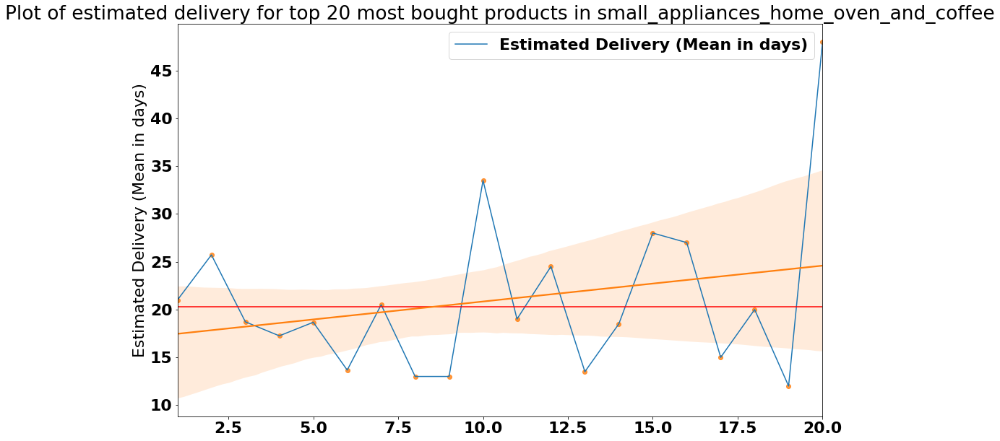

None
Top 20 most popular products in small_appliances_home_oven_and_coffee


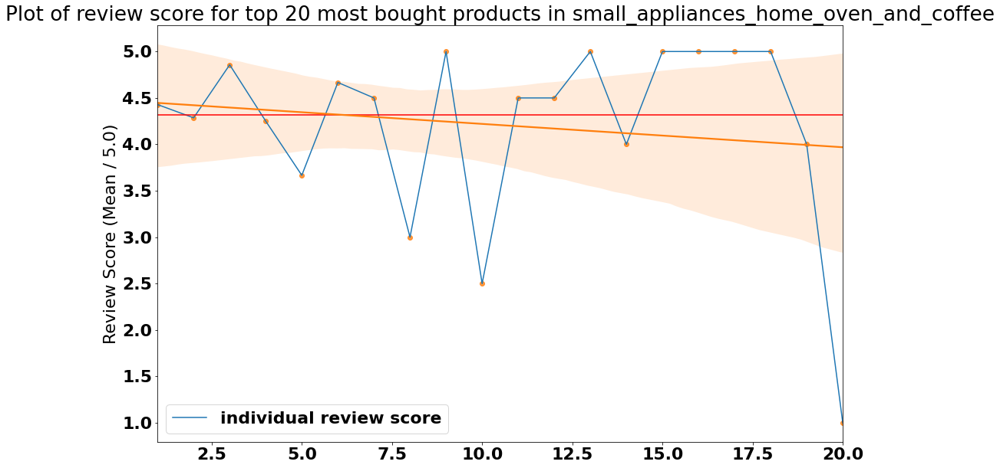

None


Top 20 most popular products in diapers_and_hygiene
                          Product Id  Number of Orders  \
1   3fdb534dccf5bc9ab0406944b913787d                14   
2   8323a7adeb57da21acea7e83563bed90                 8   
3   3cc7ec95300ba6432c64f0b12673bae6                 3   
4   6e7f4ae007302e93c5610894712289bb                 3   
5   f83fd2b539bc73678c65be8d418be8c1                 3   
6   a9e010c9e4e10e358d3baf52bb920893                 2   
7   f3412532ea4da687eaa6943639812bc3                 1   
8   059ee207a4d5628c8aefe497c3d088f3                 1   
9   5a92ef8a5a2511f0d2dff3ea562700ab                 1   
10  53e695484b71a194bf7d89b48700756a                 1   
11  47488bf996fd46283813059897e71e1e                 1   
12  00716e5593e8eea55dbe7a29b72a70bc                 1   

    Estimated Delivery (Mean in days)  Review Score (Mean / 5.0)  
1                           19.000000                   2.285714  
2                           23.750000               

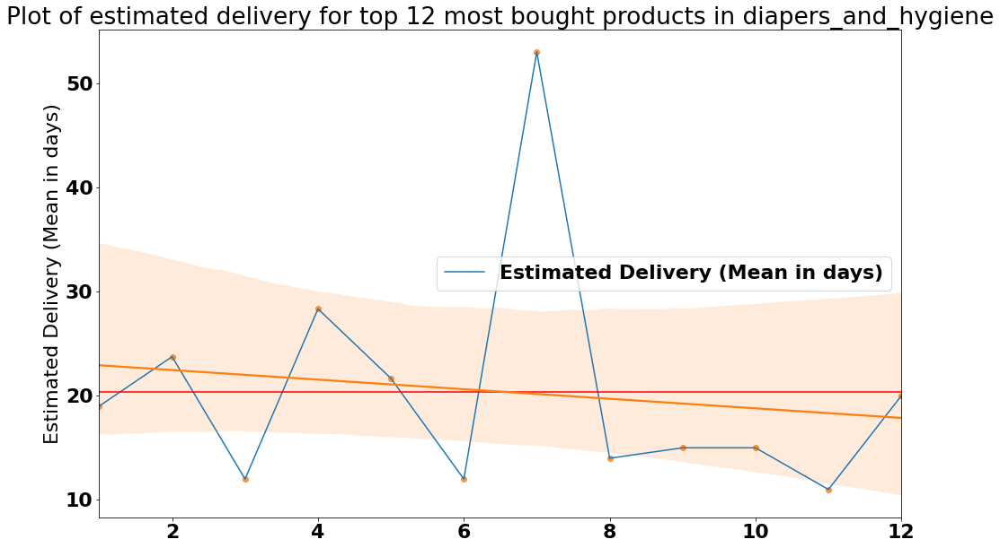

None
Top 20 most popular products in diapers_and_hygiene


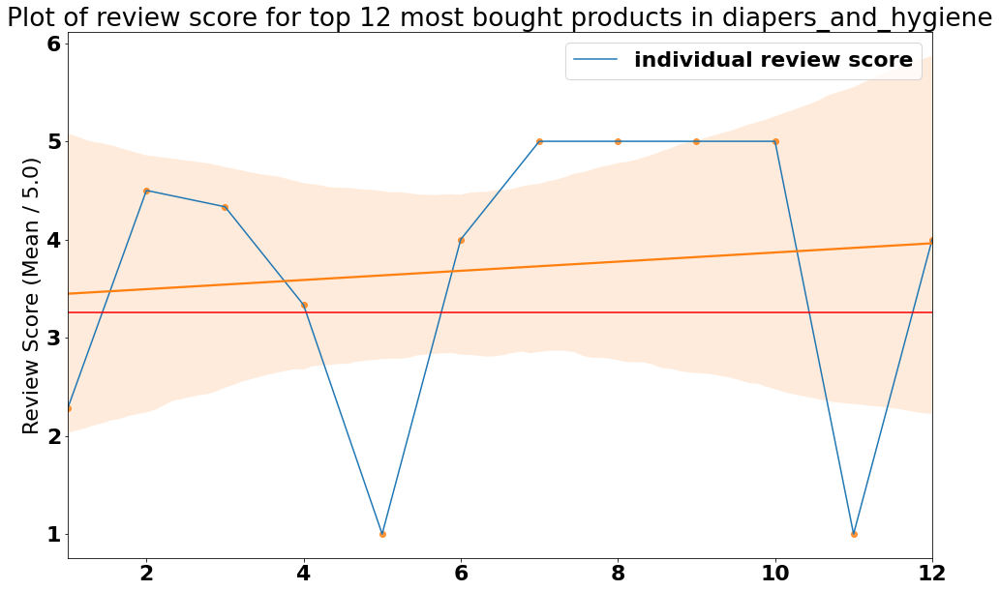

None


Top 20 most popular products in fashion_underwear_beach
                          Product Id  Number of Orders  \
1   fa1016994ec2803636ffb1018e33cf5b                14   
2   1de74e63d630007567726953a4eb2b36                13   
3   a70d74f54feefedd8108c45553766340                12   
4   a662d99595c3b6054702480cb7382afe                 8   
5   b73091f98b819cf7a339f74ece86aa4b                 8   
6   7932fcce65e2aee84d6feb4a288f9cb9                 8   
7   fa8485bc54eaad5b218cd8081c859568                 7   
8   ce149636a055d9eded4cde55da9ebd3b                 6   
9   3a3f0628722b2f548673a2f7f5fa5605                 5   
10  6b017e0d95d8765a6f2bed3bc272c61e                 4   
11  83639e59e789cf2ed557ebf817f1085c                 3   
12  cf944645d4ff2a3eed3ae17f641ea861                 3   
13  97ca99a3e712143b9cf17e31bf8f3367                 3   
14  e1a7aca09e5fc1209c44ef72571265b9                 3   
15  6f93544fde1ccc299aa371217cb2afa4                 3   
16  0b502

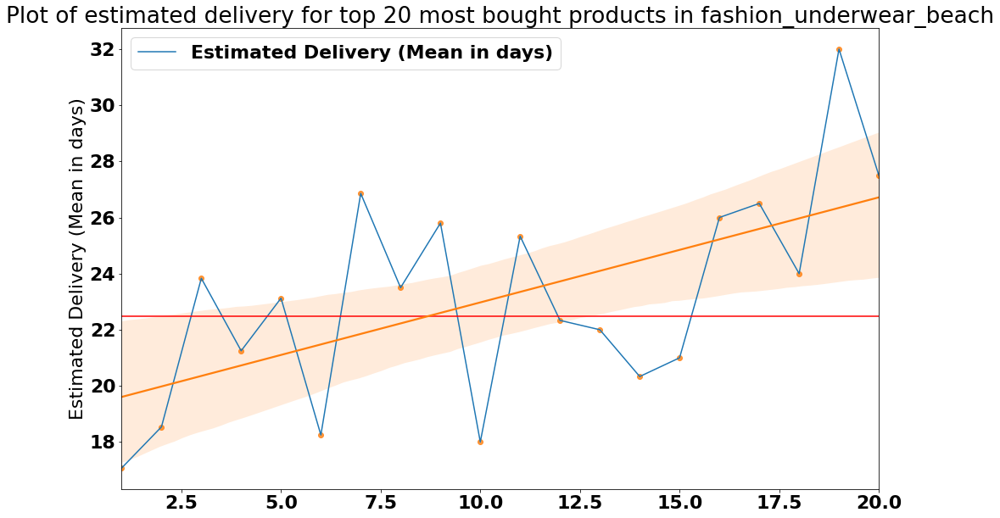

None
Top 20 most popular products in fashion_underwear_beach


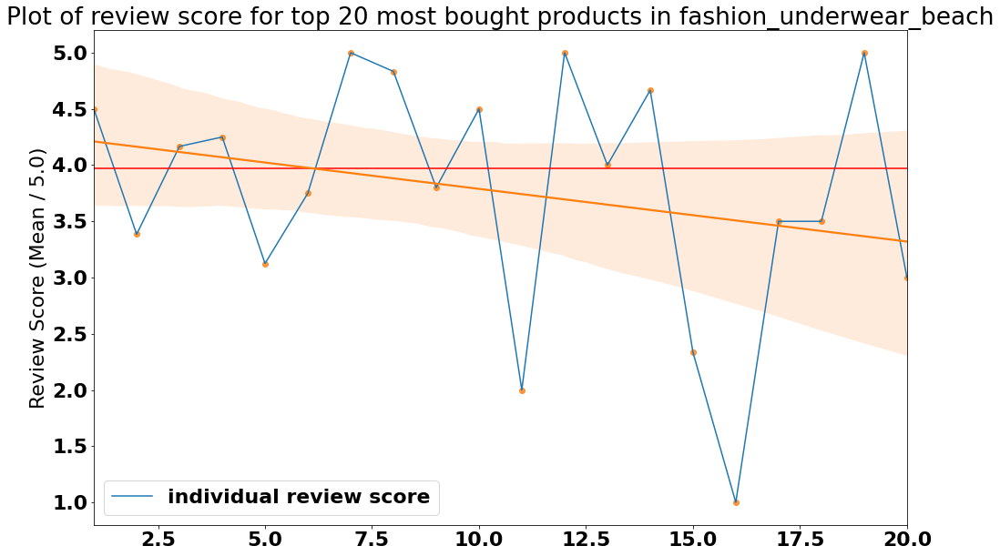

None


Top 20 most popular products in fashion_male_clothing
                          Product Id  Number of Orders  \
1   e336c656869480e20d04ca9389b12167                13   
2   22656f41604127818c5984157e52bda8                 6   
3   ce04dcb7aa96ad49d4933f3d4a9f8eb7                 5   
4   d2ba9fb97c0a861f8a62383c434e3e1d                 5   
5   dd231637766e756fd1cf2fd80501fce1                 5   
6   e80a0c4b0bb3f2f171f0fe8360513d90                 3   
7   e12569a1ad365c9f77fb1ae6d5de26e8                 3   
8   a8e35f118bd7f9b1d38fc786b555d210                 3   
9   80a29790293a83b877cb353f5ae338e1                 3   
10  8cf306b87f5f0832d70505004465e39f                 3   
11  716854aa9d670cabfec04c7eeddd85b8                 2   
12  24dea9b9a1d450d96702d46a0a835ff3                 2   
13  4325528d61b94383829ce61040c858ed                 2   
14  d0168e734683113fd73658071715084a                 2   
15  b2b3fbcc207fc52d44daff257e7c491c                 2   
16  e8c68ed

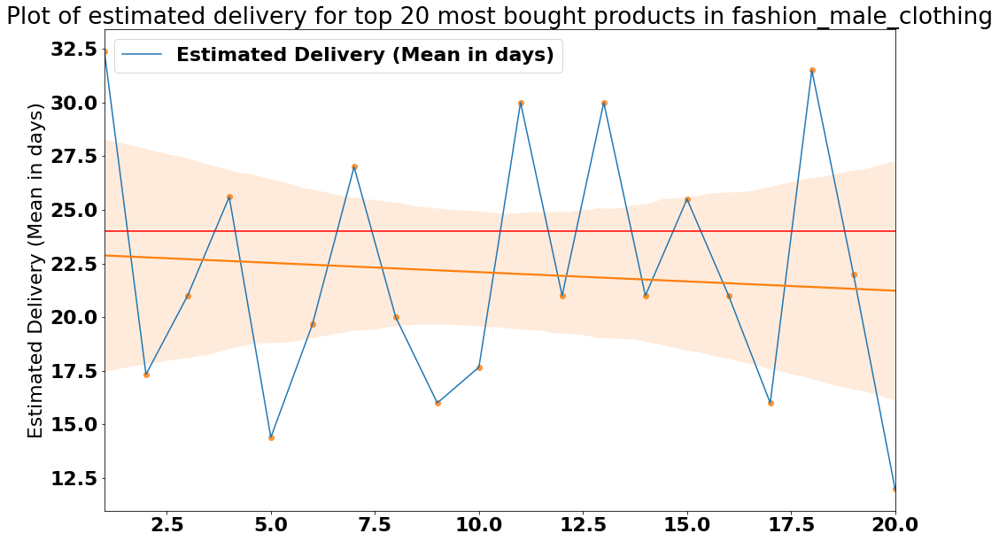

None
Top 20 most popular products in fashion_male_clothing


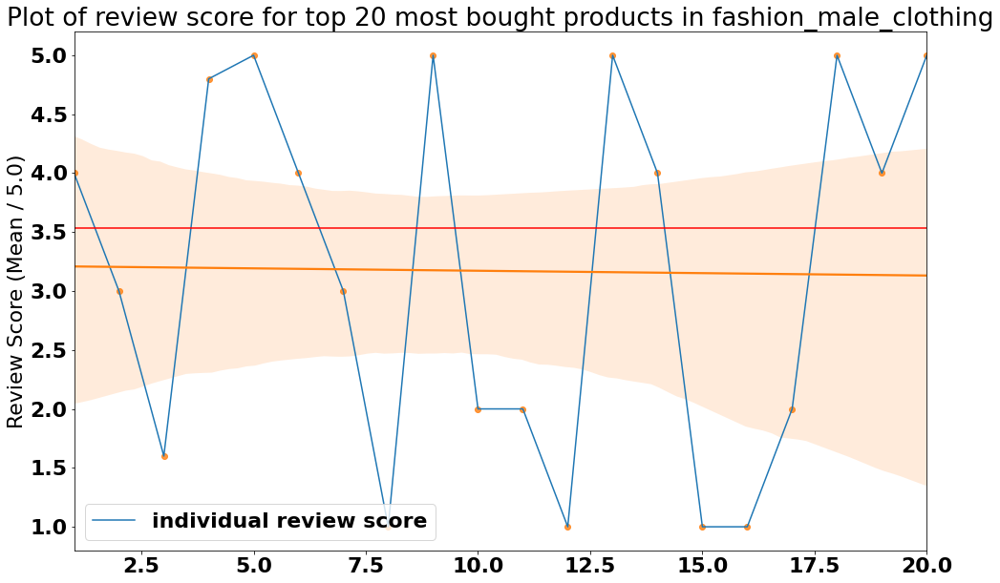

None


Top 20 most popular products in fashio_female_clothing
                          Product Id  Number of Orders  \
1   63cf4d771cba1d380af927afe5895d4b                 8   
2   bfa393df5b4494bea7158660999a921b                 6   
3   6e02baf23db1455640241542c78be139                 5   
4   8b100f92b312e18e03f0ee8f0c0011bd                 3   
5   c4cca1d23088d10099f52159878b6686                 2   
6   e03f4e4044f06ae9349b2f891e614923                 2   
7   1f05dcc70c1a19407641eccea8ef3bdc                 2   
8   cfbf1eb673c7eba9e2f58d9375e902b1                 2   
9   905b0c0ebfb5ea28af1b5cfb97bbbd27                 2   
10  69530f4ebf4b017348e5f19323ab8a00                 1   
11  e726b00d6143d630f1635740d8a265c2                 1   
12  6d8e78c479334cba03552e61a97eca2e                 1   
13  bc0d2d816d425e6ce3e80d8b9887d324                 1   
14  dd12801e4d1919e84bf6f90167f22fb5                 1   
15  89f46d1e213867388c2fac6078f5c06d                 1   
16  621b15

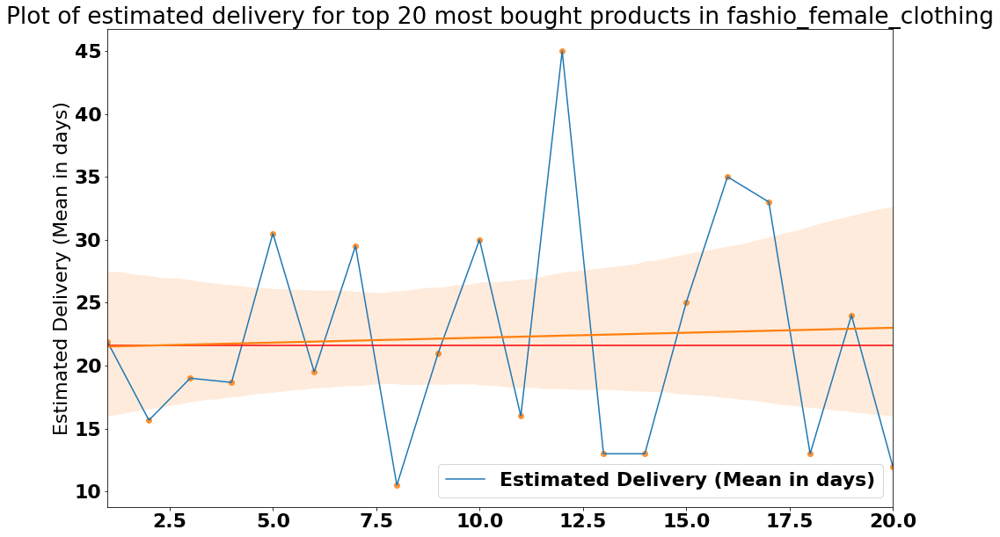

None
Top 20 most popular products in fashio_female_clothing


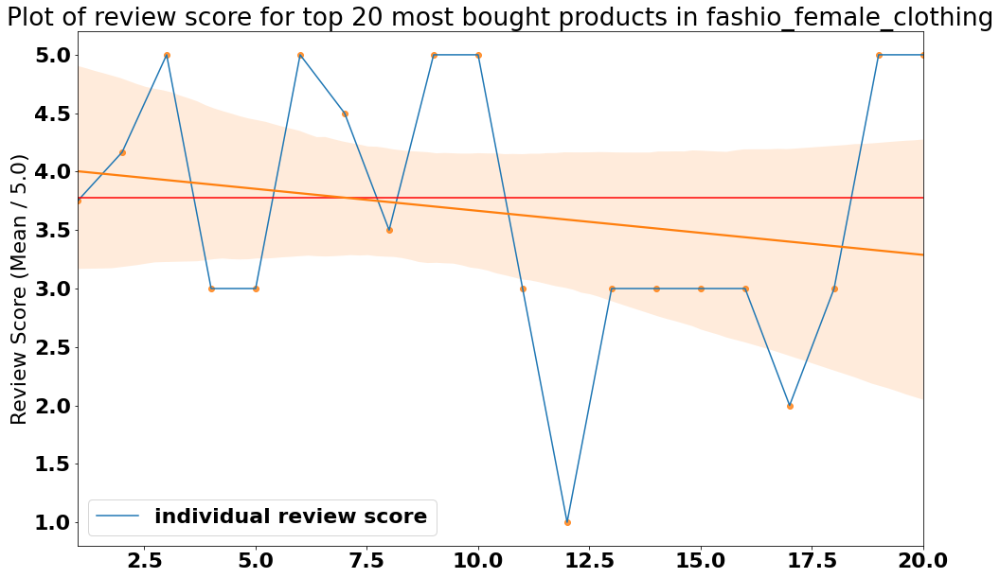

None


Top 20 most popular products in books_imported
                          Product Id  Number of Orders  \
1   68ad45d48d69404aeb71ce87e1b2c948                 8   
2   82d7b276f49e72ffce78d10b20518808                 7   
3   98d893a81a1845b6f278f33eee0a4f36                 7   
4   7515ab3fc02c8f43b07e9451497fb13e                 5   
5   fde71f25e699ca0a2a83a6c3a249b816                 3   
6   59c2f10b8a2fb03ed30afa9bb77c9b9f                 3   
7   5b668636d65ddf4e4109c6d8fb13ea56                 2   
8   de8079863f52e090930c58a327e8c8e1                 2   
9   0c787112ac1b5dce38f58d7feb8c23d7                 2   
10  81fe540cb0119e1d4ef5f191701b3cb9                 2   
11  372a9ccafbec639bad6b93dac67e6b85                 1   
12  e96a50fc74fa04fd6f23b324d87a1a81                 1   
13  bf7e253a79f85c001ccefc2827a0fc25                 1   
14  f4c6e3643d47244bec4766d72c07ac4f                 1   
15  604f77463358e12a3154c65cf2c5d3d5                 1   
16  019003324f0a20

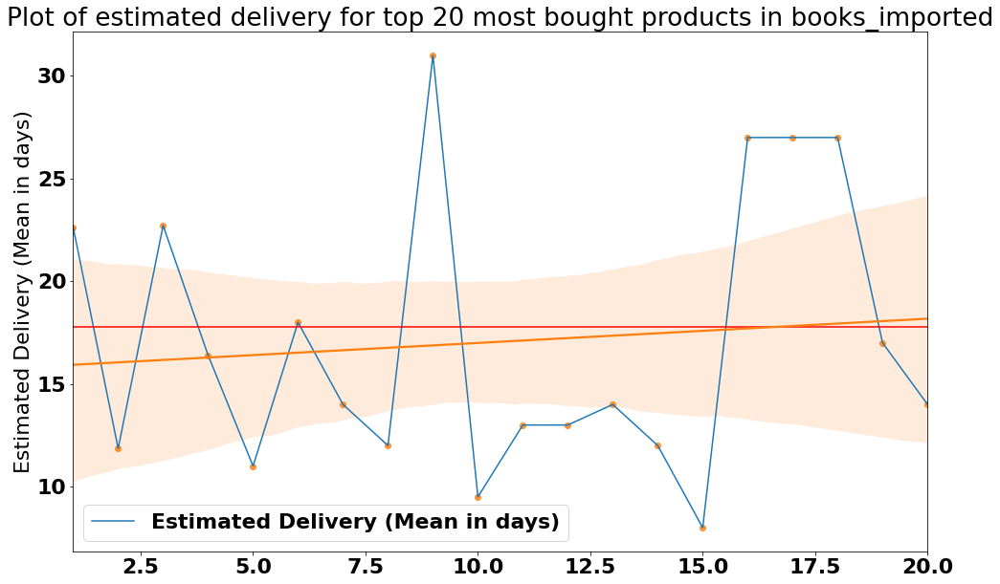

None
Top 20 most popular products in books_imported


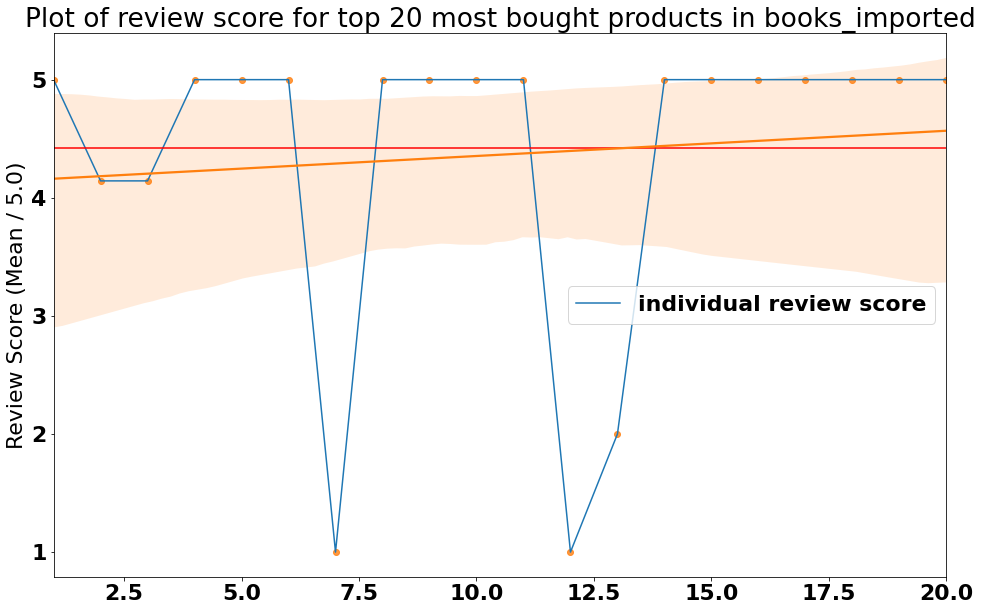

None


Top 20 most popular products in cds_dvds_musicals
                         Product Id  Number of Orders  \
1  1dceebcc5f23c02ea23e16d5bedca000                14   

   Estimated Delivery (Mean in days)  Review Score (Mean / 5.0)  
1                          25.857143                   4.642857  
Top 20 most popular products in cds_dvds_musicals
Top 20 most popular products in furniture_mattress_and_upholstery
                          Product Id  Number of Orders  \
1   726b4e18f00255e2e63491bcba3f60b8                22   
2   f4b3b257580c1430e51d71dd731273c2                 6   
3   ed5783fe4b2194c66043e77b648ff4cb                 3   
4   5f5d009b0eed255c950e16ccad915ff7                 3   
5   dc36a7859b743d8610a2bbbaea26ece9                 2   
6   107fde0930956120d1e13dd1062fbb46                 1   
7   af87aa3f5f2c05c8c4db6bee2088672b                 1   
8   c3d08bab8c7c6d9cc1f6cfb5a465c80b                 1   
9   eaa3fffe22b0b5efe02db64ab9d3bf84                 1   


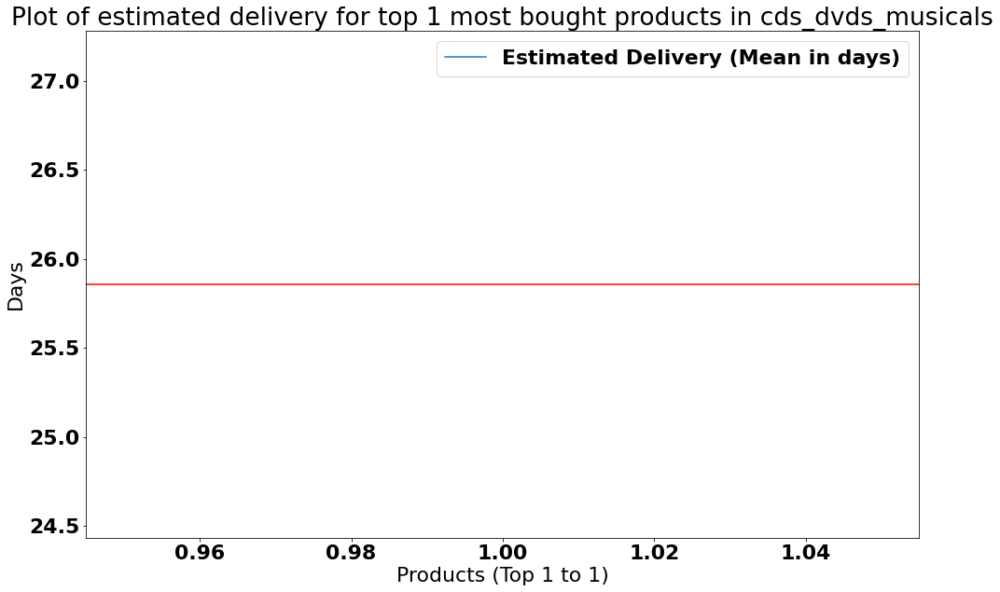

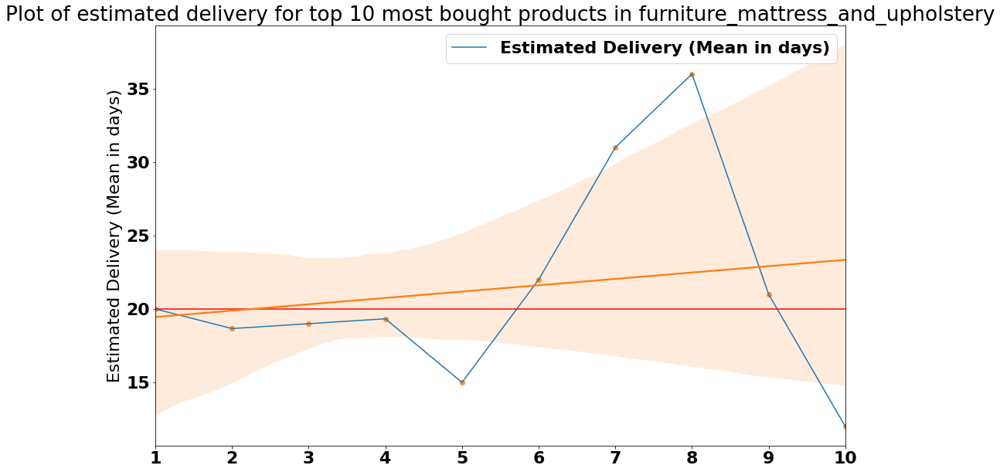

None
Top 20 most popular products in furniture_mattress_and_upholstery


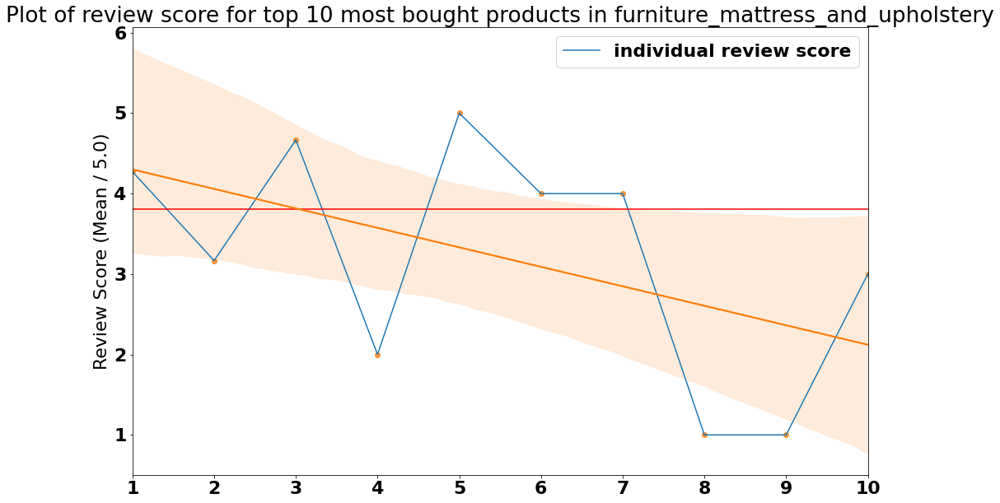

None


Top 20 most popular products in costruction_tools_tools
                          Product Id  Number of Orders  \
1   5e53af05c040b01584b81b3549945faf                18   
2   e5f20b4eb944eaae0a13bed3187201d3                11   
3   2c8e38b2b220b65a306d88444defb4fd                10   
4   d19c5ff1a4d4e8b0558536d57cf43cf7                 9   
5   04433a8021475a2002663f94203c88da                 7   
6   4b7de4748108b5353b211255e867cf6a                 4   
7   ba819ec203c9a9382f87d49898692520                 4   
8   c8eca123751676bbdaaa9e4a84721362                 3   
9   5ddd4525c6d0fbca9dc118056fd90d61                 3   
10  27ea0ddcb5e3a371b14a9ef16607676f                 3   
11  7ae1a5d0600076501c7ff50c63938b48                 2   
12  e2a0cbe7edb791b26eb99b535e8ab0e0                 2   
13  3cdb91cbeb22b6e87c8b595b68dfd5eb                 2   
14  93201ae32ea7725876739ba9f0d2c851                 2   
15  c47c31505404caa7fa20edad4b971746                 1   
16  ad7ae

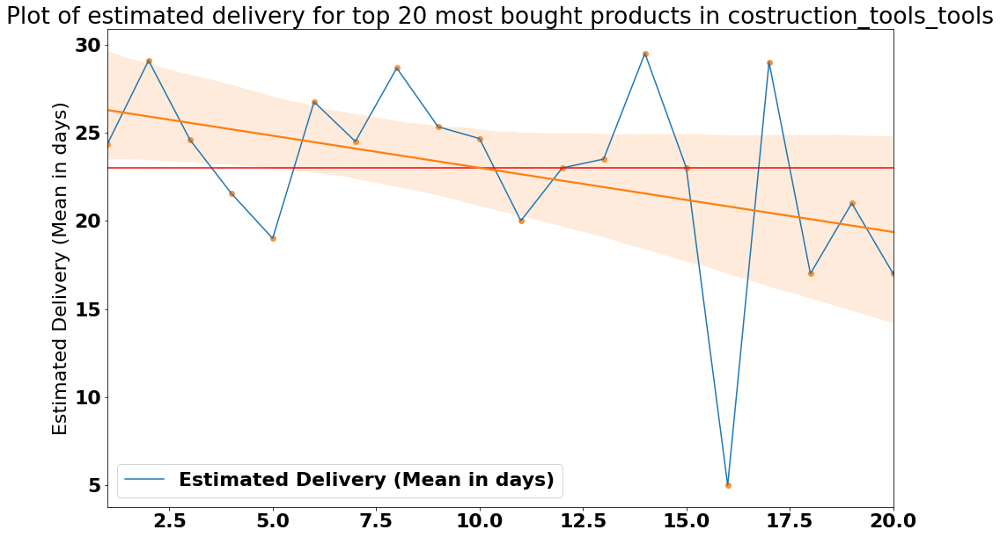

None
Top 20 most popular products in costruction_tools_tools


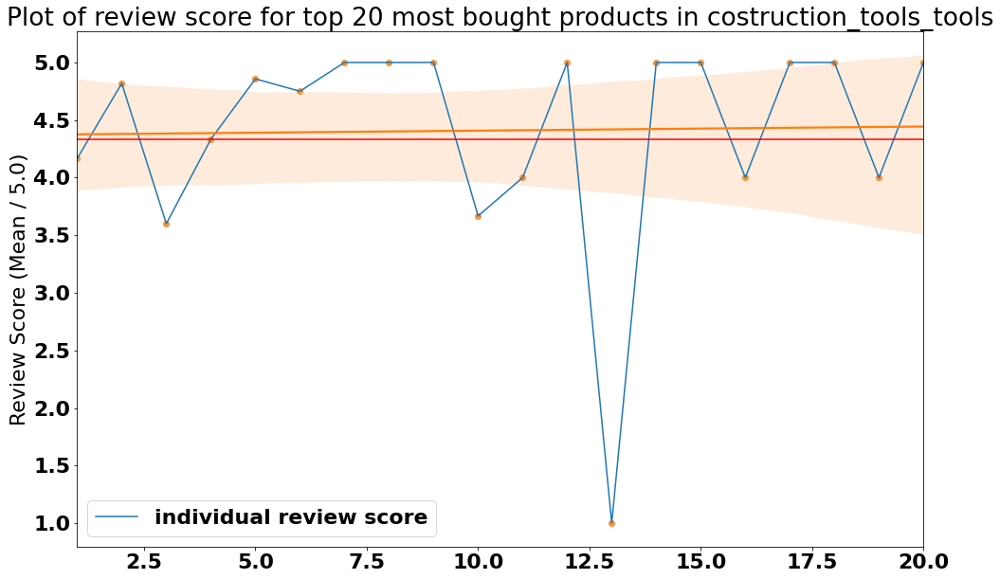

None


Top 20 most popular products in security_and_services
                         Product Id  Number of Orders  \
1  8db75af9aed3315374db44d7860e25da                 1   
2  6c7a0a349ad11817745e3ad58abd5c79                 1   

   Estimated Delivery (Mean in days)  Review Score (Mean / 5.0)  
1                               21.0                        1.0  
2                               39.0                        4.0  
Top 20 most popular products in security_and_services


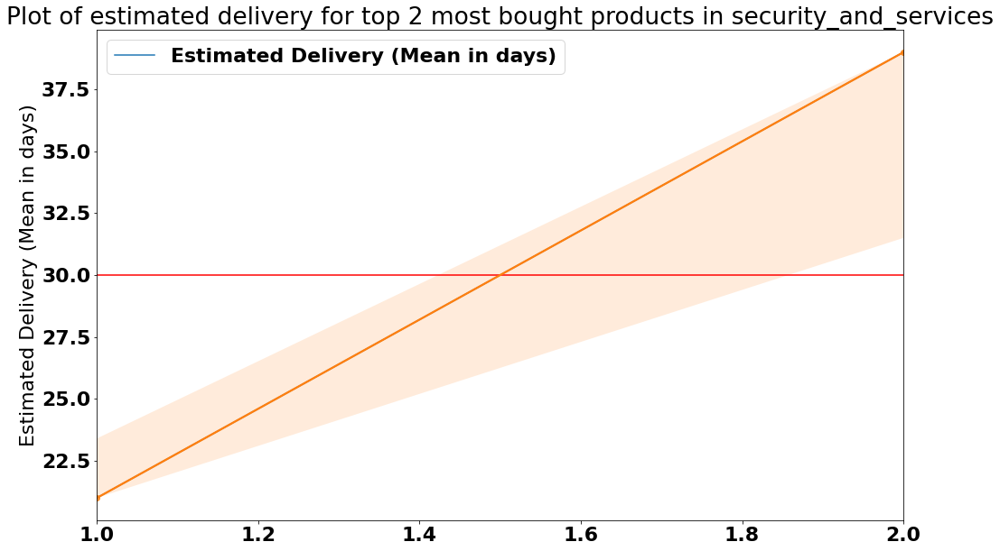

None
Top 20 most popular products in security_and_services


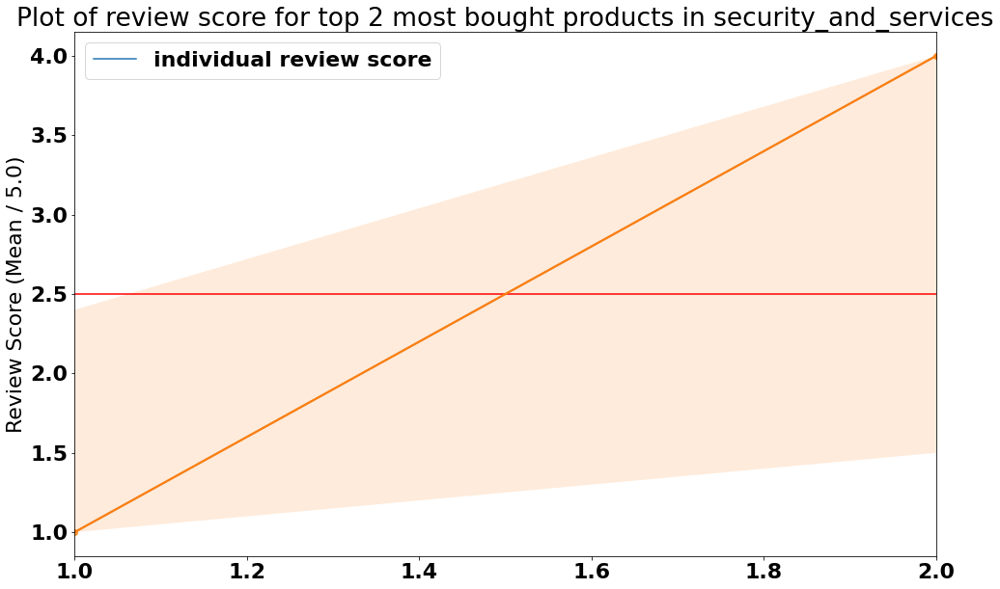

None




In [0]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
# with pd.set_option('display.expand_frame_repr', False):
    for i in list_cat:
        try:
            print(most_pop(i))
            print(plot_est(i))
            print(plot_rev(i))
            print('\n')
        except:
          continue

In [0]:
print('Total number of customers')
final_merge_eng.customer_id.nunique()

Total number of customers


97255

In [0]:
list_cus=final_merge_eng.customer_id.unique().tolist()

In [0]:
print('Top 300 most frequent buyers')
list_top_300 = final_merge_eng.customer_id.value_counts().sort_values()[::-1][:300].index.tolist()
final_merge_eng.customer_id.value_counts().sort_values()[::-1][:300] 

Top 300 most frequent buyers


270c23a11d024a44c896d1894b261a83    63
13aa59158da63ba0e93ec6ac2c07aacb    38
9af2372a1e49340278e7c1ef8d749f34    29
92cd3ec6e2d643d4ebd0e3d6238f69e2    26
2ba91e12e5e4c9f56b82b86d9031d329    24
                                    ..
94a265c7d6fa0389f4fec04d4eae8b66     6
ac5fff54784cd57c4f30e4e90639c8a3     6
20c6d809dfbc5aa2dec5652ee604a91f     6
7887f43daaa91055f85b6dd23cccdfcb     6
915b040fe51ec246edf9bd062ee7da8b     6
Name: customer_id, Length: 300, dtype: int64

In [0]:
def most_pop_cus(cat):
    df = final_merge_eng[final_merge_eng['customer_id']==cat]
    # print('Buying characteristics for '+ cat)
    lis=[]
    count = len(df)
    esti = df['estimated days'].mean()
    rev = df['review_score'].mean()
    lis.append(count)
    lis.append(esti)
    lis.append(rev)
    lis.append(cat)
    output = pd.DataFrame([lis], columns =[ 'Number of Orders','Estimated Delivery (Mean)','Review Score (Mean)','Customer Id'])
    return output

In [0]:
list_cus_stats=[]
for i in list_top_300:
    list_cus_stats.append(most_pop_cus(i))
def cus_out(lis):
    output=pd.concat(lis, ignore_index=True)
    return output
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#     print(cus_out(list_cus_stats))
cus_out(list_cus_stats)

,Number of Orders,Estimated Delivery (Mean),Review Score (Mean),Customer Id
0,63,21.0,5.0,270c23a11d024a44c896d1894b261a83
1,38,27.0,5.0,13aa59158da63ba0e93ec6ac2c07aacb
2,29,25.0,1.0,9af2372a1e49340278e7c1ef8d749f34
3,26,18.0,5.0,92cd3ec6e2d643d4ebd0e3d6238f69e2
4,24,15.0,1.0,2ba91e12e5e4c9f56b82b86d9031d329
...,...,...,...,...
295,6,29.0,5.0,94a265c7d6fa0389f4fec04d4eae8b66
296,6,26.0,3.0,ac5fff54784cd57c4f30e4e90639c8a3
297,6,12.0,1.0,20c6d809dfbc5aa2dec5652ee604a91f
298,6,19.0,5.0,7887f43daaa91055f85b6dd23cccdfcb


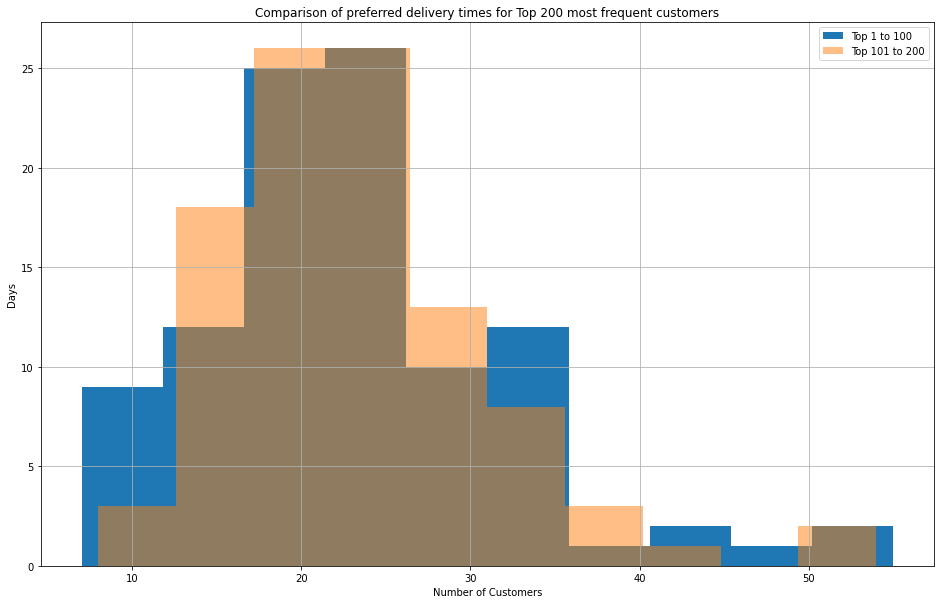

In [0]:
cus_df = cus_out(list_cus_stats)
cus_df1 = cus_df[:100]
cus_df2 = cus_df[100:200]
# cus_df3 = cus_df[200:300]
plt.figure(figsize=(16,10))
cus_df1['Estimated Delivery (Mean)'].hist(label='Top 1 to 100')
cus_df2['Estimated Delivery (Mean)'].hist(alpha = 0.5,label='Top 101 to 200')
# cus_df3['Estimated Delivery (Mean)'].hist(alpha = 0.3,label='Top 201 to 300')
plt.legend()
plt.title('Comparison of preferred delivery times for Top 200 most frequent customers')
plt.ylabel('Days')
plt.xlabel('Number of Customers')
# cus_df['Review Score (Mean)'].hist()
plt.show()

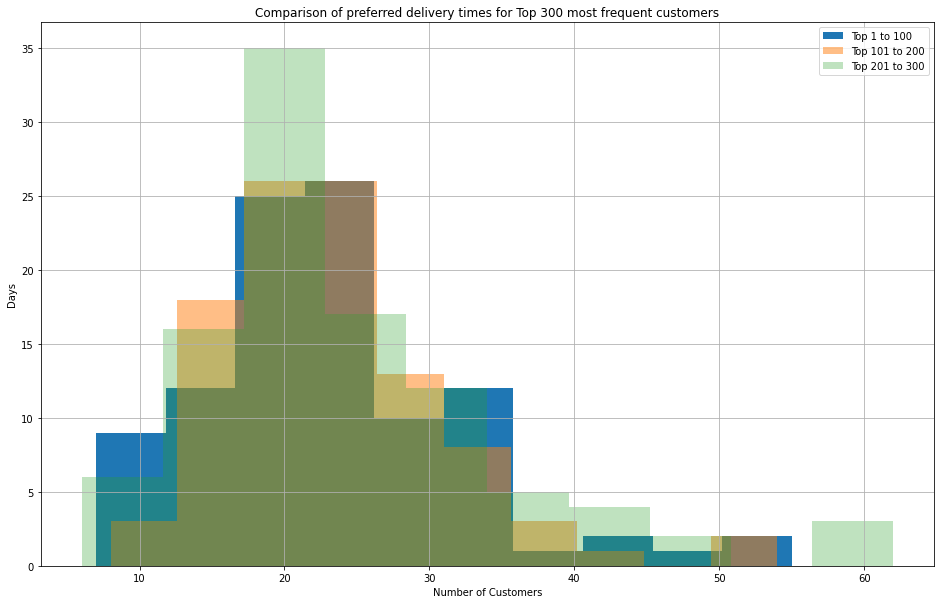

In [0]:
cus_df = cus_out(list_cus_stats)
cus_df1 = cus_df[:100]
cus_df2 = cus_df[100:200]
cus_df3 = cus_df[200:300]
plt.figure(figsize=(16,10))
cus_df1['Estimated Delivery (Mean)'].hist(label='Top 1 to 100')
cus_df2['Estimated Delivery (Mean)'].hist(alpha = 0.5,label='Top 101 to 200')
cus_df3['Estimated Delivery (Mean)'].hist(alpha = 0.3,label='Top 201 to 300')
plt.legend()
plt.title('Comparison of preferred delivery times for Top 300 most frequent customers')
plt.ylabel('Days')
plt.xlabel('Number of Customers')
# cus_df['Review Score (Mean)'].hist()
plt.show()

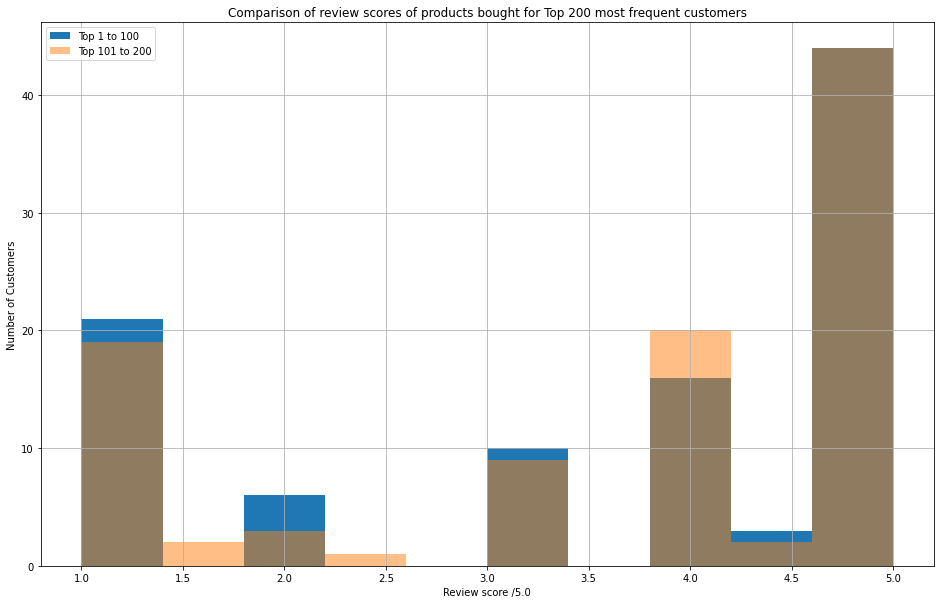

In [0]:
cus_df = cus_out(list_cus_stats)
cus_df1 = cus_df[:100]
cus_df2 = cus_df[100:200]
plt.figure(figsize=(16,10))
cus_df1['Review Score (Mean)'].hist(label='Top 1 to 100')
cus_df2['Review Score (Mean)'].hist(alpha = 0.5,label='Top 101 to 200')
plt.legend()
plt.title('Comparison of review scores of products bought for Top 200 most frequent customers')
plt.xlabel('Review score /5.0')
plt.ylabel('Number of Customers')
plt.show()

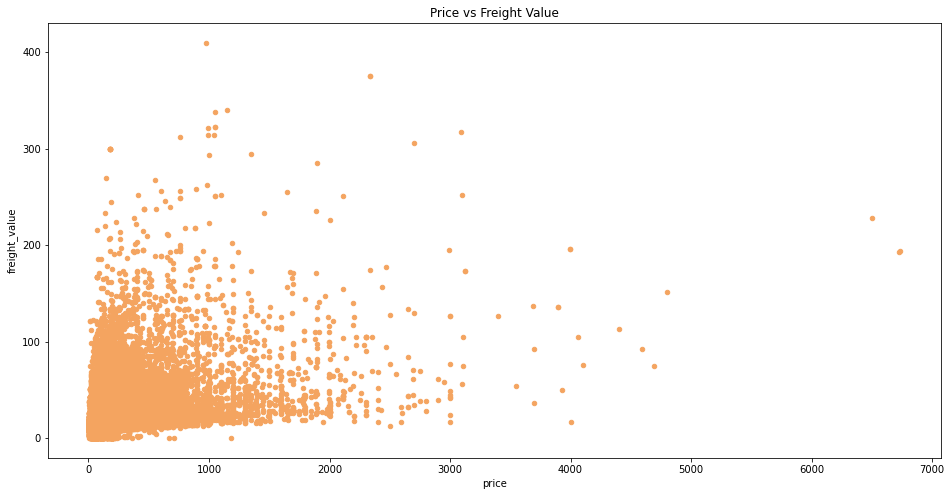

In [0]:
final_merge_eng.plot.scatter(x = 'price', y = 'freight_value',
                  color = 'sandybrown', title = 'Price vs Freight Value',figsize=(16,8))
plt.show()

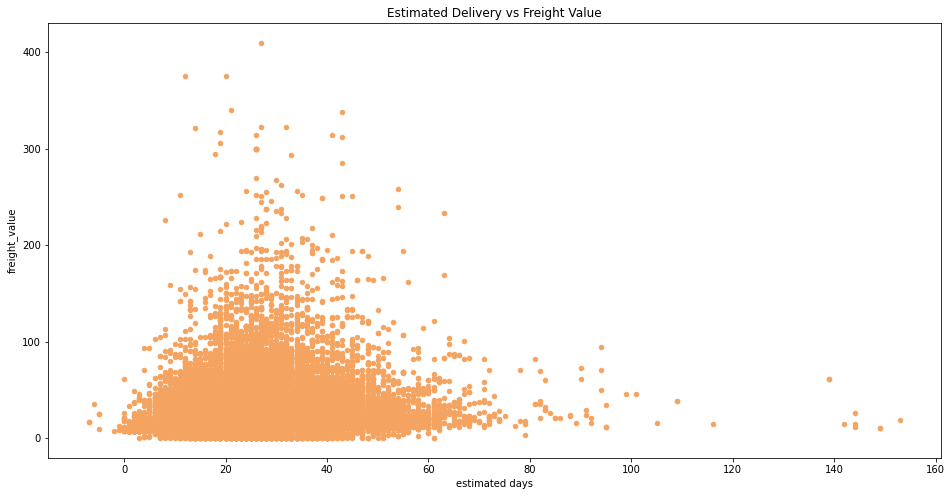

In [0]:
final_merge_eng.plot.scatter(x = 'estimated days', y = 'freight_value',
                  color = 'sandybrown', title = 'Estimated Delivery vs Freight Value',figsize=(16,8))
plt.show()

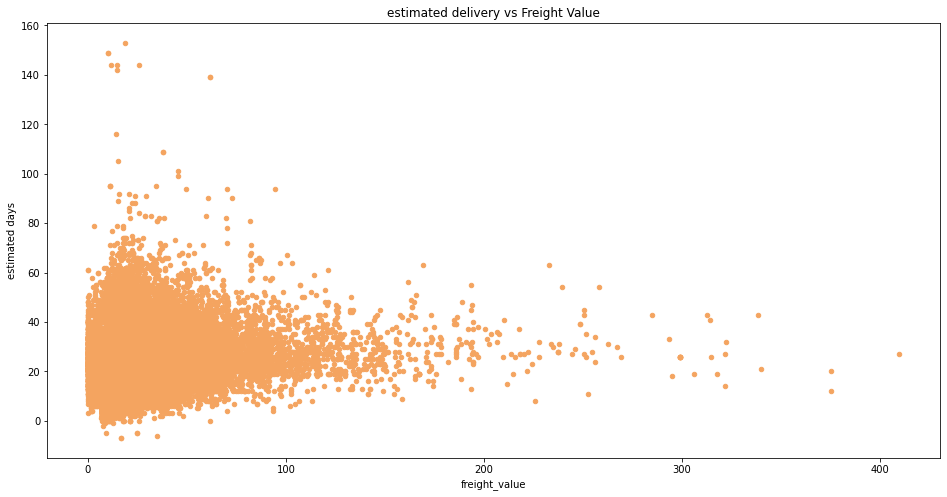

In [0]:
final_merge_eng.plot.scatter(x = 'freight_value', y = 'estimated days',
                  color = 'sandybrown', title = 'estimated delivery vs Freight Value',figsize=(16,8))
plt.show()

In [0]:
def instl(amt):
    final_merge_eng[final_merge_eng['price']>amt]['payment_installments'].hist()
    plt.title('Customers who pay by installments (price > '+str(amt)+' BRL)')
    plt.xlabel('Number of installments')
    plt.ylabel('Orders')
    plt.figure(figsize=(16,10))
    plt.show()

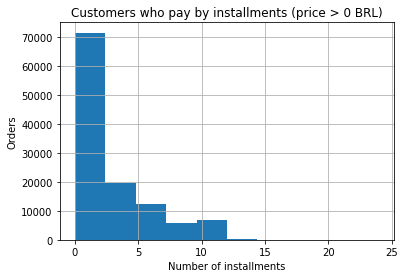

<Figure size 1152x720 with 0 Axes>

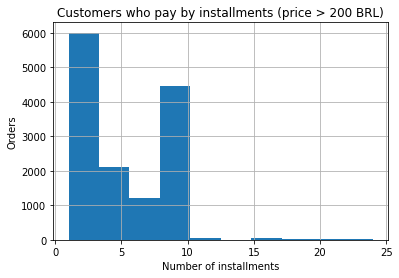

<Figure size 1152x720 with 0 Axes>

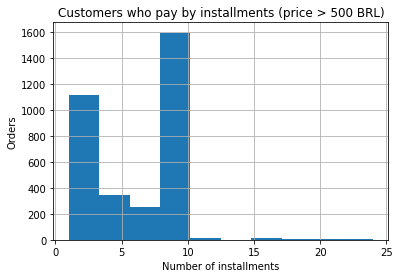

<Figure size 1152x720 with 0 Axes>

In [0]:
for i in [0,200,500]:
    instl(i)